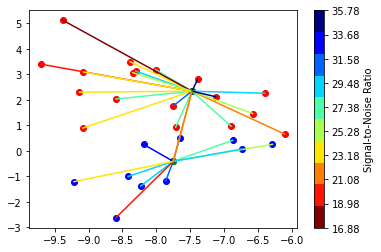

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset
import syft as sy
import numpy as np
from Dataset import load_dataset, getImage
from utils import averageModels
from utils import averageModelscluster
import random
import math
import matplotlib.pyplot as plt
from modifying_KMeans_snr import cluster_former
import copy

In [2]:
P=2 #signal power threshold
#stream = BitStream()
#random.seed(10)
key=[]
for i in range (10000): #generating a random password to activate training (Pilot signal)
    temp=random.randint(0,1)
    key.append(temp)

key1=[0]*len(key)
for i in range (len(key)):   #bpsk modulation
    if(key[i]==1):
        #print("yay")
        key1[i]=-math.sqrt(P)
    else:
        key1[i]=math.sqrt(P)

#print(key)
        
key_np=np.array(key1)

In [3]:
class Arguments():
    def __init__(self):
        self.images = 10000
        self.clients = 30
        self.rounds = 200
        self.epochs = 3
        self.local_batches = 64
        self.lr = 0.01
        self.C = 1 #fraction of clients used in the round
        self.drop_rate = 0 #fraction of devices in the selected set to be dropped for various reasons
        self.torch_seed = 0 #same weights and parameters whenever the program is run
        self.log_interval = 64
        self.iid = 'noniid'
        self.split_size = int(self.images / self.clients)
        self.samples = self.split_size / self.images 
        self.use_cuda = False
        self.save_model = True
        self.csi_low=0
        self.csi_high=1

args = Arguments()

In [4]:
#checking if gpu is available
#use_cuda = args.use_cuda and torch.cuda.is_available()
use_cuda=False
device = torch.device("cuda:0" if use_cuda else "cpu")
kwargs = {'num_workers': 1, 'pin_memory': True} if use_cuda else {}

hook = sy.TorchHook(torch)
me = hook.local_worker
clients = []

#generating virtual clients
for i in range(args.clients):
    clients.append({'hook': sy.VirtualWorker(hook, id="client{}".format(i+1))})
#print(clients)

In [5]:
global_train, global_test, train_group, test_group = load_dataset(args.clients, args.iid) #load data

for inx, client in enumerate(clients):  #return actual image set for each client
    trainset_ind_list = list(train_group[inx]) 
    client['trainset'] = getImage(global_train, trainset_ind_list, args.local_batches)
    client['testset'] = getImage(global_test, list(test_group[inx]), args.local_batches)
    client['samples'] = len(trainset_ind_list) / args.images #useful while taking weighted average


/home/iiitd/anaconda3/envs/FL/lib/python3.8/site-packages/torchvision/datasets/mnist.py:45: UserWarning: train_labels has been renamed targets
  warnings.warn("train_labels has been renamed targets")


In [6]:
#load dataset for global model (to compare accuracies)
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.1307,), (0.3081,))])
global_test_dataset = datasets.MNIST('./', train=True, download=True, transform=transform)
global_test_dataset = torch.utils.data.random_split(global_test_dataset, [10000, len(global_test_dataset)-10000])[0]
global_test_loader = DataLoader(global_test_dataset, batch_size=args.local_batches, shuffle=True)

In [7]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        #self.quant = torch.quantization.QuantStub()
        self.conv1 = nn.Conv2d(1, 5, 5, 1)
        self.conv2 = nn.Conv2d(5, 10, 5, 1)
        self.fc1 = nn.Linear(4*4*10, 50) #10 iid 50 non iid
        self.fc2 = nn.Linear(50, 10)

    def forward(self, x):
        #x=self.quant(x)
        x = F.relu(self.conv1(x))
        x = F.max_pool2d(x, 2, 2)
        x = F.relu(self.conv2(x))
        x = F.max_pool2d(x, 2, 2)
        x = x.view(-1, 4*4*10
                   )
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return F.log_softmax(x, dim=1)

In [8]:
def ClientUpdate(args, device, client,key_np,key,snr,csi,mu):
    gc=False
    client['model'].train()
    #simulating a wireless channel
    poptim=max((1/mu-1/csi),0)
    #print(mu,csi)
    print("Power Allocated=",poptim)
    print("CSI=",csi)
    
    snr__=10**(snr/10)
    
    absh=csi*poptim/snr__
    x=random.uniform(0,absh)
    #print(x)
    y=math.sqrt(absh*absh-x*x)
    #x=x*100
    #y=y*100
    #x=random.random()
    #y=random.random()
    #snr=10*math.log(poptim/(std*std),10)
    std=math.sqrt(poptim/snr__*absh*absh) #channel noise
    
    #print(x,y)
    h=complex(x,y)
    #std=math.sqrt(abs(h)/csi)
    #snr=poptim/(std*std)
    #print(std)
    print("SNR=",snr)
    #print("csi",abs(h)/(std*std))
    
    
    if(poptim!=0):
        data=client['model'].conv1.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data

    
    #print(client['model'].conv1.weight.size)
    client['model'].send(client['hook'])
    print("Client:",client['hook'].id)
    
    key_np_received=h*key_np+(np.random.randn(len(key_np))*std*2)
    #print(key_np_received)
    key_np_received=(key_np_received/(h)).real
    
    for o in range (len(key_np_received)):  #demodulation bpsk
        if(key_np_received[o]>=0):
            key_np_received[o]=0
        else:
            key_np_received[o]=1
    
    key_np_received=key_np_received.tolist()
    key_np_received = [int(item) for item in key_np_received]
    #key_np=key_np.tolist()
    
    
    if(sum(np.bitwise_xor(key,key_np_received))/len(key)==0 and poptim>0): #...............................................checking if channel is good enough for transmission by checking BER..................................#
        gc=True #considering the client model for training
        for epoch in range(1, args.epochs + 1):
            for batch_idx, (data, target) in enumerate(client['trainset']): 
                data = data.send(client['hook'])
                target = target.send(client['hook'])
                
                #train model on client
                data, target = data.to(device), target.to(device) #send data to cpu/gpu (data is stored locally)
                output = client['model'](data)
                loss = F.nll_loss(output, target)
                loss.backward()
                client['optim'].step()
                
                if batch_idx % args.log_interval == 0:
                    loss = loss.get() 
                    print('Model {} Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                        client['hook'].id,
                        epoch, batch_idx * args.local_batches, len(client['trainset']) * args.local_batches, 
                        100. * batch_idx / len(client['trainset']), loss))
    else:
        print("Poor Channel, client not taken for averaging in this round")
            
                    
    client['model'].get()
    # print()
         #CHANGE
    if(poptim!=0):
        data=client['model'].conv1.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data
    #CHANGE ENDS
    print()
    return gc

In [9]:
def test(args, model, device, test_loader, name,fed_round):
    model.eval()    #no need to train the model while testing
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            if(use_cuda and fed_round==0):
                data,target=data.cuda(),target.cuda()
                #model.cuda()
            else:
                data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output, target, reduction='sum').item() # sum up batch loss
            pred = output.argmax(1, keepdim=True) # get the index of the max log-probability 
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    print('\nTest set: Average loss for {} model: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        name, test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
    
    return(100. * correct / len(test_loader.dataset))

In [10]:
torch.manual_seed(args.torch_seed)

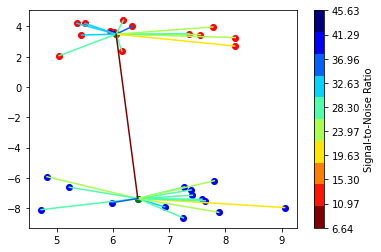

14
14

Power Allocated= 2.8252113787773263
CSI= 0.6628350764877609
SNR= 32.46394717746862
Client: client4


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.342369
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 1.994371
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.580394

Power Allocated= 0.9374483085589631
CSI= 0.2944264499021114
SNR= 45.62644334080874
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.309705
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 2.140100
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 1.317379

Power Allocated= 0.4102253757014864
CSI= 0.25486428130551475
SNR= 6.639048414459346
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.289231
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.977139
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.776737

Power Allocated= 2.548614913503751
CSI= 0.5601401852635697
SNR= 26.66711719339143
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.178976
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 1.605397
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.918010

Power Allocated

/tmp/ipykernel_245536/3032248498.py:65: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Model client17 Train Epoch: 1 [0/320 (0%)]	Loss: 2.329215
Model client17 Train Epoch: 2 [0/320 (0%)]	Loss: 2.115757
Model client17 Train Epoch: 3 [0/320 (0%)]	Loss: 1.241877

Power Allocated= 2.5442963091664232
CSI= 0.5587884626544729
SNR= 18.47564040973427
Client: client24
Model client24 Train Epoch: 1 [0/320 (0%)]	Loss: 2.355376
Model client24 Train Epoch: 2 [0/320 (0%)]	Loss: 2.174744
Model client24 Train Epoch: 3 [0/320 (0%)]	Loss: 1.750841

Power Allocated= 0
CSI= 0.13373200066067414
SNR= 25.821947632407788
Client: client25
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7656256632934655
CSI= 0.637650740223225
SNR= 24.286184451816755
Client: client27
Model client27 Train Epoch: 1 [0/320 (0%)]	Loss: 2.263989
Model client27 Train Epoch: 2 [0/320 (0%)]	Loss: 2.126495
Model client27 Train Epoch: 3 [0/320 (0%)]	Loss: 1.315109

Power Allocated= 0
CSI= 0.09449426414147222
SNR= 32.46394717746862
Client: client28
Poor Channel, client not taken for averaging i

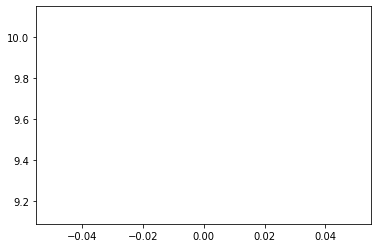

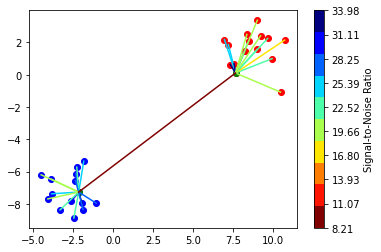

14
14

Power Allocated= 3.16582923620431
CSI= 0.9246097298632907
SNR= 21.69259240707492
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.324487
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 2.121329
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 1.725742

Power Allocated= 3.0187569472794396
CSI= 0.8139281432307061
SNR= 33.067628822386745
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.284273
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 2.238536
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 2.115619

Power Allocated= 3.042772597515251
CSI= 0.8301551981837934
SNR= 31.07288189111801
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.301077
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.803423
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 1.914716

Power Allocated= 0
CSI= 0.21428845868222524
SNR= 22.636691389592247
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.133239676874405
CS

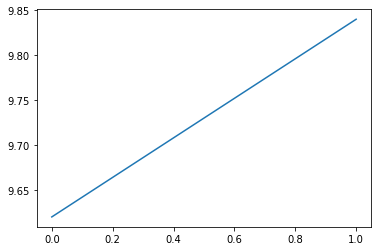

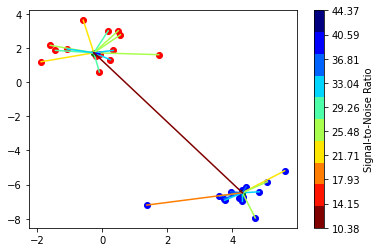

14
14

Power Allocated= 1.7557209907888347
CSI= 0.4276039834053921
SNR= 21.098483620792535
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.295953
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 2.005253
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.131763

Power Allocated= 2.6532095576477523
CSI= 0.6939028701834337
SNR= 26.3000340700192
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.302671
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 2.087028
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 1.635581

Power Allocated= 2.917046451441098
CSI= 0.8494105579871728
SNR= 33.223906802767566
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.311450
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.996447
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 1.846481

Power Allocated= 2.718061457431156
CSI= 0.7266005635785202
SNR= 21.908588124070064
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.307748
Model client8 Train Epoc

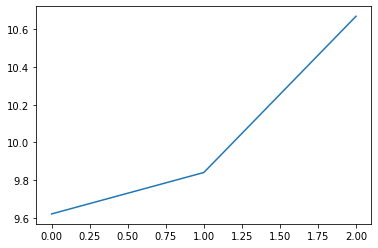

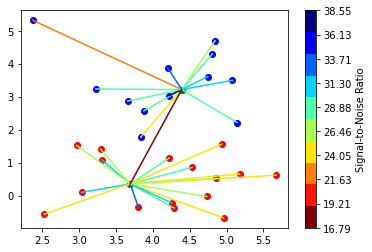

12
16

Power Allocated= 2.7348569378838974
CSI= 0.5242000639383482
SNR= 22.748635981881996
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.298423
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.927592
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 1.410912

Power Allocated= 3.3184321844529046
CSI= 0.7552337608405905
SNR= 32.31604578971787
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.299204
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.946788
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 1.536574

Power Allocated= 3.6207640481173913
CSI= 0.9787019905561016
SNR= 29.600667982149748
Client: client12
Model client12 Train Epoch: 1 [0/320 (0%)]	Loss: 2.284733
Model client12 Train Epoch: 2 [0/320 (0%)]	Loss: 1.949835
Model client12 Train Epoch: 3 [0/320 (0%)]	Loss: 1.613755

Power Allocated= 0
CSI= 0.032326681032824656
SNR= 22.479818563024736
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06

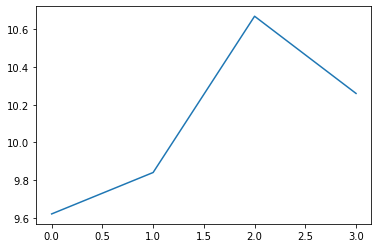

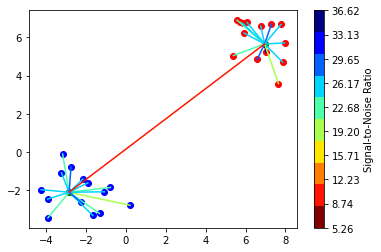

14
14

Power Allocated= 0
CSI= 0.17380166406852637
SNR= 20.99324104614262
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.21639371057266976
SNR= 7.157750272488639
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.309184286361422
CSI= 0.9889077707723614
SNR= 27.49079182953934
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.284869
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 1.424942
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.703925

Power Allocated= 2.2384114325140376
CSI= 0.48030981888580393
SNR= 25.737606791441245
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 2.308593
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 2.101304
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 1.866727

Power Allocated= 3.080974332918964
CSI= 0.8068247040749128
SNR= 36.61918333877704
Client: client12
Model client12 Train Epoch: 1 [0/320 (0%)]	Loss: 2.298128
Mod

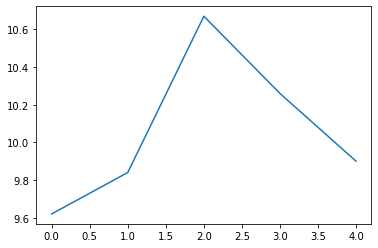

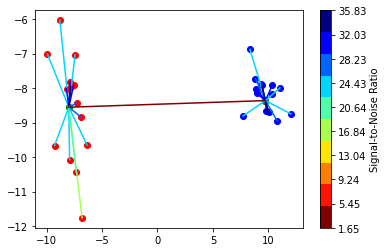

14
14

Power Allocated= 0
CSI= 0.12187092315132497
SNR= 24.18692053090963
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6864303702902497
CSI= 0.5755179114243891
SNR= 27.843931823240965
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.329408
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.379046
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 1.097560

Power Allocated= 3.2441687184669274
CSI= 0.847581866460497
SNR= 29.754626639077898
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.329925
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 2.009022
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 1.506273

Power Allocated= 1.7292938713663757
CSI= 0.371098564493873
SNR= 22.461209430944017
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 2.314039
Model client11 Train Epoch: 2 [0/320 (0%)]	Loss: 1.498559
Model client11 Train Epoch: 3 [0/320 (0%)]	Loss: 0.881554

Power Allocated= 1.0437814332199

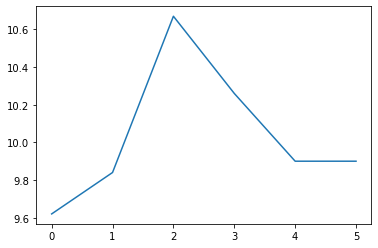

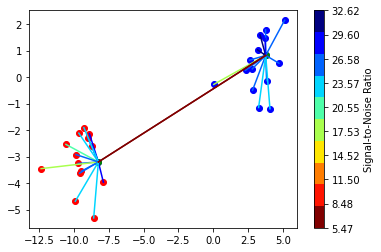

15
14

Power Allocated= 3.336012154932283
CSI= 0.9576807262020925
SNR= 24.12628722246845
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.306753
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.787271
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 1.084402

Power Allocated= 0
CSI= 0.1759223446296958
SNR= 24.872158289081224
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.412088406281489
CSI= 0.5081008853831093
SNR= 25.710468265304698
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.319714
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.702229
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 1.402603

Power Allocated= 1.9879948277089752
CSI= 0.4180240846532469
SNR= 23.812295440639883
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.338635
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.815457
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 1.333227

Power Allocated= 0
CSI= 0.14862349809

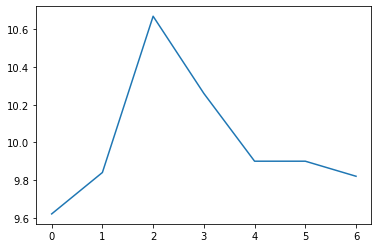

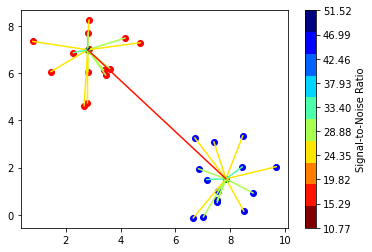

14
14

Power Allocated= 3.734993215091202
CSI= 0.812842864039465
SNR= 28.304954049377184
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.285591
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.530672
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 1.435009

Power Allocated= 0
CSI= 0.04117361221755145
SNR= 31.581160189136888
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.292390523205
CSI= 0.597781236766069
SNR= 12.024303961618727
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.018553440304518887
CSI= 0.2021553865282808
SNR= 23.20860335433931
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.295127
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 1.080816
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.613952

Power Allocated= 0
CSI= 0.0655899722857608
SNR= 22.77028922723285
Client: client10
Poor Channel, client not taken for averaging in this round

Power Al

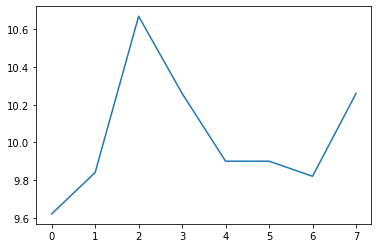

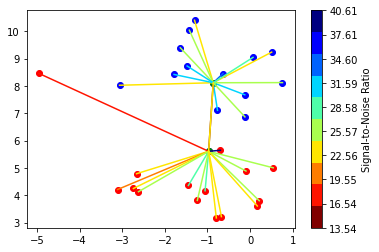

14
15

Power Allocated= 3.0259336414597158
CSI= 0.5153852822180961
SNR= 19.704840483643878
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.302855
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.653979
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 1.036367

Power Allocated= 1.7528513936886139
CSI= 0.3111989700022155
SNR= 22.79501402751031
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.316518
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.903558
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.526209

Power Allocated= 2.438386521947234
CSI= 0.3955941701714526
SNR= 20.47681023622986
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.352931
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.625468
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 1.163416

Power Allocated= 0
CSI= 0.009673982367885525
SNR= 25.75760333430081
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8836101476485787


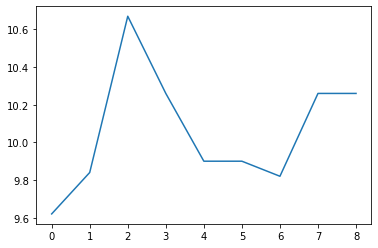

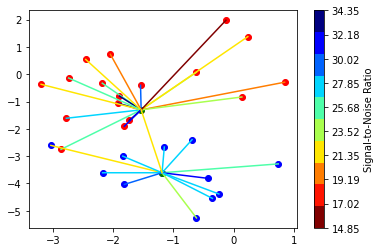

11
17

Power Allocated= 2.474155541843085
CSI= 0.4068706295662188
SNR= 34.34846369838569
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.268106
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.247071
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.826950

Power Allocated= 1.5243894142921777
CSI= 0.29346599509513305
SNR= 26.22472809034405
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.302629
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.555415
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 1.192984

Power Allocated= 2.0110122710268747
CSI= 0.3423570705918928
SNR= 25.933439640398934
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 2.325743
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 1.769605
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 1.400498

Power Allocated= 2.8932839026451833
CSI= 0.4905194038482922
SNR= 23.40845793317856
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 2.379494
Model client11 Tr

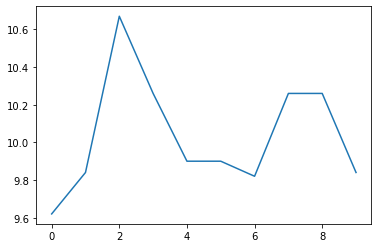

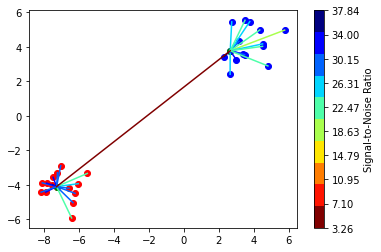

14
14

Power Allocated= 1.6671707429563392
CSI= 0.37099552258939283
SNR= 27.974302636745353
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.276536
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.463691
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 1.105363

Power Allocated= 0
CSI= 0.11587285247284151
SNR= 24.01091150119658
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1616645216310877
CSI= 0.8326695977531992
SNR= 24.76991987932192
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.242357
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.389369
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.685227

Power Allocated= 2.1967210775103947
CSI= 0.4617018361059442
SNR= 28.23284925769714
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.261213
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 1.602290
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.848727

Power Allocated= 2.3503029546028444

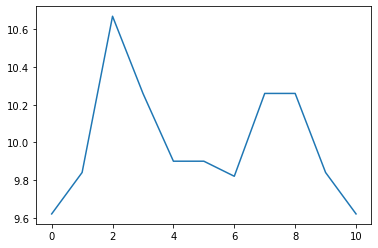

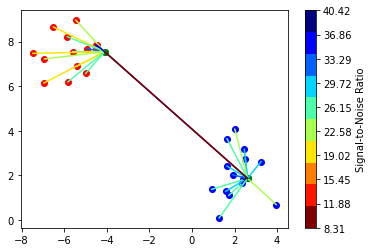

15
14

Power Allocated= 0
CSI= 0.11208963976722663
SNR= 24.71464189681402
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.350890563731206
CSI= 0.43776732838171994
SNR= 23.094697310002445
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.269834
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.127282
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.281322

Power Allocated= 3.0841397267688584
CSI= 0.644716510318445
SNR= 8.312852796134603
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20333638570866308
SNR= 30.89402765007388
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7997342808777255
CSI= 0.2607239157432787
SNR= 24.182842583799108
Client: client15
Model client15 Train Epoch: 1 [0/320 (0%)]	Loss: 2.248065
Model client15 Train Epoch: 2 [0/320 (0%)]	Loss: 1.312772
Model client15 Train Epoch: 3 [0/320 (0%)]	Loss: 1.607447


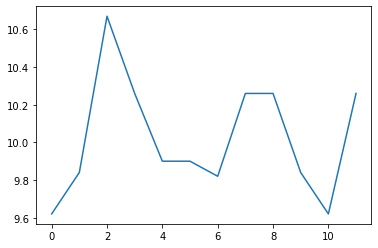

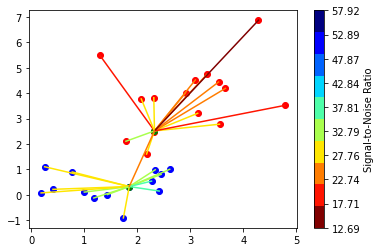

13
15

Power Allocated= 2.932211513812329
CSI= 0.6010340855393697
SNR= 34.330582017077795
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.388507
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.447830
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.825936

Power Allocated= 1.2847492148677593
CSI= 0.3019997109080702
SNR= 19.134036341204407
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.341878
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.666244
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.327847

Power Allocated= 0
CSI= 0.1989388656811134
SNR= 27.892168986196403
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2094766038882352
SNR= 24.629927491238803
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3417373892422364
CSI= 0.44360194114625473
SNR= 26.54235682107494
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 2.319425
Model

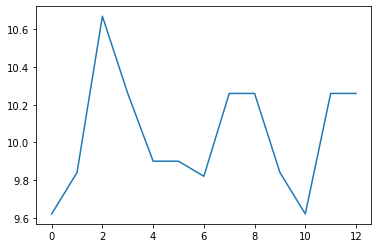

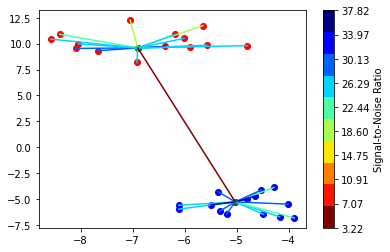

14
14

Power Allocated= 3.6909944927932656
CSI= 0.9935541616121644
SNR= 27.51903626405865
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.298249
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.553750
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.185477

Power Allocated= 0.28458705476570767
CSI= 0.22660860467265642
SNR= 3.221818938870626
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.62867391878135
CSI= 0.9356215373302446
SNR= 24.34822098296638
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.374928
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.065849
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.906022

Power Allocated= 2.0890850395543756
CSI= 0.3833772074661993
SNR= 24.34200240947309
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.203738
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.874777
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.695623

Power Allocated= 2.10

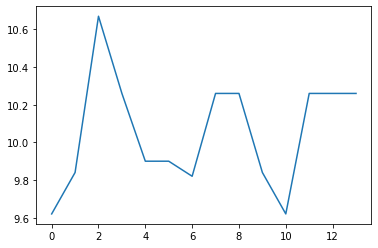

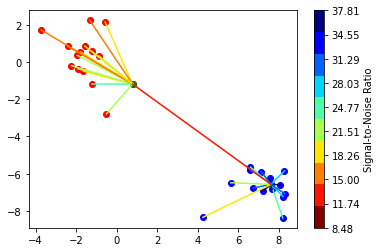

14
14

Power Allocated= 0
CSI= 0.1138044509056425
SNR= 28.92446928052955
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13569765944814882
SNR= 23.276355732985532
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2210947579670304
CSI= 0.7711042864532716
SNR= 26.2813772165876
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.294214
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.477998
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.133443

Power Allocated= 0
CSI= 0.11779225953134909
SNR= 21.196768188552475
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.372190348995918
CSI= 0.8727939038487483
SNR= 18.945657706412014
Client: client12
Model client12 Train Epoch: 1 [0/320 (0%)]	Loss: 2.322187
Model client12 Train Epoch: 2 [0/320 (0%)]	Loss: 1.420500
Model client12 Train Epoch: 3 [0/320 (0%)]	Loss: 1.204407

Power Allocated= 

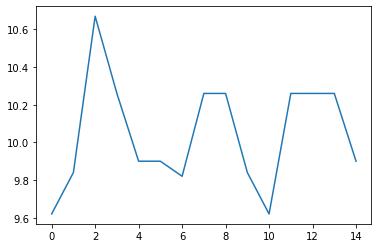

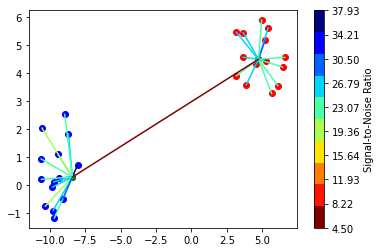

14
14

Power Allocated= 3.46071763729873
CSI= 0.9055988093001424
SNR= 30.62307586345718
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.339258
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.346327
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 1.652815

Power Allocated= 0
CSI= 0.014661211909646976
SNR= 4.502204498854703
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.561496179559075
CSI= 0.9965487600048847
SNR= 25.08459816055928
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.182827
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.881308
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.635703

Power Allocated= 0
CSI= 0.20168267752237945
SNR= 37.928524415325874
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0018882956895183
CSI= 0.639766172661023
SNR= 33.64554286087645
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 2.328692
Model cl

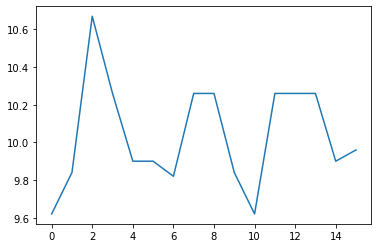

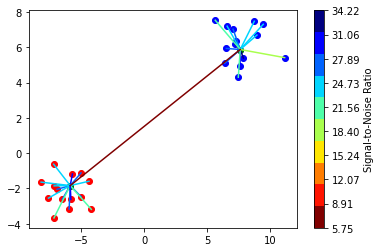

14
14

Power Allocated= 0
CSI= 0.2237227577600852
SNR= 26.13407191786979
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7056232106509133
CSI= 0.6285288687149821
SNR= 27.477887292703276
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.354945
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 1.350518
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.659913

Power Allocated= 2.221532067278803
CSI= 0.4819026379205432
SNR= 33.67481962026803
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.185223
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.697284
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.474343

Power Allocated= 2.9603685965191704
CSI= 0.7483509538678015
SNR= 24.575686456128008
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 2.279428
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 1.401478
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 0.791387

Power Allocated= 2.61527494286913

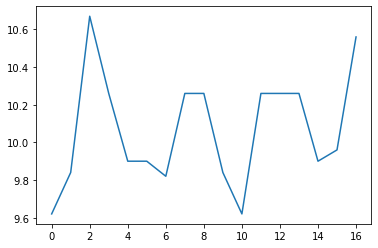

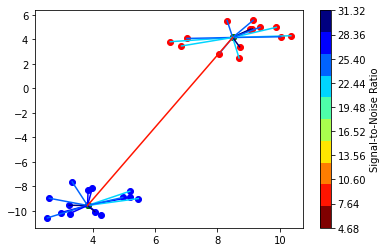

14
14

Power Allocated= 2.7314751681180365
CSI= 0.8187282565150477
SNR= 25.597328099731648
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.354307
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.272756
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 1.231080

Power Allocated= 2.7758673878273075
CSI= 0.8496073764978106
SNR= 26.265898277052443
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.284855
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.939366
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.618574

Power Allocated= 2.7878271334760187
CSI= 0.8583289324196626
SNR= 23.52229153339277
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.261328
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.318984
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.120265

Power Allocated= 2.4144338862291668
CSI= 0.6500058195531171
SNR= 20.832323012066855
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.259862
Model client6 Train E

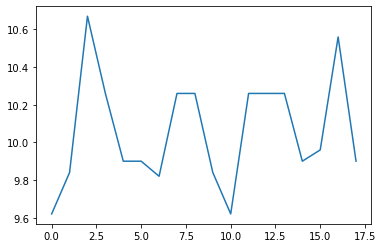

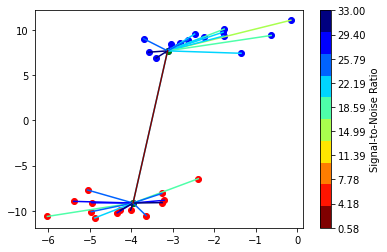

15
14

Power Allocated= 3.024862869622493
CSI= 0.8553849259105972
SNR= 13.51408518500041
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.285620
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.208760
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.916976

Power Allocated= 2.014947869019887
CSI= 0.45893046749000077
SNR= 29.10818500043364
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.353699
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.908452
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.898142

Power Allocated= 0.5723257617012116
CSI= 0.27612094231037376
SNR= 20.990401588917702
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.356714
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.315601
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.104304

Power Allocated= 3.056322026717279
CSI= 0.879039608174942
SNR= 27.82142966107896
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.352639
Model client4 Train Epoch

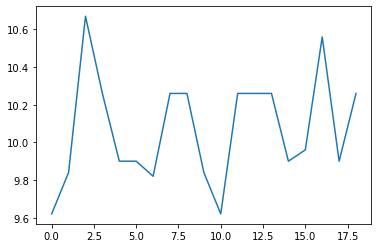

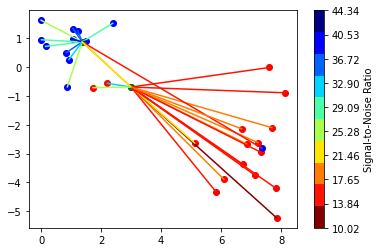

13
16

Power Allocated= 2.130400296658416
CSI= 0.3852825719329105
SNR= 12.702081200921192
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18256723904878192
SNR= 15.894307598513613
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19863956055630627
SNR= 36.19979583853567
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19445872958425814
SNR= 14.095816354743905
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0230478817148336
CSI= 0.5872507720360363
SNR= 25.219045090725785
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 2.248353
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 1.343193
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 1.259584

Power Allocated= 1.9163450042541204
CSI= 0.3559285159500508
SNR= 10.024988684971394
Client: client12
Poor Channel, client not t

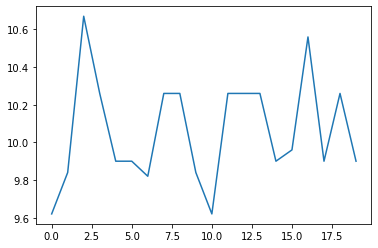

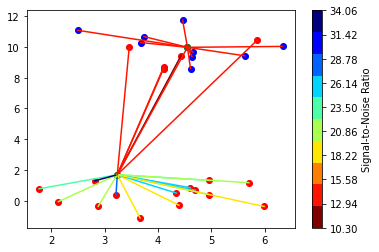

9
19

Power Allocated= 0
CSI= 0.0006996338154575676
SNR= 21.23883668372453
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4419773928388793
CSI= 0.512070976122294
SNR= 21.23883668372453
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.121024
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.712171
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.614406

Power Allocated= 2.2158549777254657
CSI= 0.4589310201886323
SNR= 10.30322145061347
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4808284464508055
CSI= 0.522465157604885
SNR= 10.611142529316165
Client: client17
Model client17 Train Epoch: 1 [0/320 (0%)]	Loss: 2.221274
Model client17 Train Epoch: 2 [0/320 (0%)]	Loss: 1.214060
Model client17 Train Epoch: 3 [0/320 (0%)]	Loss: 0.645998

Power Allocated= 2.394341906516482
CSI= 0.49987758711949737
SNR= 21.519874553412148
Client: client19
Model client19 Train Epoch: 1 [0/320 (0%)]	

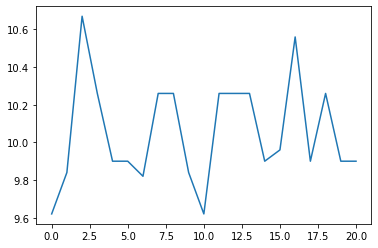

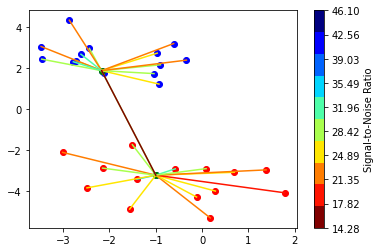

15
14

Power Allocated= 0
CSI= 0.1520635431584575
SNR= 46.09807970275119
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15675929317180037
SNR= 25.842403361468932
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1872517420317044
CSI= 0.5927707750712761
SNR= 26.873324265428085
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.329713
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.240817
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.920795

Power Allocated= 3.0127773903162285
CSI= 0.5372106759445656
SNR= 24.11812050436382
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.354645
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 1.469461
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 1.225265

Power Allocated= 3.8489142750737573
CSI= 0.9752955519991945
SNR= 33.92661151173868
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.067206
Model cl

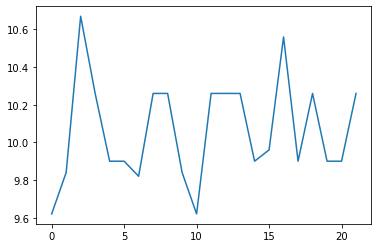

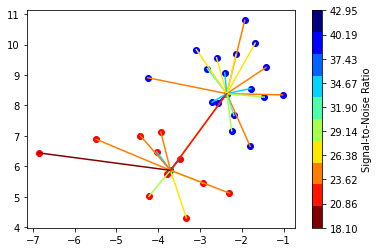

18
11

Power Allocated= 1.1954744545373668
CSI= 0.3320203982638398
SNR= 34.376395845586025
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.431805
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.195080
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.654818

Power Allocated= 2.851412907228174
CSI= 0.7375040868519622
SNR= 38.49151122385421
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.351352
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.877157
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 1.209158

Power Allocated= 0.5106917443141925
CSI= 0.27051549970248756
SNR= 23.236170714090555
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.331821
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.234701
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.231636

Power Allocated= 0
CSI= 0.1836665336661788
SNR= 18.322715751102447
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0886700183163907

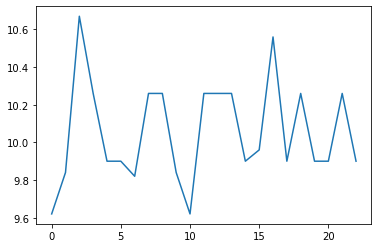

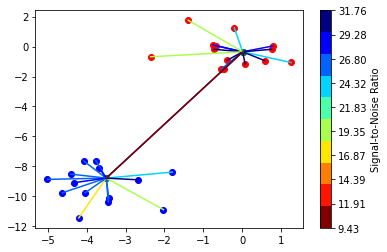

15
14

Power Allocated= 0.46053473945062384
CSI= 0.2679286191831848
SNR= 25.610071497502325
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.332961
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.084870
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.918293

Power Allocated= 1.495861064322968
CSI= 0.3707808311941362
SNR= 25.90722870545574
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.279006
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.023487
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.792312

Power Allocated= 3.1178331341950054
CSI= 0.9301988259234107
SNR= 24.121601059945103
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.165711
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.195149
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.252180

Power Allocated= 3.021980610451144
CSI= 0.8540500926555357
SNR= 28.45093990900014
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.521720
Model client5 Train Epo

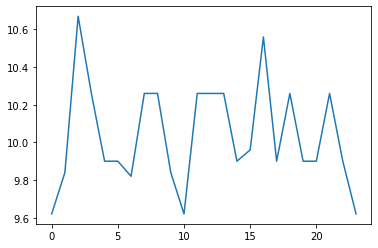

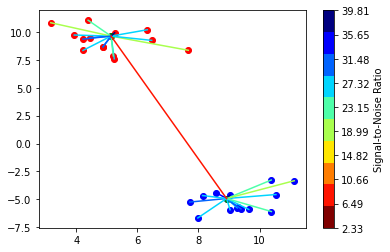

14
14

Power Allocated= 3.9187069904983733
CSI= 0.9926529941247353
SNR= 27.46888567090642
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.335745
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.035314
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 1.304624

Power Allocated= 0
CSI= 0.17075201327621536
SNR= 23.502752026981813
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.606132896152905
CSI= 0.4310390387239077
SNR= 26.983006875848808
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.190179
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.107969
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.024873

Power Allocated= 3.6945165211193034
CSI= 0.8119573033458863
SNR= 30.427510058609986
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.466120
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.811624
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.765928

Power Allocated= 3.6803288328665595

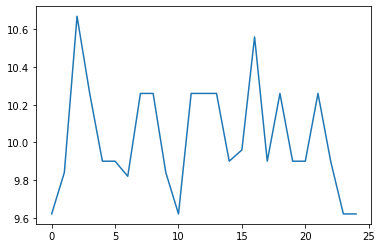

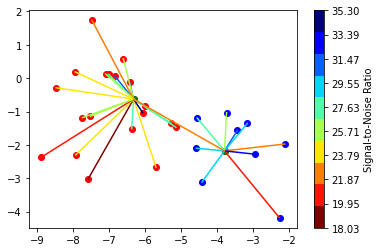

9
19

Power Allocated= 1.9071700767706439
CSI= 0.4855524329596971
SNR= 28.578614029386177
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.318114
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.089123
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.801923

Power Allocated= 2.443869856160048
CSI= 0.6566807273910499
SNR= 31.098029269236566
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.251204
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.131457
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.022761

Power Allocated= 2.948778757771795
CSI= 0.9824136837914829
SNR= 20.819484061667545
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.423342
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.977612
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.373412

Power Allocated= 0.25865714918125393
CSI= 0.269685509012504
SNR= 31.044716785534852
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.289112
Model client7 Train Epo

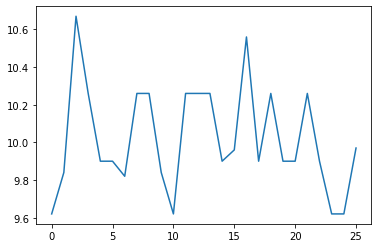

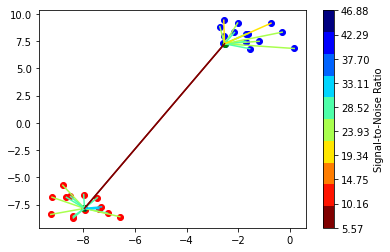

15
14

Power Allocated= 0
CSI= 0.004664290133724047
SNR= 5.571532351343949
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8243594495910243
CSI= 0.3779984339246978
SNR= 28.3013328583502
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.181443
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.655789
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.611689

Power Allocated= 2.410214324429688
CSI= 0.4855173261781387
SNR= 46.882821243662505
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.591044
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.658906
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.164263

Power Allocated= 0.8748890426139364
CSI= 0.27816535383360863
SNR= 19.53762051560544
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 2.196202
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 1.248724
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 0.777402

Power Allocated= 0.7530660569334

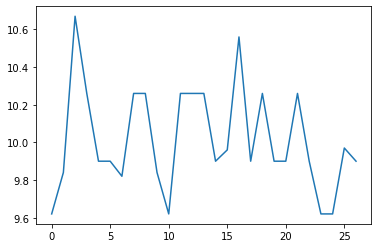

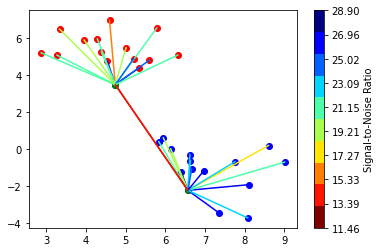

15
14

Power Allocated= 3.2950073013754406
CSI= 0.9175964330303374
SNR= 26.644575651392486
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.434499
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.121768
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.617309

Power Allocated= 1.3352054579893928
CSI= 0.3279112598077887
SNR= 27.556805267240236
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.476577
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.829940
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.907952

Power Allocated= 0
CSI= 0.15991655777891578
SNR= 16.166593843756633
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3303666974028245
CSI= 0.9483668161963947
SNR= 19.74625320601497
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.309836
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 1.192560
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 1.121606

Power Allocated= 0
CSI= 0.05274645

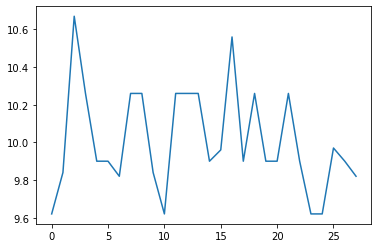

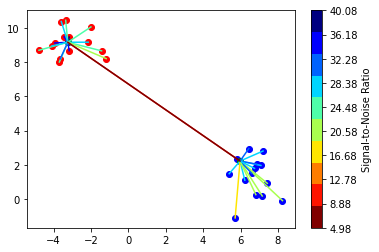

15
14

Power Allocated= 2.227910921362754
CSI= 0.6136782169462315
SNR= 27.355540873506957
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.324624
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.954864
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.523922

Power Allocated= 2.3789066206780456
CSI= 0.6763507521628745
SNR= 4.979271475012229
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.223854832160617
CSI= 0.6121544826615721
SNR= 17.383313596417278
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.341389
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.177725
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 1.247395

Power Allocated= 1.973676295844549
CSI= 0.5308551279857194
SNR= 27.160875894064574
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.342327
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 1.207356
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 1.097054

Power Allocated= 2.19

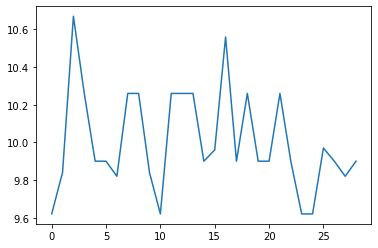

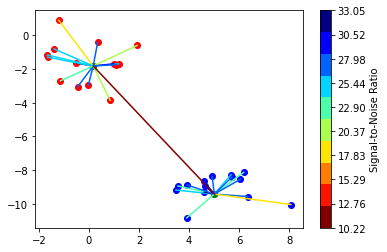

14
14

Power Allocated= 0.4150945272895621
CSI= 0.2654205473445722
SNR= 22.915374493261197
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.485093
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.140126
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.259363

Power Allocated= 2.604994040953522
CSI= 0.633831527079598
SNR= 33.053169499571204
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.468871
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 1.188276
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 1.132778

Power Allocated= 2.5580967204446776
CSI= 0.6155347562804664
SNR= 27.120555834329362
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.143468
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.139129
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.504048

Power Allocated= 2.9278318595944453
CSI= 0.7968962537286794
SNR= 25.137621940545426
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 2.194516
Model client10 Train

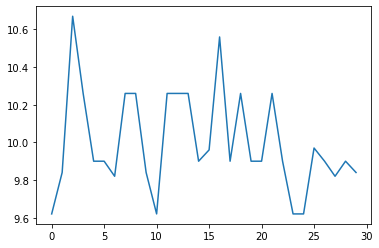

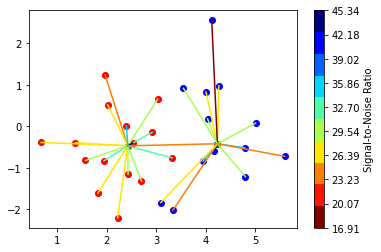

13
15

Power Allocated= 2.839016071845914
CSI= 0.7866978804984011
SNR= 30.180874999370815
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.385802
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.609212
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.344740

Power Allocated= 0
CSI= 0.07260821895970859
SNR= 25.710375260699365
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1006755939136714
CSI= 0.990612478957893
SNR= 29.504111654231735
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.262712
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 1.154048
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 1.164371

Power Allocated= 2.7228460593031043
CSI= 0.7208214973720222
SNR= 24.14902115471434
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.436059
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.558601
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.057385

Power Allocated= 2.3005872278802055


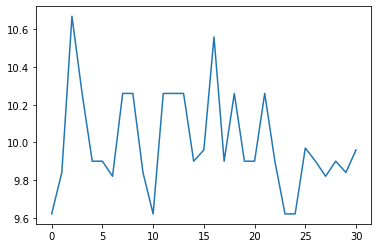

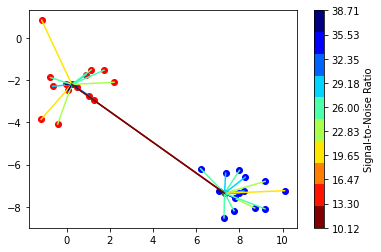

15
14

Power Allocated= 3.647653546864411
CSI= 0.8905642455629501
SNR= 24.021942155903137
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.159906
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.750173
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 1.136884

Power Allocated= 3.7694281568691173
CSI= 0.9988922229152909
SNR= 27.514307327268217
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.526740
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.916463
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.860486

Power Allocated= 0
CSI= 0.026956686329400847
SNR= 28.492909414570555
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19366022940759398
SNR= 30.987808962757924
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.514185985729216
CSI= 0.7959557952437983
SNR= 17.965258469841555
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.329432
Model

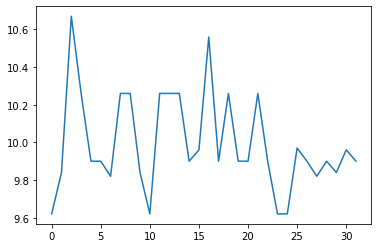

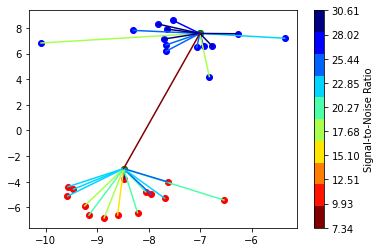

14
14

Power Allocated= 2.5849541840342507
CSI= 0.5233847978215916
SNR= 23.184501059188133
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.316161
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.850695
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.705763

Power Allocated= 0.22092124622151932
CSI= 0.2339360188040609
SNR= 21.309952792567852
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.326370
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.147386
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.026940

Power Allocated= 2.969743812277092
CSI= 0.6553721983455851
SNR= 27.85916284347183
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.332180
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.516700
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.343175

Power Allocated= 3.230814922719615
CSI= 0.7906517168703072
SNR= 22.109477106484434
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.325149
Model client5 Train Ep

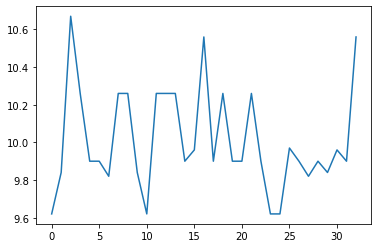

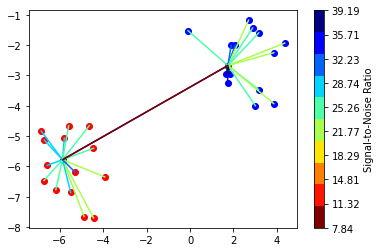

15
14

Power Allocated= 2.97160025963093
CSI= 0.7212624916726966
SNR= 22.232815885681948
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.345214
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.798856
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.444574

Power Allocated= 0
CSI= 0.17706630572693338
SNR= 28.455962107075425
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5610910878248676
CSI= 0.5564932585963491
SNR= 29.46616261595437
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.307105
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.723191
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.485628

Power Allocated= 0
CSI= 0.03680207266523139
SNR= 25.32675672842045
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.184609302546801
CSI= 0.8521889027860956
SNR= 23.510212036091524
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.249254
Model cli

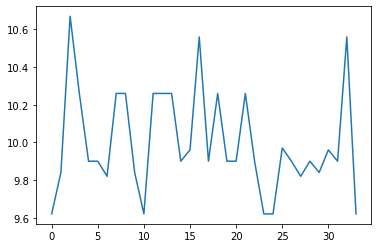

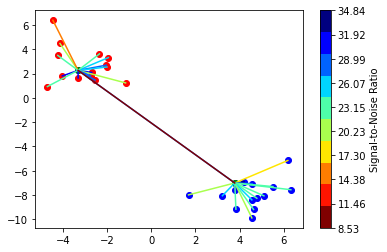

15
14

Power Allocated= 2.258298923662652
CSI= 0.63520559346799
SNR= 20.33261588729129
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.299013
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.727792
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.447136

Power Allocated= 0
CSI= 0.21270469980802842
SNR= 19.716693793896997
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6011562121590126
CSI= 0.8120599653552211
SNR= 29.14361282539813
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.274148
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.272672
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000315

Power Allocated= 2.299009123898802
CSI= 0.6520676366881575
SNR= 24.708566295156697
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.417383
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.064736
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.039111

Power Allocated= 1.8053953893632015
CSI

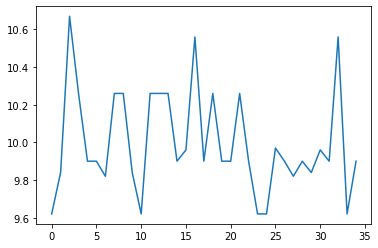

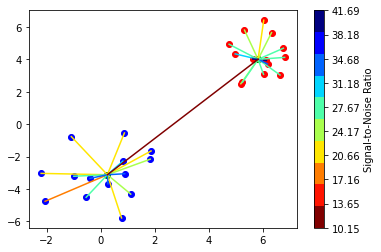

14
14

Power Allocated= 0
CSI= 0.08821688315039133
SNR= 22.934239381557216
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.09100065899736975
CSI= 0.2323511298647637
SNR= 39.52731372077957
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.145415
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.161817
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000378

Power Allocated= 2.851849887267838
CSI= 0.6480957883240713
SNR= 10.1479424227775
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3803247063165207
CSI= 0.9857004712275974
SNR= 20.739499359608153
Client: client14
Model client14 Train Epoch: 1 [0/320 (0%)]	Loss: 2.301929
Model client14 Train Epoch: 2 [0/320 (0%)]	Loss: 0.937128
Model client14 Train Epoch: 3 [0/320 (0%)]	Loss: 0.479111

Power Allocated= 0.9816722716061927
CSI= 0.2929836790342113
SNR= 27.99120251160779
Client: client16
Model client16 Train Epoch: 1 [0/320 (0%)]	

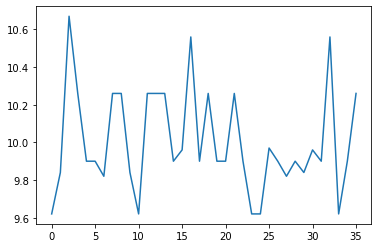

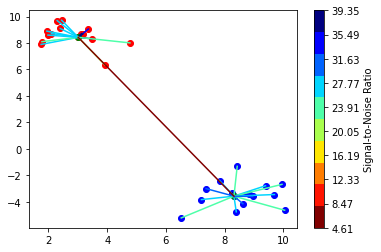

14
14

Power Allocated= 1.7216702749862303
CSI= 0.3835335171029419
SNR= 32.485924429393506
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.333890
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.105205
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.898334

Power Allocated= 2.8775678857533986
CSI= 0.6889726413096662
SNR= 38.42127230426194
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.211602
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.544603
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.344244

Power Allocated= 3.297580541716946
CSI= 0.9695335829218676
SNR= 25.204124100879604
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.424829
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.951358
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.524529

Power Allocated= 0
CSI= 0.0729695805150169
SNR= 27.372135633217006
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9660181715231637


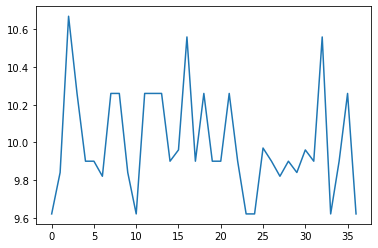

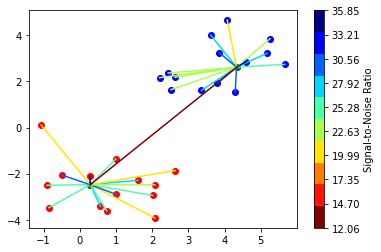

14
14

Power Allocated= 1.942165174355027
CSI= 0.5050457357798387
SNR= 19.705592024939612
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.090256
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.123462
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.199048

Power Allocated= 2.7163524509881523
CSI= 0.8293033193455835
SNR= 12.058537176166578
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9185849969119273
CSI= 0.9964140303882469
SNR= 29.003190030801008
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.384328
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.746643
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.110888

Power Allocated= 2.4477718170434035
CSI= 0.6782364513716561
SNR= 24.167803906072102
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.218699
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 1.154682
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 1.210821

Power Allocated= 0

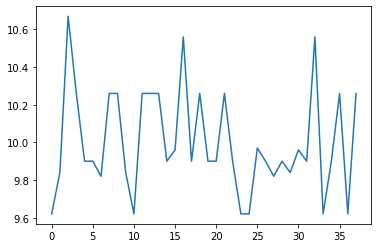

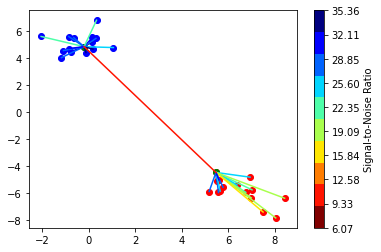

14
14

Power Allocated= 1.9881599037448083
CSI= 0.427538396556282
SNR= 31.803777424758405
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.350374
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.651905
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.976836

Power Allocated= 3.2985459709076563
CSI= 0.9722092610310464
SNR= 24.853890614512522
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.161664
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.063732
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.064216

Power Allocated= 3.322841152452018
CSI= 0.9957283655183305
SNR= 29.651438663666227
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.314617
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.655788
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.230235

Power Allocated= 0
CSI= 0.1499123175634106
SNR= 20.676579753443775
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1522997140

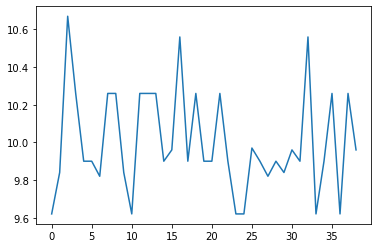

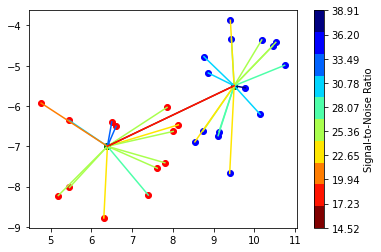

16
13

Power Allocated= 0.790431212361574
CSI= 0.27346460395533045
SNR= 38.91041484410751
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.291629
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.654821
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.624771

Power Allocated= 0
CSI= 0.10545486112063307
SNR= 22.39899641987124
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.044622531470368
CSI= 0.2938938497570165
SNR= 25.61464280170423
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.376790
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.968201
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 1.699937

Power Allocated= 2.806812748623937
CSI= 0.6096078403006974
SNR= 22.820176612219917
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.430422
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.748761
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.246520

Power Allocated= 2.269467837383068
CSI

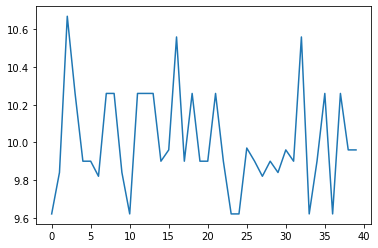

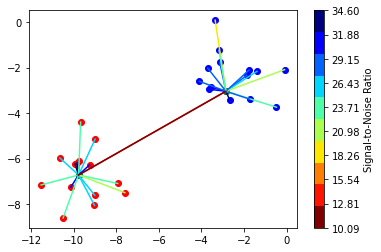

15
14

Power Allocated= 0
CSI= 0.1936610040059904
SNR= 26.83800228599307
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20344396725156577
SNR= 16.193273308230655
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.331697005141153
CSI= 0.43057116903923065
SNR= 34.59976944376421
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.360390
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.018265
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.566534

Power Allocated= 2.012787231213068
CSI= 0.37858622468240777
SNR= 21.534897243730853
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.317122
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.465166
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.039512

Power Allocated= 3.2263933591253897
CSI= 0.700378170308271
SNR= 30.264722213574643
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.312850
Model cl

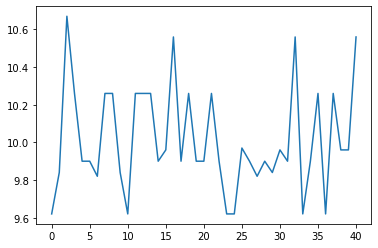

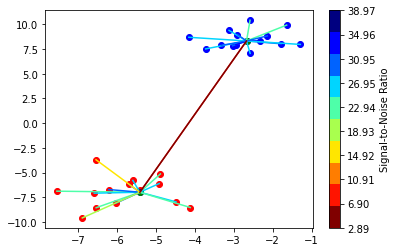

15
14

Power Allocated= 2.390652161471306
CSI= 0.5353522883380021
SNR= 25.868507301252897
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.403228
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.776871
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.445422

Power Allocated= 0.8435250162917982
CSI= 0.29282096481702546
SNR= 20.196228102813947
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.319145
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.970817
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.398804

Power Allocated= 2.0129903720126845
CSI= 0.4453171336613516
SNR= 27.294120931917256
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.345451
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.564958
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.215230

Power Allocated= 3.005316798592857
CSI= 0.7979163262814845
SNR= 26.38717414028198
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.248258
Model client8 Train Ep

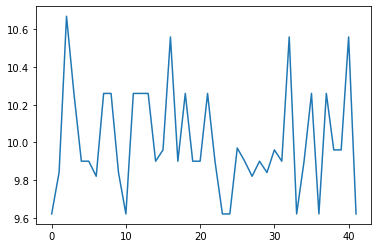

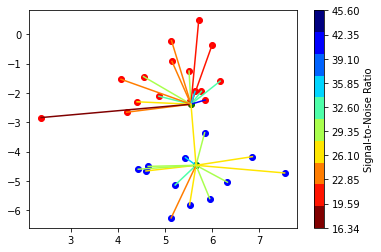

12
16

Power Allocated= 3.021156414525815
CSI= 0.9219920259905223
SNR= 21.660207010154835
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.365421
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.062790
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.009734

Power Allocated= 0
CSI= 0.12637619913412124
SNR= 29.462545416757607
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1031161467261734
CSI= 0.9973586485911233
SNR= 45.60072874364083
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 2.162901
Model client11 Train Epoch: 2 [0/320 (0%)]	Loss: 0.002597
Model client11 Train Epoch: 3 [0/320 (0%)]	Loss: 0.124079

Power Allocated= 1.0043067972416715
CSI= 0.32242903111497123
SNR= 22.419280571992577
Client: client13
Model client13 Train Epoch: 1 [0/320 (0%)]	Loss: 2.429090
Model client13 Train Epoch: 2 [0/320 (0%)]	Loss: 1.105120
Model client13 Train Epoch: 3 [0/320 (0%)]	Loss: 1.104833

Power Allocated= 1.503716

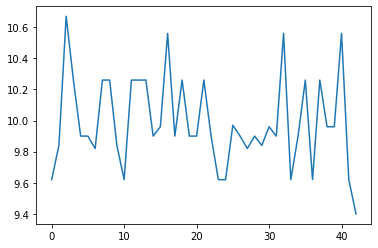

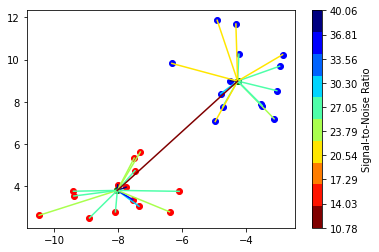

14
14

Power Allocated= 3.2267674265904525
CSI= 0.7355391110532283
SNR= 30.153435896570585
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.195985
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.563124
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.200962

Power Allocated= 2.2442894075867654
CSI= 0.4269809191338432
SNR= 24.774908423520902
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.359641
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.605086
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.435464

Power Allocated= 0
CSI= 0.14324032539913312
SNR= 28.813085605693075
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.298443867299506
CSI= 0.7764755426276027
SNR= 23.79605533258716
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.360687
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 1.129931
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 1.238737

Power Allocated= 0
CSI= 0.191079645

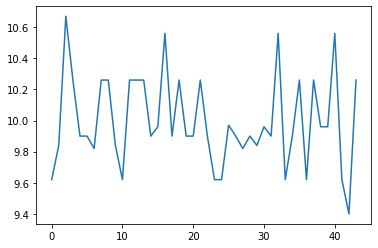

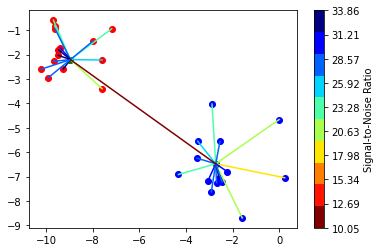

14
14

Power Allocated= 2.2723277296637274
CSI= 0.5154713078722621
SNR= 25.125878574829816
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.322613
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.661914
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.361674

Power Allocated= 2.4142605092820517
CSI= 0.5561613368429514
SNR= 22.209742688758823
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.268166
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.545652
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.550712

Power Allocated= 3.045717468272529
CSI= 0.8572047369292274
SNR= 27.768792838083098
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.302720
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.545972
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.425559

Power Allocated= 1.715850948460195
CSI= 0.4005689734101934
SNR= 22.17503623769792
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.523628
Model client9 Train Epo

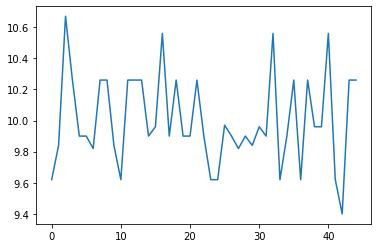

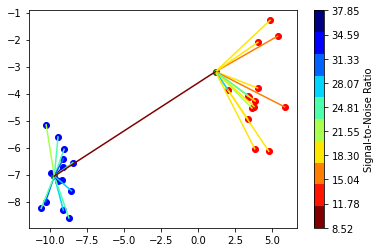

14
14

Power Allocated= 0.6335513495144358
CSI= 0.22175784419400768
SNR= 17.831188300095896
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.371362
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.516045
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.320068

Power Allocated= 0.3308086506595851
CSI= 0.20780662812974582
SNR= 8.520776400198605
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8995885835613215
CSI= 0.44575474288784644
SNR= 25.18658836191197
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.128192
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.001921
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000282

Power Allocated= 4.052827344448466
CSI= 0.917307186096205
SNR= 21.315512184200294
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 2.356703
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 0.767165
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 0.711197

Power Allocate

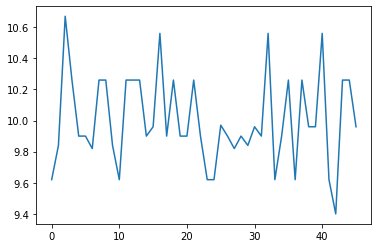

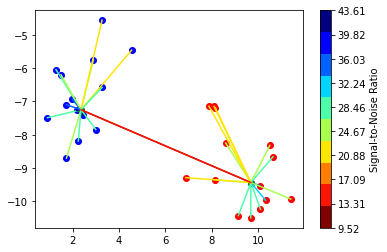

15
14

Power Allocated= 2.7247023945496505
CSI= 0.6274184005665154
SNR= 21.489330706616425
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.339854
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.358571
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.194304

Power Allocated= 3.240764763306542
CSI= 0.9278414119346291
SNR= 11.998874432045529
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.753154619103901
CSI= 0.6388223044973786
SNR= 20.29536802396118
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.339001
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.458450
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.233426

Power Allocated= 0
CSI= 0.09655722152843627
SNR= 18.31057962714029
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9659965850810046
CSI= 0.2982814305571252
SNR= 35.435178317794815
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2

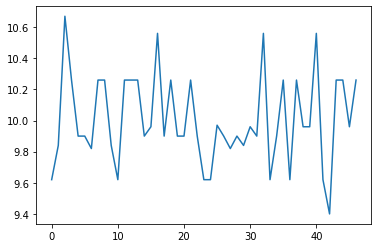

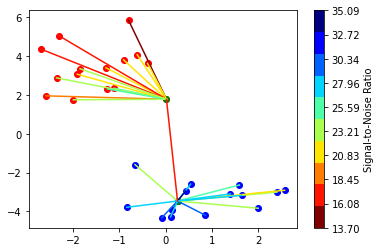

14
14

Power Allocated= 2.3747723575852016
CSI= 0.6752776696622129
SNR= 23.069918240635115
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.349358
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.319762
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.220065

Power Allocated= 1.806783444257258
CSI= 0.4880760055720049
SNR= 24.834714409090488
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.284337
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.281930
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.097313

Power Allocated= 0.427359693194425
CSI= 0.2916910375238819
SNR= 20.18733824532831
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 1.922621
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000730
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.703280919763639
CSI= 0.8677815535116081
SNR= 20.116283457961746
Client: client13
Model client13 Train Epoch: 1 [0/320 (0%)]	Loss: 2.301150
Model client13 Train E

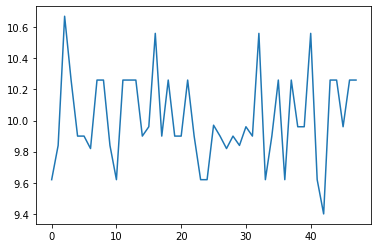

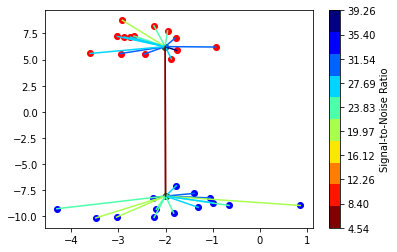

15
14

Power Allocated= 1.6683987334655193
CSI= 0.38112440374211165
SNR= 4.544920777157143
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.948921758513812
CSI= 0.4267500291911298
SNR= 31.072009295336557
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.328097
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.972967
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.573402

Power Allocated= 3.2656779589842486
CSI= 0.9741499900013313
SNR= 23.441267810777276
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.061522
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.012591
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 1.7888426584836354
CSI= 0.3994613239346012
SNR= 28.733551099555598
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 2.486789
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 0.718787
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 0.832366

Power Allocate

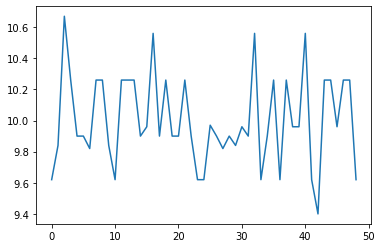

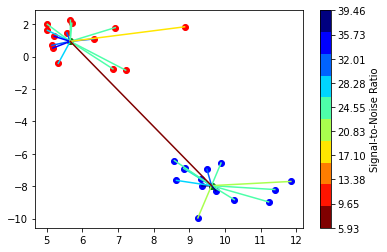

14
14

Power Allocated= 3.060697309043971
CSI= 0.9356253746690871
SNR= 23.270713501447492
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.641222
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.399913
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.235580

Power Allocated= 1.9658504964567292
CSI= 0.46218182009592923
SNR= 22.78120423414818
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.224273
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.429949
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.560124

Power Allocated= 0
CSI= 0.23439524381256316
SNR= 5.925714985720189
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4737145441096393
CSI= 0.6039425567651058
SNR= 24.313310626852825
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.211254
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000142
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.051699742

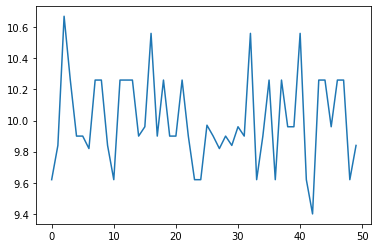

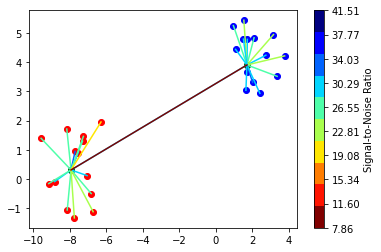

15
14

Power Allocated= 0
CSI= 0.22689240799800936
SNR= 25.642411740448516
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1773623128607178
SNR= 30.535930249644213
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2799780969283567
CSI= 0.5230564662916414
SNR= 23.87096258207172
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.211936
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000008
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.05868762691616
CSI= 0.8825113167740043
SNR= 24.642236760683737
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 2.384261
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 0.855600
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 0.573727

Power Allocated= 2.7241593592169826
CSI= 0.6813575471606735
SNR= 7.860450613932855
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 2.296324
Mod

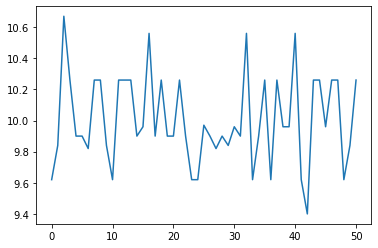

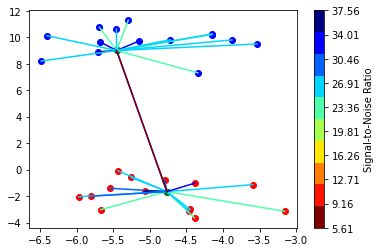

15
14

Power Allocated= 3.1072021662733342
CSI= 0.8412554757604958
SNR= 37.559704555963165
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.340465
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.263392
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.828509

Power Allocated= 2.0711188739234636
CSI= 0.4494820725366674
SNR= 25.15402083956193
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 2.284060
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 0.951306
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 0.592557

Power Allocated= 0
CSI= 0.1857433589278179
SNR= 5.608992059015798
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17885630848941214
SNR= 23.725736624502975
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16883398527479032
SNR= 23.54447434200535
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocate

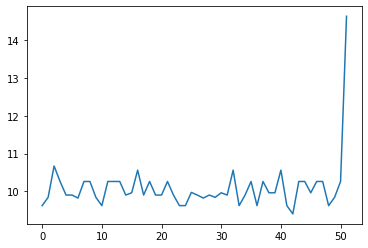

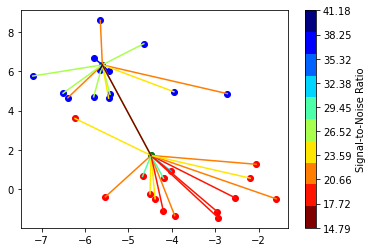

14
15

Power Allocated= 3.210474170499427
CSI= 0.7973145321910743
SNR= 21.291952656549746
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.453586
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.810302
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.838790

Power Allocated= 3.124782332046946
CSI= 0.7463232303382642
SNR= 21.12720682199983
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.438914
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.206752
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.005230

Power Allocated= 0
CSI= 0.09480868168522982
SNR= 24.29937616008029
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.156006444254574
SNR= 18.0238177486252
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2908096599931023
CSI= 0.8518796863280039
SNR= 23.977242382570736
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 2.744737
Model clie

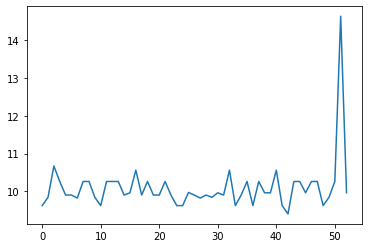

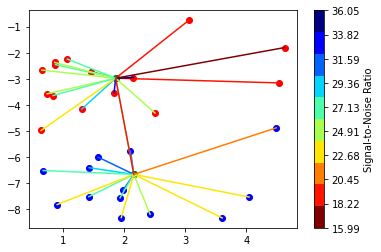

14
15

Power Allocated= 3.2327470075758757
CSI= 0.7855612215374485
SNR= 23.900642322607013
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.341206
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.711299
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.028768

Power Allocated= 3.099523847539298
CSI= 0.7111371951225115
SNR= 35.9720794308385
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.348442
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.207482
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.082749

Power Allocated= 1.8728230669306396
CSI= 0.3798094510672375
SNR= 24.99383822653653
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.425359
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 1.097156
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 1.138782

Power Allocated= 0
CSI= 0.023086255451169047
SNR= 28.99607227173502
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2127995895255137


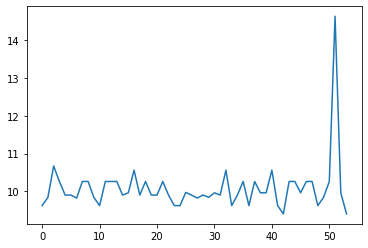

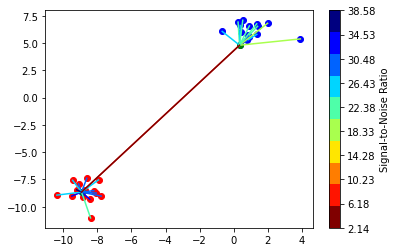

15
14

Power Allocated= 4.030090448071952
CSI= 0.9461659595053526
SNR= 24.223949515915894
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.150783
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.429367
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.143044

Power Allocated= 0
CSI= 0.10627414481460995
SNR= 21.934674611820157
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.007804074002235484
SNR= 29.51584190088566
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4522189496884965
CSI= 0.379539980918302
SNR= 29.056866432088267
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.367904
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.667674
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.262986

Power Allocated= 0
CSI= 0.17290659916578055
SNR= 32.79764310548664
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.

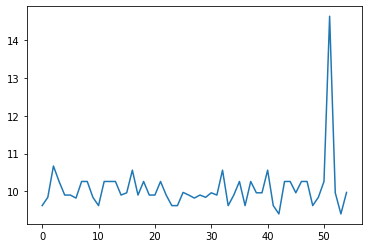

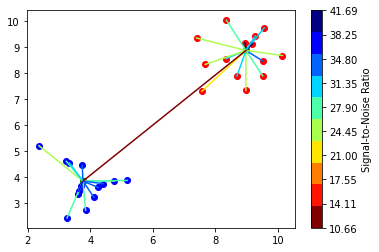

14
14

Power Allocated= 3.1290065917766627
CSI= 0.7745463774365425
SNR= 40.34242425199274
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.252284
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.847115
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.254669

Power Allocated= 0
CSI= 0.056768608546156396
SNR= 31.062246331745776
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2112078311708302
SNR= 32.21246403169036
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12607870194426385
SNR= 41.69449150299682
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1715349202275385
CSI= 0.8009291127539058
SNR= 28.057632084357838
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.331441
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.011352
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.9

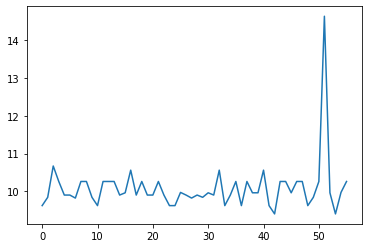

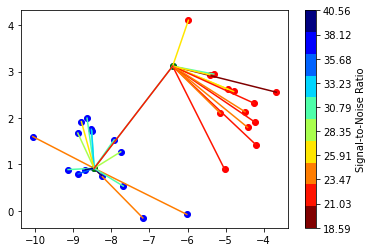

16
13

Power Allocated= 1.2059777739989528
CSI= 0.2886222084501189
SNR= 18.591955419032445
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.427040
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.960447
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.472114

Power Allocated= 0.42875570513547245
CSI= 0.23574014275623967
SNR= 24.276767489876345
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.331423
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.477880
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.022830

Power Allocated= 3.3950865125940677
CSI= 0.7839275371198984
SNR= 27.501786248376273
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.394373
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 1.057577
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.817276

Power Allocated= 3.2686016310868764
CSI= 0.7132092836882867
SNR= 19.09290728338856
Client: client12
Model client12 Train Epoch: 1 [0/320 (0%)]	Loss: 2.408553
Model client12 Tr

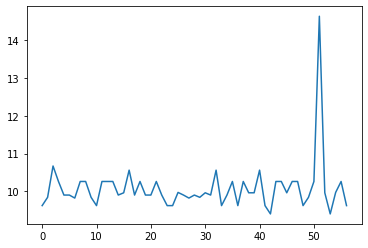

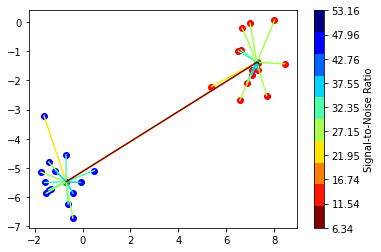

15
14

Power Allocated= 2.8295228885275745
CSI= 0.5767777787444499
SNR= 26.010072554099978
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.401087
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.216855
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.149597

Power Allocated= 3.5263513107810396
CSI= 0.9643745002297169
SNR= 6.335867212142715
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4883489001597185
CSI= 0.9302810435418756
SNR= 31.92121059543897
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.078918
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.381045
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.149803

Power Allocated= 0.7902484142251347
CSI= 0.26503795837949284
SNR= 25.74929565044635
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 1.838805
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 1.162798
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.772543

Power Allocated= 0.

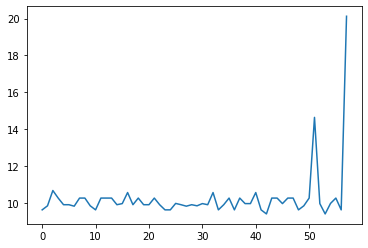

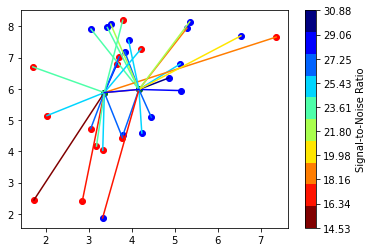

16
13

Power Allocated= 2.4766340188935834
CSI= 0.6796923538799904
SNR= 14.526081887436806
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.412540
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.573432
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.244906

Power Allocated= 0
CSI= 0.016965651281561134
SNR= 23.76960640610059
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8986116418600307
CSI= 0.9530378785545792
SNR= 24.582876504072242
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.323605
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.293458
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.087387

Power Allocated= 2.595706227591828
CSI= 0.7395456063395119
SNR= 26.38216665790224
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.262773
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 0.848042
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.322380

Power Allocated= 0
CSI= 0.109423406

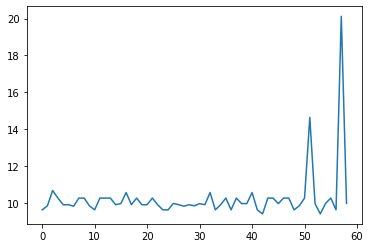

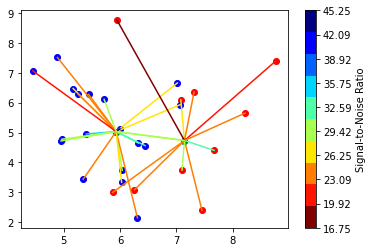

19
10

Power Allocated= 2.4212939795590405
CSI= 0.5869308543784976
SNR= 21.691242989644856
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.369229
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.585556
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.245193

Power Allocated= 2.770236793518106
CSI= 0.7380970437509674
SNR= 22.738697654183305
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.237669
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.218277
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.065130

Power Allocated= 1.2264858419904647
CSI= 0.3449957601274135
SNR= 26.48469532166344
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.507013
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.077913
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.155545

Power Allocated= 2.747129763526315
CSI= 0.7257197265173632
SNR= 26.48469532166344
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.331555
Model client6 Train Epoc

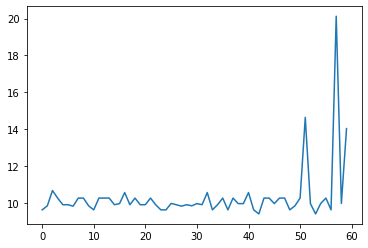

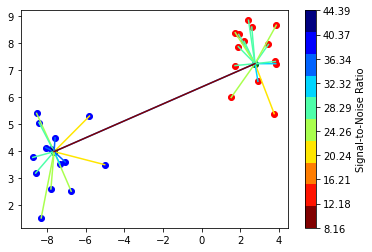

15
14

Power Allocated= 3.3101151465419925
CSI= 0.7600749815773677
SNR= 24.978767828161317
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.666788
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.092370
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.002771

Power Allocated= 2.1384350752516137
CSI= 0.40203595154379845
SNR= 32.33304906208542
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.231307
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.599733
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.203904

Power Allocated= 0.14818078802897183
CSI= 0.22333422670003977
SNR= 20.992361385289996
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.054889
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.569313
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.230779

Power Allocated= 0
CSI= 0.06340500003565186
SNR= 22.08757356105564
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.193582

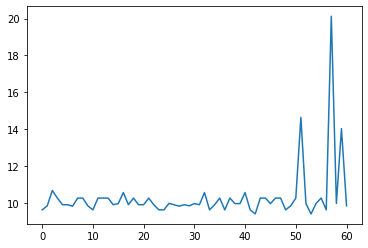

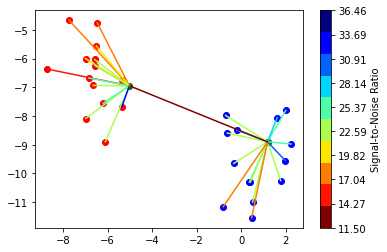

14
14

Power Allocated= 0.9179944490266778
CSI= 0.31204199608431804
SNR= 36.461259676041486
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.106458
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.362757
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.174540

Power Allocated= 0
CSI= 0.01003812542798721
SNR= 13.618670536985176
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5911206738446513
CSI= 0.6529245126366789
SNR= 20.64853165387729
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.144471
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.312402
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.092162

Power Allocated= 1.1020912228343098
CSI= 0.33106004661717625
SNR= 20.01536490672919
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.249193
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 0.948758
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.280137

Power Allocated= 2.20215649880160

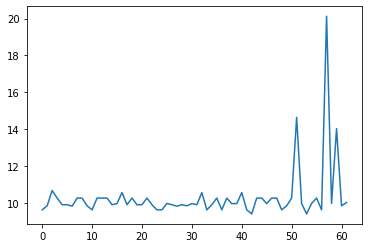

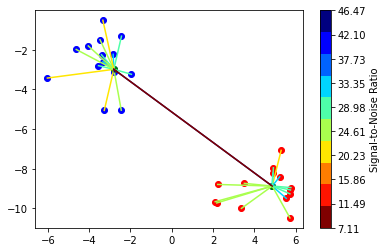

15
14

Power Allocated= 0
CSI= 0.11305661791403032
SNR= 16.55926499680927
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5496605293429164
CSI= 0.854056095414198
SNR= 19.83481337817568
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.183145
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.395171
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.124058

Power Allocated= 3.5049394783478327
CSI= 0.8226360968945118
SNR= 28.73310102428662
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.261234
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.213366
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.461819

Power Allocated= 0
CSI= 0.19450304562768017
SNR= 22.62999435227669
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.388171467591386
CSI= 0.7505409491680779
SNR= 30.61386767786089
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 2.004217
Model cli

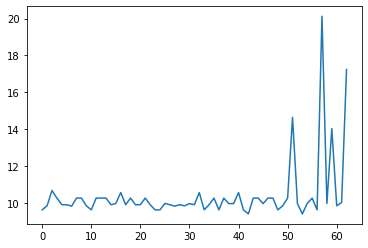

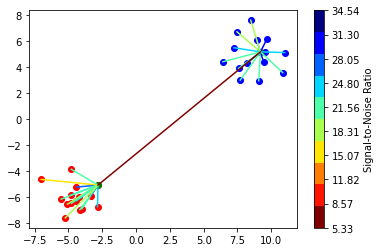

14
14

Power Allocated= 3.131851208178918
CSI= 0.9631215215628196
SNR= 24.99466569943986
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.551257
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.251567
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.080910

Power Allocated= 2.628544107004177
CSI= 0.648677676665992
SNR= 20.315332249833848
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.388295
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.057073
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.161428650957581
CSI= 0.9913621290622125
SNR= 21.48012442247103
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 2.022954
Model client11 Train Epoch: 2 [0/320 (0%)]	Loss: 0.046765
Model client11 Train Epoch: 3 [0/320 (0%)]	Loss: 0.063016

Power Allocated= 3.105340410298494
CSI= 0.9391422888125946
SNR= 18.84901718527023
Client: client12
Model client12 Train Epoch: 1 [0/320 (0%)]	Loss: 2.281048
Model client12 Train E

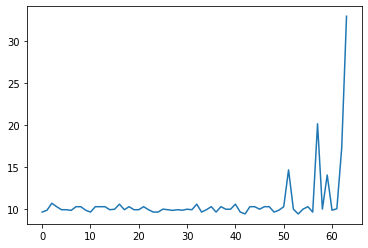

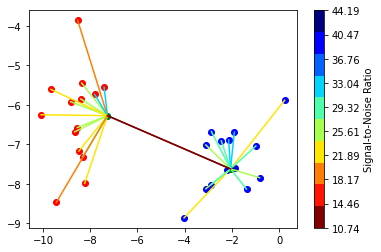

15
14

Power Allocated= 0
CSI= 0.037038405644964856
SNR= 10.739658232294126
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.622081156121633
CSI= 0.6911187901632362
SNR= 20.784214871172843
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.026496
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.008189
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 1.4856693461921622
CSI= 0.3870956148334437
SNR= 19.365978919122202
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 2.268606
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 0.591437
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 0.447650

Power Allocated= 2.3768952174092273
CSI= 0.5909763120374742
SNR= 23.809134972785838
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 2.050392
Model client11 Train Epoch: 2 [0/320 (0%)]	Loss: 0.344185
Model client11 Train Epoch: 3 [0/320 (0%)]	Loss: 0.560271

Power Allocated= 0.854653

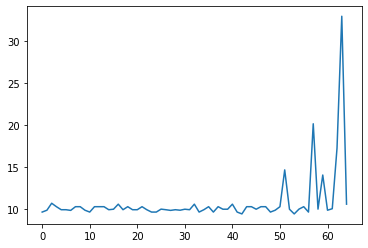

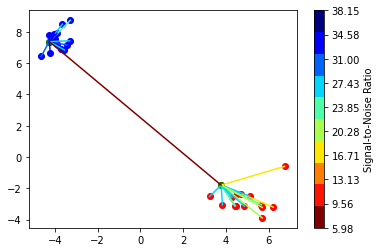

14
14

Power Allocated= 3.3404939997799907
CSI= 0.9729100168561866
SNR= 26.834702935648096
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.665809
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.486792
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.166630

Power Allocated= 0.9571506919677044
CSI= 0.29315303629193956
SNR= 16.218313336644613
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.134684
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.118252
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.083615

Power Allocated= 0
CSI= 0.18090049104827644
SNR= 38.15173157740753
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3128652640771503
CSI= 0.4865060208771509
SNR= 27.00452654597642
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.017179
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.002609
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.13926366

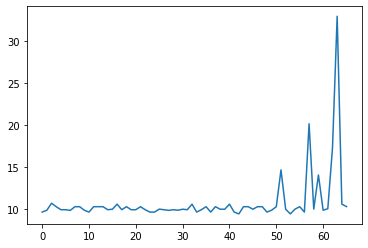

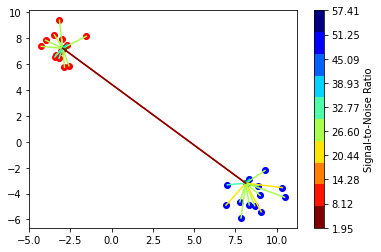

15
14

Power Allocated= 3.0680846892537046
CSI= 0.700917535222241
SNR= 21.496888816426413
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.512047
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.143995
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.061630

Power Allocated= 1.4776852287764712
CSI= 0.3314440119360025
SNR= 1.9545748033094705
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.225955
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.410547
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.151816

Power Allocated= 0
CSI= 0.035644255372320854
SNR= 30.690637036237117
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2699536872643744
CSI= 0.8164382587416028
SNR= 19.221972498117317
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.645236
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000141
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000004

Power Allocated= 2.29270357137004

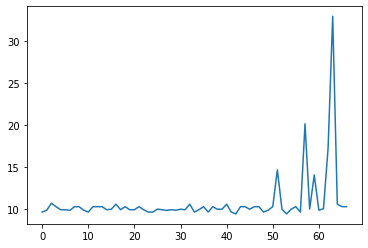

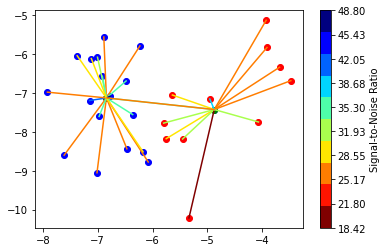

18
11

Power Allocated= 0.935750175383185
CSI= 0.333882298749245
SNR= 24.361708545983625
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.338500
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.154053
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.903050

Power Allocated= 2.790330700583258
CSI= 0.8768184813764426
SNR= 24.5846075516112
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.361190
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.731816
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.046038

Power Allocated= 2.8315607691327798
CSI= 0.9097055053607884
SNR= 28.73571526760091
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.271286
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.330900
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.048137

Power Allocated= 1.9625256044649693
CSI= 0.5080546977560968
SNR= 25.117690439684562
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.229937
Model client4 Train Epoch:

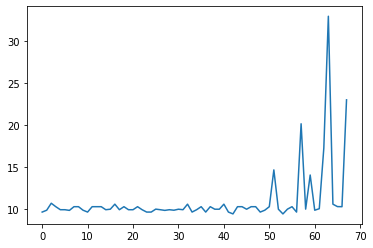

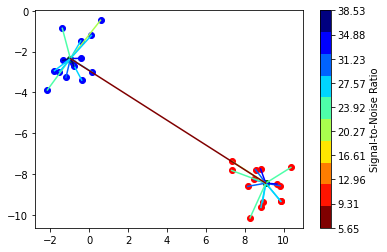

14
14

Power Allocated= 1.9615901321724314
CSI= 0.40501078760076326
SNR= 29.480860886870175
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.849514
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.202767
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.328663

Power Allocated= 2.658686997783323
CSI= 0.5643426303522713
SNR= 31.631601134414833
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.322428
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.152533
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0.4459199022178444
CSI= 0.2509573857286247
SNR= 5.65400732271876
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1024625952790483
CSI= 0.429516812301422
SNR= 28.31608291457807
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.096617
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000008
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CS

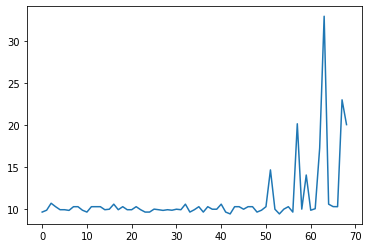

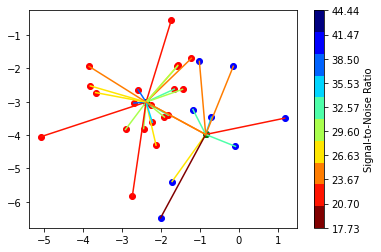

9
20

Power Allocated= 2.707965570509918
CSI= 0.6447543831555959
SNR= 33.550347717586746
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.488885
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.084964
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.239248

Power Allocated= 0
CSI= 0.19967169936327578
SNR= 36.357837316222636
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15549062766039734
SNR= 25.62498811401094
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5898529354918338
CSI= 0.2725470809662164
SNR= 28.23885706929073
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 2.371080
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 1.429540
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 0.524909

Power Allocated= 1.749484205447613
CSI= 0.39849217312229035
SNR= 20.11366101685469
Client: client13
Model client13 Train Epoch: 1 [0/320 (0%)]	Loss: 2.364007
Mod

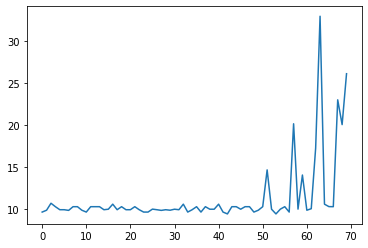

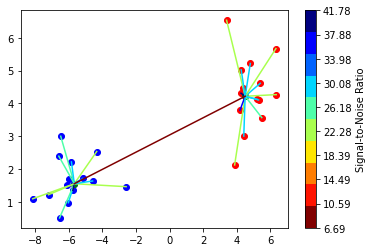

14
14

Power Allocated= 0
CSI= 0.17644239160961017
SNR= 29.525163117416255
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.594655317343249
CSI= 0.6230887034102492
SNR= 22.050412763153087
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.396622
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.033454
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.002078

Power Allocated= 2.782016289102038
CSI= 0.7054440034885351
SNR= 21.391356942933797
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.854481
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.505345
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 1.399606

Power Allocated= 0
CSI= 0.09917213795483426
SNR= 21.44093596945764
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0794854799114693
CSI= 0.47168081108513127
SNR= 21.079463488922002
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 1.216651
Mode

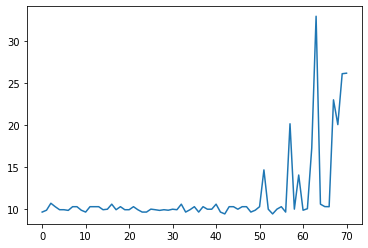

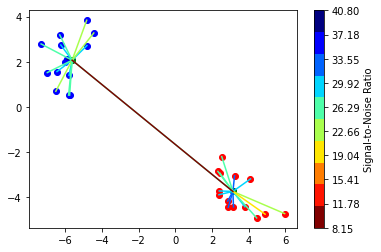

15
14

Power Allocated= 2.029853595446252
CSI= 0.5109681099668076
SNR= 21.22720135972381
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.397597
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.115460
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.001221

Power Allocated= 0.3754005739247406
CSI= 0.27689154646578396
SNR= 8.150932521416799
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.597974
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.301287
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.174494

Power Allocated= 0
CSI= 0.12908796721282423
SNR= 36.75934552312603
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.407578998677729
CSI= 0.6331743223568259
SNR= 28.748487630611354
Client: client13
Model client13 Train Epoch: 1 [0/320 (0%)]	Loss: 2.143516
Model client13 Train Epoch: 2 [0/320 (0%)]	Loss: 0.124422
Model client13 Train Epoch: 3 [0/320 (0%)]	Loss: 0.073155

Power Allocated= 2.69587360646511

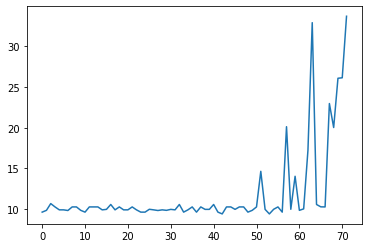

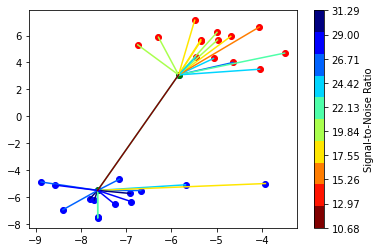

15
14

Power Allocated= 3.2873003148503623
CSI= 0.8240253845569411
SNR= 21.579414116414988
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.657087
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.051146
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.003542

Power Allocated= 3.401719222984176
CSI= 0.9098055700530956
SNR= 30.17301983819447
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 3.000468
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.339886
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.091885

Power Allocated= 0.7558369848341431
CSI= 0.26702140084891846
SNR= 26.63018055632314
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.210632
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.174261
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.165249

Power Allocated= 1.3978315884004218
CSI= 0.32226632383745624
SNR= 16.614850402649367
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.419414
Model client5 Train E

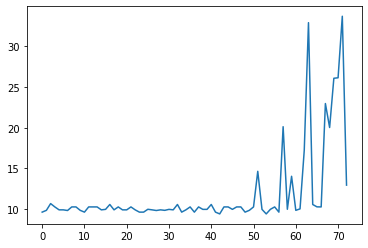

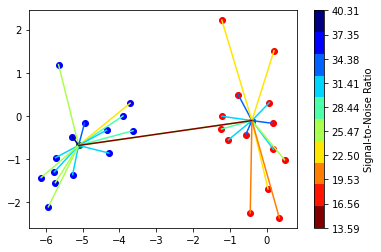

15
14

Power Allocated= 2.8653649365464844
CSI= 0.7218906243025479
SNR= 29.092951541353756
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.104678
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.061788
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.154858

Power Allocated= 2.8725823895536
CSI= 0.7256715265494601
SNR= 30.986825999083212
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.049373
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 0.862460
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.715222

Power Allocated= 2.896563836224023
CSI= 0.7385237999832904
SNR= 32.66007470161358
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 3.496173
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.1607222280256484
SNR= 29.212844096886467
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1606304351719396
CS

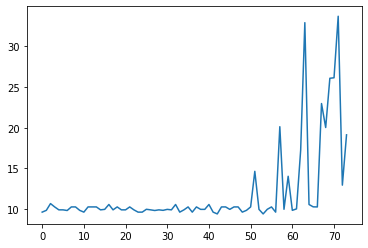

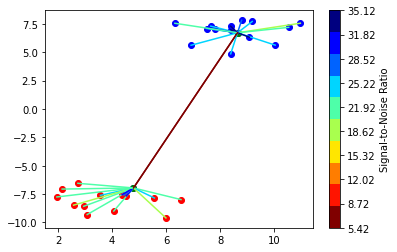

15
14

Power Allocated= 0
CSI= 0.12718338772894222
SNR= 24.930522842189188
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10398768805707925
SNR= 18.746257637437758
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.396986764513283
CSI= 0.9129283466149658
SNR= 19.780759217975646
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.208878
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.837176
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 1.097576

Power Allocated= 3.1729460849798796
CSI= 0.757910560001212
SNR= 29.028043199666087
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.387233
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.046009
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.8756875420301897
CSI= 0.6185533439190347
SNR= 24.789993474246923
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 2.437989
Mode

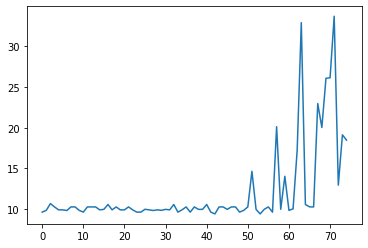

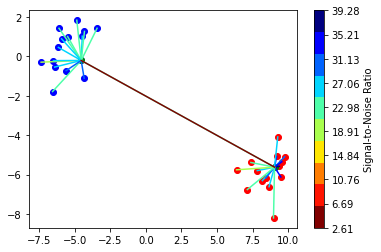

15
14

Power Allocated= 2.3548228002207954
CSI= 0.568488939136046
SNR= 16.787509765920955
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.397208
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.001704
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0.7300678100000617
CSI= 0.2955253764262936
SNR= 32.766522123621286
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.284591
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.113410
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.219544

Power Allocated= 2.273038415665173
CSI= 0.5432321647007892
SNR= 26.63177322210699
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 1.572295
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.05617270677236941
SNR= 27.372542543896735
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1923233184383673

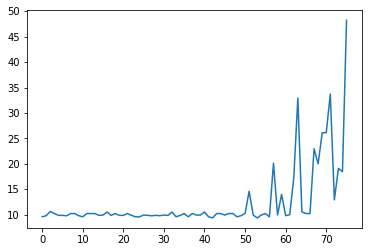

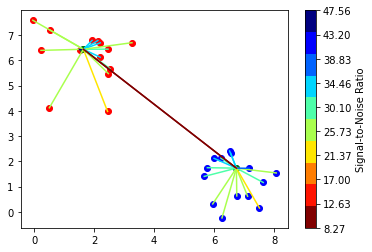

15
14

Power Allocated= 0
CSI= 0.128681317777254
SNR= 8.266599494243428
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.029842975927857895
SNR= 32.816540081214434
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18120498249507333
SNR= 30.713901725857745
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5625348060518416
CSI= 0.4952562488201443
SNR= 22.47348697307207
Client: client12
Model client12 Train Epoch: 1 [0/320 (0%)]	Loss: 2.261547
Model client12 Train Epoch: 2 [0/320 (0%)]	Loss: 0.221223
Model client12 Train Epoch: 3 [0/320 (0%)]	Loss: 0.008370

Power Allocated= 2.009995853846922
CSI= 0.38884849300149427
SNR= 29.225547648603243
Client: client13
Model client13 Train Epoch: 1 [0/320 (0%)]	Loss: 1.923130
Model client13 Train Epoch: 2 [0/320 (0%)]	Loss: 0.827020
Model client13 Train Epoch: 3 [0/320 (0%)]	Loss: 0.204139

Power Alloc

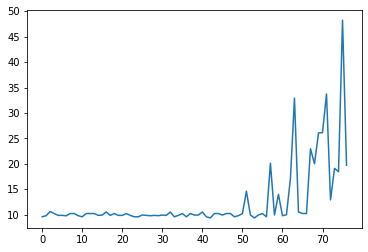

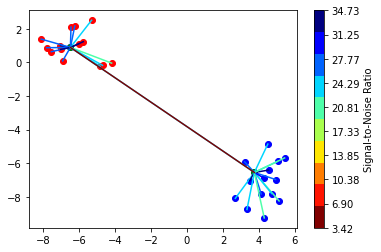

15
14

Power Allocated= 3.208722227024643
CSI= 0.6916086224395842
SNR= 20.053144191430086
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.510263
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000681
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 1.0403946596042575
CSI= 0.2766839508688643
SNR= 23.805742037117522
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.499759
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.268954
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 1.098176

Power Allocated= 2.480975194151571
CSI= 0.4600553482457821
SNR= 21.114331811137387
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.430399
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.058219
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.016093

Power Allocated= 2.0477326515620193
CSI= 0.38359825210623455
SNR= 31.895228958354238
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.418679
Model client5 Train E

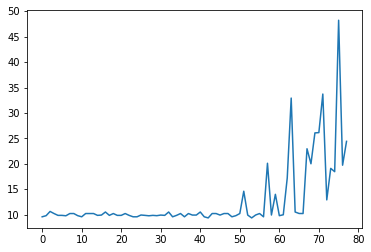

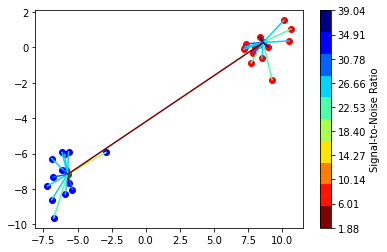

14
14

Power Allocated= 3.2932034908228505
CSI= 0.7552710267724851
SNR= 30.601779443002933
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.286206
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000756
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0.29681841946190524
CSI= 0.23145934879599817
SNR= 1.88216131126591
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.293243
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.082375
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.047312

Power Allocated= 2.3956737765393896
CSI= 0.45013459962971436
SNR= 24.903568636495827
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.055391
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.204687
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.141896

Power Allocated= 1.2177253487332962
CSI= 0.29416037305229714
SNR= 26.332869633643497
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 1.622787
Model client8 Trai

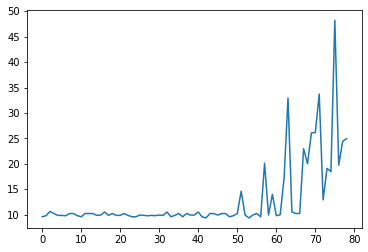

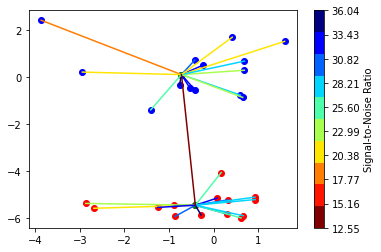

14
14

Power Allocated= 3.5503542638770367
CSI= 0.9629405795147222
SNR= 30.84757534109867
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.966179
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.271412
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.023578

Power Allocated= 2.8351420138947434
CSI= 0.5702236311019372
SNR= 12.54975195577872
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.450872
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 0.123866
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.016401

Power Allocated= 0
CSI= 0.1790486099967038
SNR= 29.67882672052799
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6011374315437026
CSI= 0.3347053452433173
SNR= 30.404539924801018
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 1.937982
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 0.466701
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 0.169069

Power Allocated= 3.52145914251634

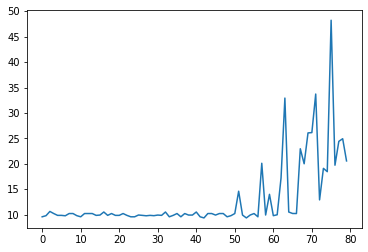

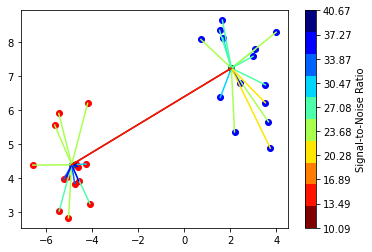

15
14

Power Allocated= 3.2033464125266606
CSI= 0.9883431125051484
SNR= 21.943322317345608
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.090994
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000002
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.92607185129432
CSI= 0.7757537035511242
SNR= 29.720509147693377
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.301923
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.166358
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.792655

Power Allocated= 1.5542448629123755
CSI= 0.3758132707991675
SNR= 24.74217885443412
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.836881
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.169068
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.005683479004752
CSI= 0.4525998293646639
SNR= 29.336543472799313
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.197037
Model client6 Train Epoc

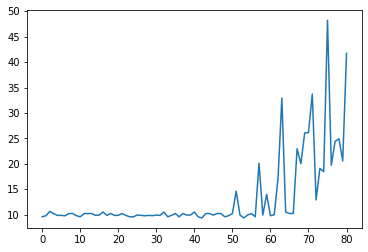

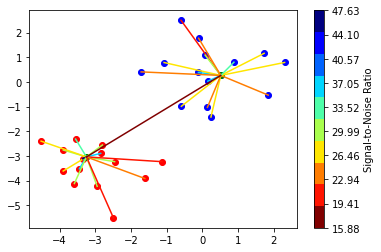

14
14

Power Allocated= 2.993415925732563
CSI= 0.6110070178159575
SNR= 34.61050221763298
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.393099
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.212309
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000183

Power Allocated= 3.4758645301234967
CSI= 0.866405617963434
SNR= 31.90826349845755
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.626347
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.020810
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.191932204017916
CSI= 0.4101510523842762
SNR= 17.214335122780515
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.002827
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.054640
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000015

Power Allocated= 0
CSI= 0.166500637232588
SNR= 27.22581958887281
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1146568677141544
CSI= 

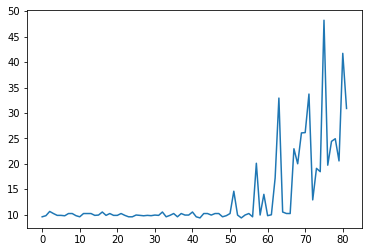

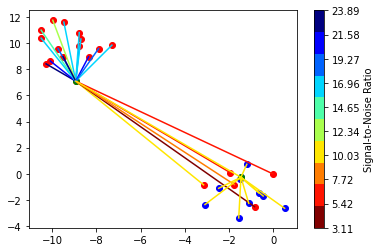

9
19

Power Allocated= 1.1920773461243832
CSI= 0.33984175727540133
SNR= 23.88865142461867
Client: client15
Model client15 Train Epoch: 1 [0/320 (0%)]	Loss: 1.913249
Model client15 Train Epoch: 2 [0/320 (0%)]	Loss: 0.294829
Model client15 Train Epoch: 3 [0/320 (0%)]	Loss: 0.313607

Power Allocated= 2.8453470811569455
CSI= 0.7756289595712378
SNR= 23.88865142461867
Client: client17
Model client17 Train Epoch: 1 [0/320 (0%)]	Loss: 2.131373
Model client17 Train Epoch: 2 [0/320 (0%)]	Loss: 0.276902
Model client17 Train Epoch: 3 [0/320 (0%)]	Loss: 0.339783

Power Allocated= 1.2578839570558715
CSI= 0.3476157789557892
SNR= 4.80331953455439
Client: client18
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9343334621212835
CSI= 0.8331320807722887
SNR= 8.68237636179422
Client: client20
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0035158288792958015
SNR= 17.936186119993526
Client: client25
Poor Channel, client not taken for ave

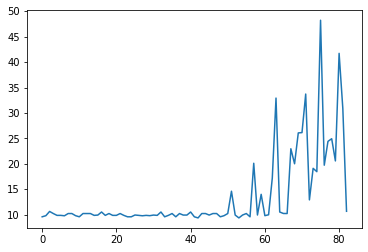

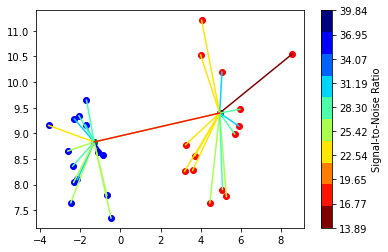

15
14

Power Allocated= 2.5909848734477356
CSI= 0.8006623237710866
SNR= 24.255339920258752
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.971998
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.228294
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.094133

Power Allocated= 0
CSI= 0.12758278253880673
SNR= 39.83665659410437
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2367115537234223
CSI= 0.6237372070266178
SNR= 25.094267250567647
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.572509
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.019470
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000435

Power Allocated= 1.5742481457458877
CSI= 0.4413641731226722
SNR= 28.461706080392485
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 2.675213
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 0.702126
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 0.507306

Power Allocated= 2.13935424268

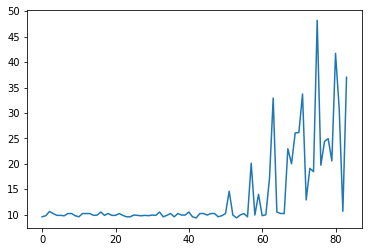

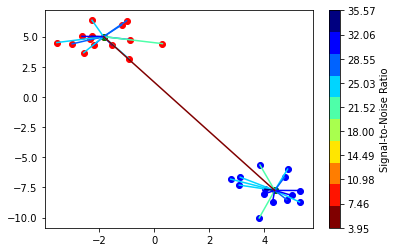

14
14

Power Allocated= 1.766768231427724
CSI= 0.3622969146069309
SNR= 22.44286026103252
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.129065
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.124014
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.355697

Power Allocated= 3.412955201906092
CSI= 0.8976821338963235
SNR= 27.08970187256657
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.190327
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.097079
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000953

Power Allocated= 3.151239576400496
CSI= 0.7269049459218926
SNR= 29.839542720388256
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.061469
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.023308
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.8598827045269397
CSI= 0.5998611104502553
SNR= 24.196101920959087
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.035640
Model client6 Train Epoch

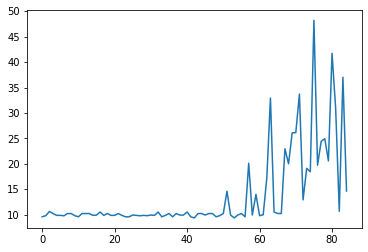

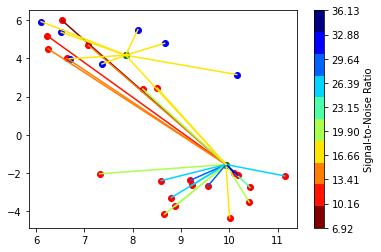

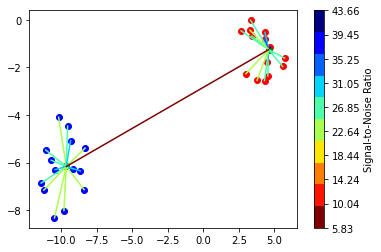

14
14

Power Allocated= 2.467796057861818
CSI= 0.5962638633036945
SNR= 24.815292792276455
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.833664
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000242
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000001

Power Allocated= 2.6177105200461677
CSI= 0.6547950616938331
SNR= 43.65604005140335
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.663543
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.151385
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000333

Power Allocated= 2.368920246243049
CSI= 0.5630676080607011
SNR= 23.30882937389041
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 1.748398
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 0.205254
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 1.135669307112356
CSI= 0.33231019416318386
SNR= 30.87708602951309
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 3.102372
Model client8 Train Epoch

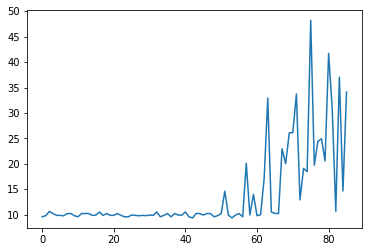

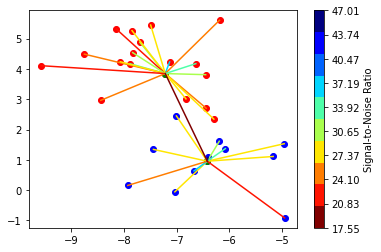

11
17

Power Allocated= 0
CSI= 0.02360666237410125
SNR= 36.56783280629359
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.693039670522424
CSI= 0.41772297201116126
SNR= 28.07891257375637
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.986949
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.064371
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.007059

Power Allocated= 2.880203975871458
CSI= 0.8286605431728279
SNR= 28.564916726575724
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.943721
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.074136
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.193571

Power Allocated= 0.12893816219064913
CSI= 0.2526507756129066
SNR= 27.139021786599912
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 1.994506
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 0.448171
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.9043115663940884

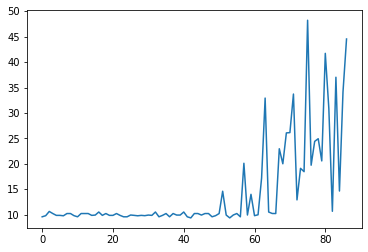

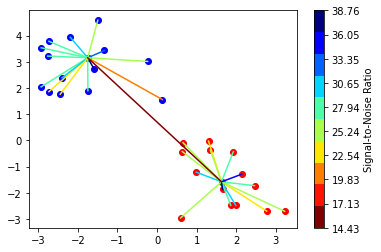

14
14

Power Allocated= 0
CSI= 0.1521758384222326
SNR= 30.539918226484332
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.117124231930913
CSI= 0.8802637926631209
SNR= 21.780296508877043
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.766566
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.038997
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.723217

Power Allocated= 2.3910526535947296
CSI= 0.5370296221750965
SNR= 29.999813768161246
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.164773
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.078375
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000091

Power Allocated= 2.0618566474861875
CSI= 0.4563520524343443
SNR= 36.83932092204767
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 1.851630
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 1.221566
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.324246

Power Allocated= 3.2452665473315188


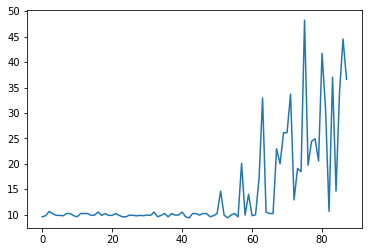

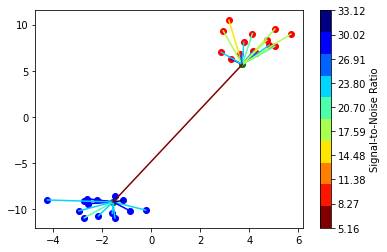

14
14

Power Allocated= 2.8421563172673543
CSI= 0.8146530131739222
SNR= 30.74178403248083
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.259620
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.030380
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000060

Power Allocated= 2.6423730558792666
CSI= 0.7006236813990634
SNR= 28.404407355601215
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.966310
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.061474
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.040006

Power Allocated= 0.9735734402722374
CSI= 0.32298705059471555
SNR= 27.457858114884594
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.873091
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.459533
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.031072073605003303
SNR= 22.021037015751652
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.148277

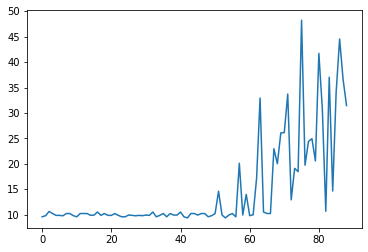

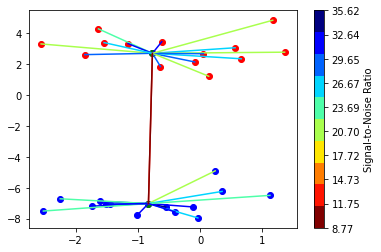

15
14

Power Allocated= 3.1132495760242977
CSI= 0.7991844714766283
SNR= 24.114541031166837
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.558970
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 1.463142

Power Allocated= 2.6806080927802913
CSI= 0.5938534809953311
SNR= 26.931480359330376
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.039268
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.132458
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.011040

Power Allocated= 3.1566505466573402
CSI= 0.8279005169814567
SNR= 30.322058983399465
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.913134
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.018032
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000183

Power Allocated= 0
CSI= 0.019237924766727588
SNR= 35.62146734351012
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1752107

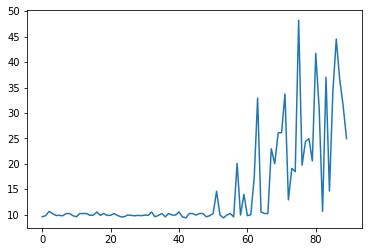

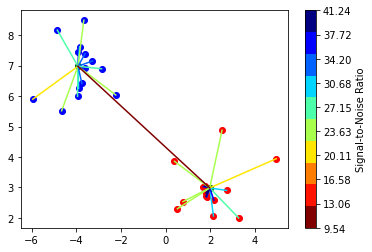

14
14

Power Allocated= 0.8338124432243847
CSI= 0.26975255034190104
SNR= 29.03384153791338
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.092901
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.954834
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.036936849292281
CSI= 0.6649038812402667
SNR= 22.230258957502816
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.478491
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.023372
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.5549863870593654
CSI= 0.5035431195360647
SNR= 25.663840101684062
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.831740
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.076847
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000006

Power Allocated= 2.480112973370402
CSI= 0.4852482921617556
SNR= 23.223778527157616
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.526055
Model client8 Train Ep

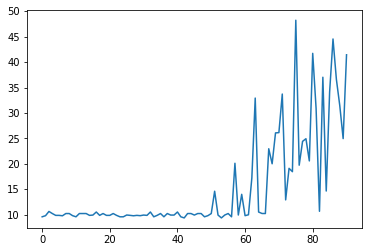

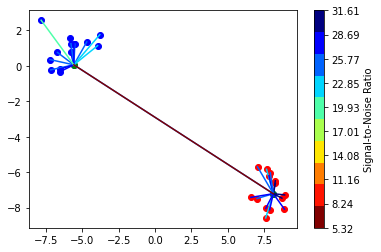

15
14

Power Allocated= 0
CSI= 0.05096384118159303
SNR= 24.779702565840665
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5852933717681545
CSI= 0.4091014081021652
SNR= 22.81228440244017
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.900616
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.253426
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.275315

Power Allocated= 3.330729468402787
CSI= 0.588600359784336
SNR= 21.82414727673831
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.310814
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.025454
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000107

Power Allocated= 0
CSI= 0.17651843916277077
SNR= 26.4104764643116
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1936882196836217
SNR= 20.84490983289091
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 

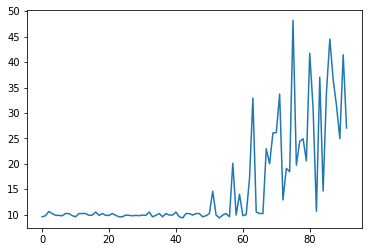

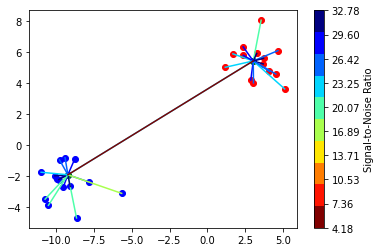

15
14

Power Allocated= 2.4259923660183587
CSI= 0.5033521158467921
SNR= 19.426919891565234
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.345576
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.094156
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.088761

Power Allocated= 3.09154214832072
CSI= 0.7569271804482932
SNR= 22.2546582427711
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 1.887370
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.2907672120269664
CSI= 0.8913402843168071
SNR= 19.05481253917426
Client: client12
Model client12 Train Epoch: 1 [0/320 (0%)]	Loss: 2.190376
Model client12 Train Epoch: 2 [0/320 (0%)]	Loss: 0.181728
Model client12 Train Epoch: 3 [0/320 (0%)]	Loss: 0.260284

Power Allocated= 2.580145249327165
CSI= 0.5456942695137962
SNR= 31.83626944279342
Client: client14
Model client14 Train Epoch: 1 [0/320 (0%)]	Loss: 1.989319
Model client14 Train 

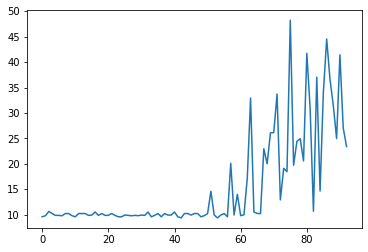

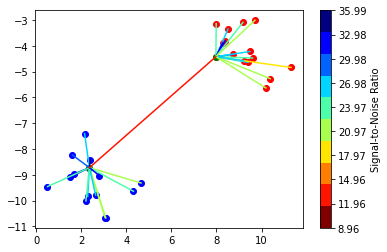

14
14

Power Allocated= 2.9073943412599066
CSI= 0.7980644151947478
SNR= 31.050539924355352
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.771762
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000074
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.181861295279231
CSI= 0.5054168729744103
SNR= 31.5385049292174
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.296643
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.027373
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000412

Power Allocated= 1.9468421928187718
CSI= 0.45175609989364807
SNR= 24.340664756958002
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 1.882008
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 1.936199249023177
CSI= 0.4495944431656834
SNR= 20.442462560717033
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 2.818505
Model client10 Train 

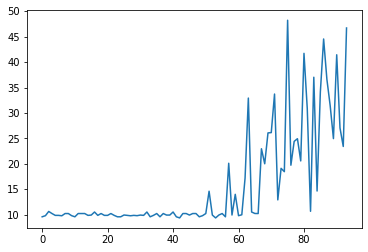

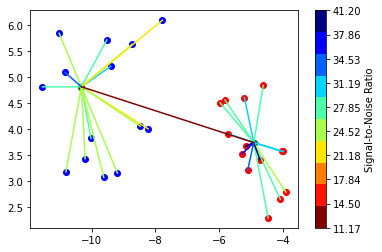

14
14

Power Allocated= 0
CSI= 0.13035742350988433
SNR= 28.016118886135736
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.01648530257193692
SNR= 26.809433463047185
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.39540738128919
CSI= 0.7240845351642823
SNR= 18.06154937494968
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 0.947800
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.3636983573701675
CSI= 0.7078326868737745
SNR= 11.16599565985155
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 1.990856
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 0.314841
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 0.071574

Power Allocated= 0.8317907551354815
CSI= 0.2535065763469849
SNR= 27.094040510151093
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 1.290548
Mo

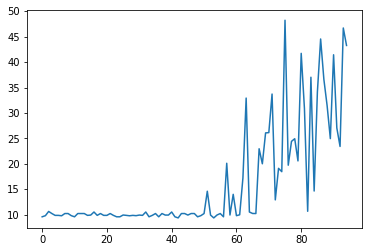

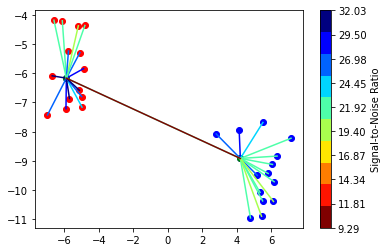

15
14

Power Allocated= 3.324081277100403
CSI= 0.7239251861496675
SNR= 20.457508277630435
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.975420
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000002
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.0544341242210844
SNR= 29.484526739653138
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14900724379704866
SNR= 24.601611874633544
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.416350162330343
CSI= 0.30403552502534825
SNR= 28.44346877192038
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.245046
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.106729
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000093

Power Allocated= 3.6276907156105804
CSI= 0.927860022273945
SNR= 26.48674390053794
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 1.921184
Model cli

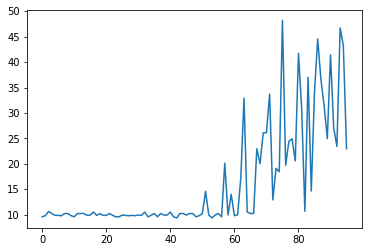

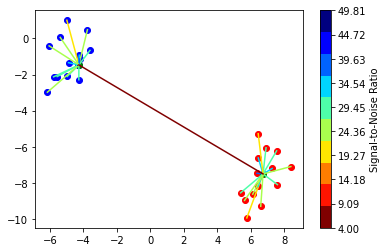

14
14

Power Allocated= 1.9673971947696067
CSI= 0.43999257464456
SNR= 33.20052617043063
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.327064
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000001
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 1.8565827878275676
CSI= 0.41953699290870505
SNR= 26.809934148530537
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.781928
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.001608
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 1.3533908438149678
CSI= 0.34640768563270397
SNR= 18.215981140406395
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.021805
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.110551
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.171980

Power Allocated= 0.5512665047612653
CSI= 0.2710837914468677
SNR= 3.999639188336202
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 1.478178
Model client8 Train Ep

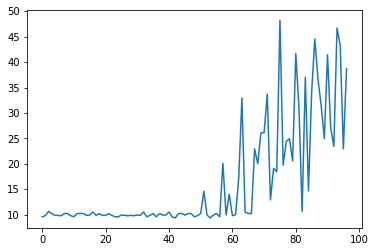

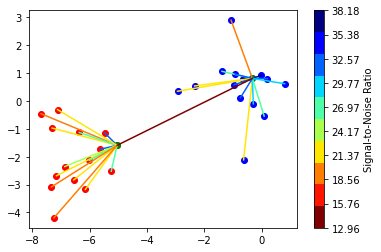

14
14

Power Allocated= 3.1151764532173596
CSI= 0.8162590146235127
SNR= 20.738474148452717
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.624166
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.692561
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.870550

Power Allocated= 2.0463682733814093
CSI= 0.43593698796019276
SNR= 31.42030050380185
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.923937
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.003647
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.420599163573616
CSI= 0.5209205294055658
SNR= 38.17775246475803
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 1.628701
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 0.001931
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000002

Power Allocated= 0
CSI= 0.004965124023048939
SNR= 19.309550788727275
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.586685092366844

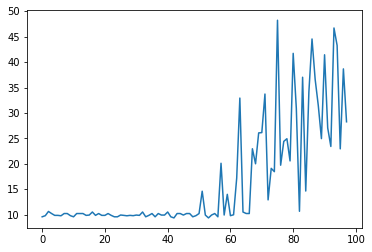

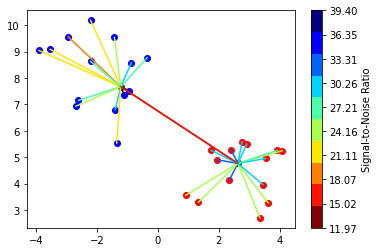

15
14

Power Allocated= 2.559449966165056
CSI= 0.6722713522828835
SNR= 16.876377033540578
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1600978723700353
CSI= 0.5299847667645995
SNR= 25.560184046919932
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.778255
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.099265
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.7809207613040345
CSI= 0.7898745691117244
SNR= 18.698320189825814
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.018949
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.362375
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.239228

Power Allocated= 2.810161069231966
CSI= 0.8085489578437107
SNR= 22.591877810928185
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.394715
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000440
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.003372

Power Allocated= 2.

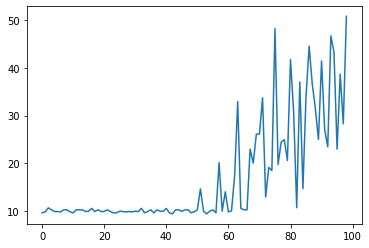

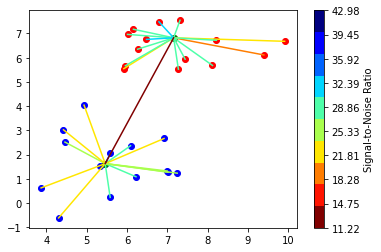

14
14

Power Allocated= 2.0515640334742735
CSI= 0.5501136984929451
SNR= 28.49645284882664
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.151122
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.056485
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.6611356516101505
CSI= 0.8276539615426285
SNR= 22.682161173528986
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.056390
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.227543
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.8638785835257843
CSI= 0.9945385086592917
SNR= 26.316451712491734
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.630363
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.008041
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.857680661226767
CSI= 0.9884456580594971
SNR= 17.81432244488213
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 1.226405
Model client7 Train Epo

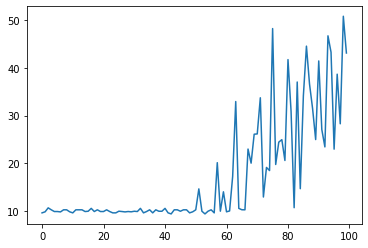

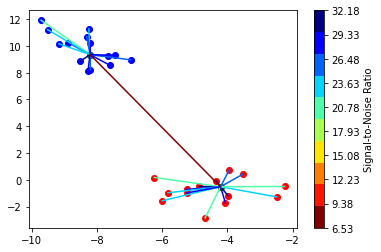

14
14

Power Allocated= 0
CSI= 0.18462055589352133
SNR= 32.09357737283194
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2761951400743823
CSI= 0.8995278768558028
SNR= 21.28200074907642
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.868504
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.242620
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.572269

Power Allocated= 3.2956550689338893
CSI= 0.9155544268270089
SNR= 31.25106896168849
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.172047
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.010078
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.9495666395443694
CSI= 0.6952542294275567
SNR= 29.514781931746576
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.626511
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.232099862642688
C

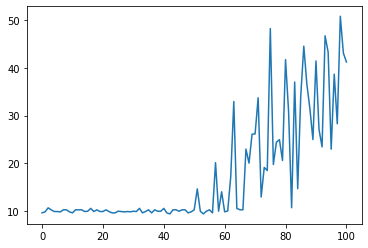

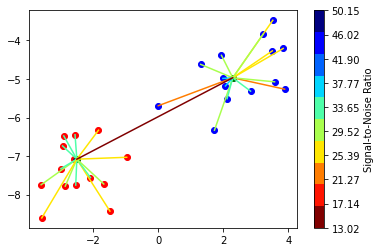

14
14

Power Allocated= 1.466090644633217
CSI= 0.3012073287373396
SNR= 32.61238023026607
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.818714
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.308844
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.722732

Power Allocated= 0
CSI= 0.04596498406880334
SNR= 28.483451756757482
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2035405909239958
SNR= 25.943405376197717
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.155183162575126
CSI= 0.6131659650832094
SNR= 50.14797092229657
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 1.762838
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 0.086646
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 0.001347

Power Allocated= 1.886114155116072
CSI= 0.34483367080021166
SNR= 33.24268763862638
Client: client12
Model client12 Train Epoch: 1 [0/320 (0%)]	Loss: 1.764292
Mode

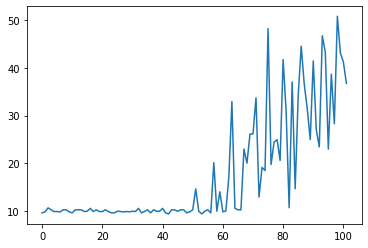

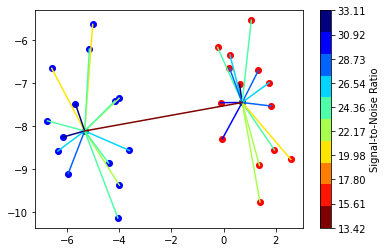

14
14

Power Allocated= 2.9101190479987773
CSI= 0.6033756367867436
SNR= 28.624534461135532
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.042088
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000959
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000262

Power Allocated= 3.529755130267751
CSI= 0.9636638270350116
SNR= 21.03581765643027
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 1.349785
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 0.023399
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 0.022205

Power Allocated= 2.9102997470969605
CSI= 0.6034414296639299
SNR= 28.89228882491851
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 1.087483
Model client11 Train Epoch: 2 [0/320 (0%)]	Loss: 0.405825
Model client11 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.20502737784606817
SNR= 25.787929234213788
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.02583433

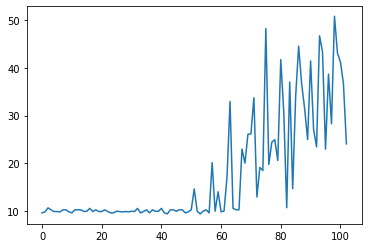

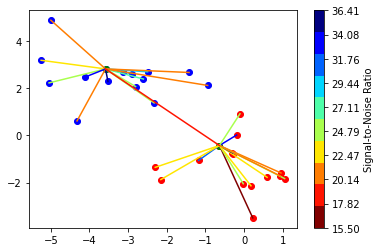

14
14

Power Allocated= 0.9380574726994539
CSI= 0.2767320470602309
SNR= 34.15885260305722
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.737864
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.054372135766973306
SNR= 15.497941063426696
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0760683983249404
CSI= 0.6776936651334984
SNR= 31.865945116902083
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 1.899772
Model client11 Train Epoch: 2 [0/320 (0%)]	Loss: 0.051515
Model client11 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.350631896247605
CSI= 0.8326190432305316
SNR= 24.714190293080694
Client: client16
Model client16 Train Epoch: 1 [0/320 (0%)]	Loss: 2.294960
Model client16 Train Epoch: 2 [0/320 (0%)]	Loss: 0.221803
Model client16 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.3665694

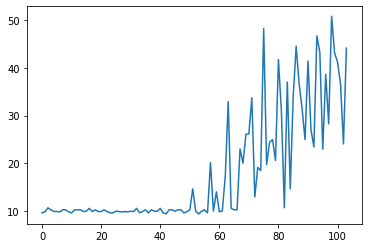

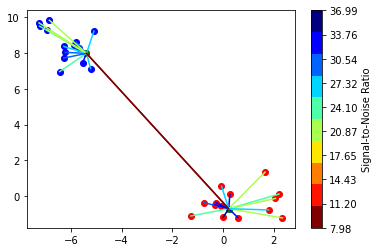

15
14

Power Allocated= 2.575106826011889
CSI= 0.556703981972665
SNR= 29.819689711239207
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.691634
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000067
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.1424804394181134
CSI= 0.8137271467566514
SNR= 26.53750654174275
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.677614
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.355339
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.07475740469513792
SNR= 28.642746427312847
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.595917968309333
CSI= 0.5632293578087312
SNR= 32.49288585617591
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.529844
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.216063953443

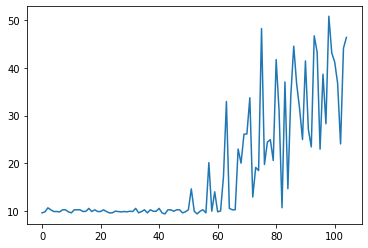

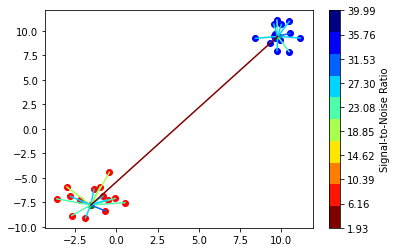

14
14

Power Allocated= 0
CSI= 0.07418162463196665
SNR= 36.94049277713901
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.38160323567796
CSI= 0.9297834545260577
SNR= 39.99195176288968
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.661813
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.019675

Power Allocated= 0
CSI= 0.020690811981497137
SNR= 23.732239732415188
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2010093870516405
CSI= 0.7961066596945875
SNR= 23.0521502675114
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.866572
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000411
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.3319541178631935
CSI= 0.47055095351704535
SNR= 1.9306371247344831
Client: client7
Poor Channel, client not taken for averaging in this round

Power

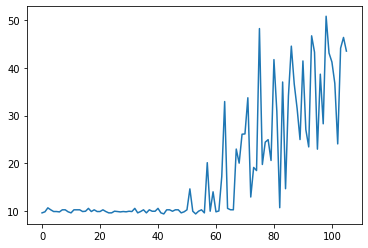

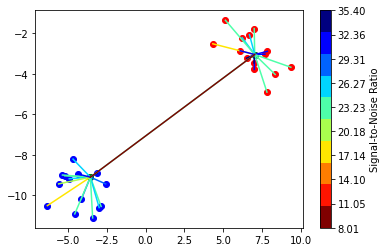

15
14

Power Allocated= 0.965674554576804
CSI= 0.2992156864306035
SNR= 26.42525561941991
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.913602
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.2440424344853893
CSI= 0.940112138348267
SNR= 35.40015851861507
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.970479
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.001741
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.19231626040155825
SNR= 21.53498393204338
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1666189321455223
CSI= 0.4670438899940881
SNR= 26.048074188306558
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.051206
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.180680922045034
CSI

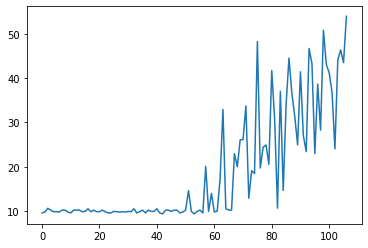

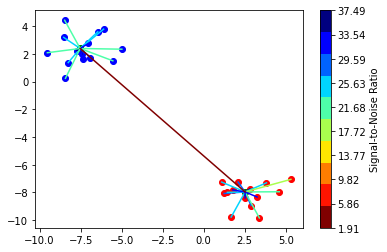

14
14

Power Allocated= 3.0952918230328317
CSI= 0.7773359329182755
SNR= 20.828387644310332
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.108400
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.218023
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000640

Power Allocated= 3.206935984194498
CSI= 0.8512080379603788
SNR= 27.641700729878945
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 1.892564
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 0.196126
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.8945190080338565
CSI= 0.6723964199242373
SNR= 21.163661388451516
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 0.774676
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.2203695379911226
CSI= 0.8610539740027733
SNR= 34.81334202532848
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 0.982808
Model client9 Train Ep

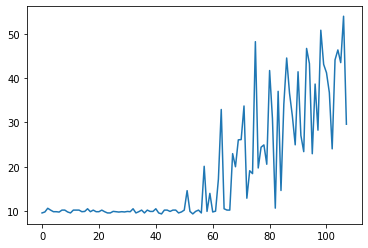

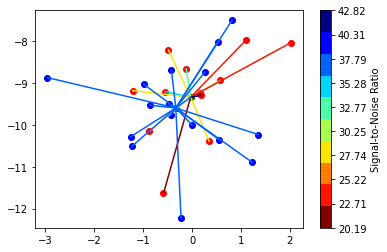

16
12

Power Allocated= 2.820827362148809
CSI= 0.7960858731828412
SNR= 28.492493930507013
Client: client14
Model client14 Train Epoch: 1 [0/320 (0%)]	Loss: 1.047587
Model client14 Train Epoch: 2 [0/320 (0%)]	Loss: 0.015192
Model client14 Train Epoch: 3 [0/320 (0%)]	Loss: 0.018605

Power Allocated= 2.648383839673596
CSI= 0.6999911865736272
SNR= 28.492493930507013
Client: client15
Model client15 Train Epoch: 1 [0/320 (0%)]	Loss: 1.356506
Model client15 Train Epoch: 2 [0/320 (0%)]	Loss: 0.044647
Model client15 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000050

Power Allocated= 1.4481051241030038
CSI= 0.3803918455344951
SNR= 25.726231870058957
Client: client16
Model client16 Train Epoch: 1 [0/320 (0%)]	Loss: 2.179435
Model client16 Train Epoch: 2 [0/320 (0%)]	Loss: 0.088724
Model client16 Train Epoch: 3 [0/320 (0%)]	Loss: 0.005024

Power Allocated= 2.9386190944586197
CSI= 0.8784612334313353
SNR= 42.82303297604195
Client: client17
Model client17 Train Epoch: 1 [0/320 (0%)]	Loss: 1.008544
Model cli

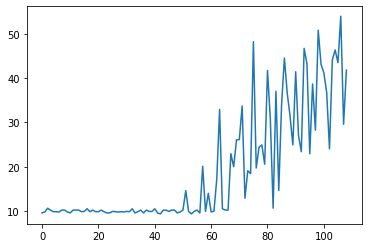

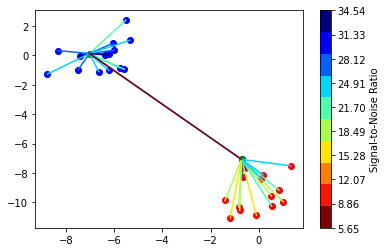

15
14

Power Allocated= 3.2843257953970744
CSI= 0.7565175068174368
SNR= 24.221323578655994
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.273714
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.19871598620021058
SNR= 17.247018459527858
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04334603570593676
SNR= 24.07434089838935
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4723727410342056
CSI= 0.8819901346831313
SNR= 22.23095896681595
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 1.661711
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 0.034412
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 1.2228216404246242
CSI= 0.2955649914050593
SNR= 5.649403180559025
Client: client9
Poor Channel, client not taken for averaging in this round

Powe

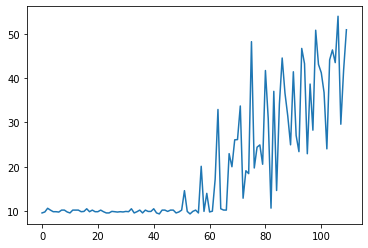

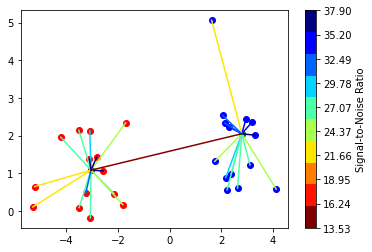

14
14

Power Allocated= 1.9058884540298466
CSI= 0.41493133529557846
SNR= 24.465510015633637
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.923961
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.020454
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.10674875675712614
SNR= 24.847507147083263
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17135784488515493
SNR= 19.012561205159148
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1866419749329555
CSI= 0.8855170045314282
SNR= 23.65284148823432
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.070807
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000290
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.251908443865572
CSI= 0.9398343232997177
SNR= 30.50111280718487
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 1.256324
Model 

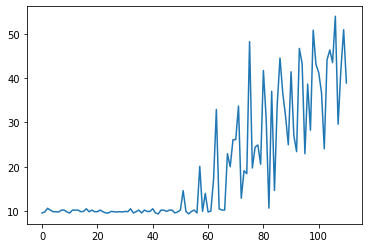

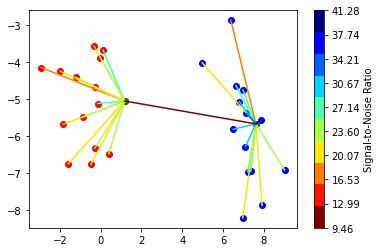

14
14

Power Allocated= 0
CSI= 0.015048102137017239
SNR= 25.679341353394495
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9946784862881257
CSI= 0.8439707851467856
SNR= 24.593620934746973
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.606694
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.104640
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.1007112180438194
CSI= 0.9269194414140411
SNR= 9.459360313072196
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.996000
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000847
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.14047882611530982
SNR= 13.086146997479865
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.671691424644504
CSI= 0.3987459918600005
SNR= 24.135975246202015
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 2.285428
Mod

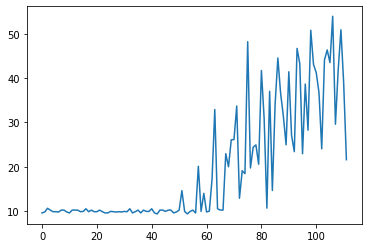

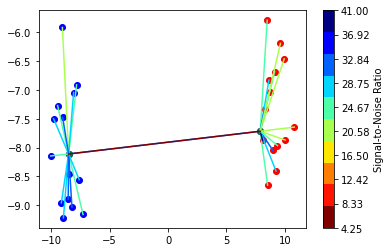

15
14

Power Allocated= 3.068893324306278
CSI= 0.5935203686804735
SNR= 28.855283037417923
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.123990
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.137277
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.409048

Power Allocated= 3.5069512775506944
CSI= 0.8020505614331891
SNR= 26.306671007634606
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.251008
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.009331
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.9951743569424094
CSI= 0.5686402488822948
SNR= 23.654410539352263
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.268057
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0.560135889205899
CSI= 0.23845749035947206
SNR= 16.720751691134005
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 2.093129
Model client11 Trai

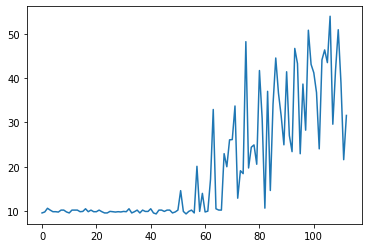

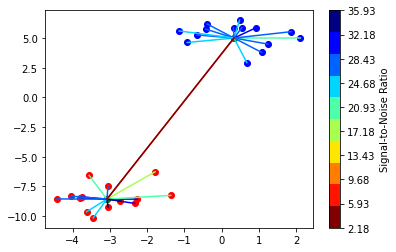

15
14

Power Allocated= 3.3819767249704857
CSI= 0.767611861966681
SNR= 20.06621577583777
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.708529
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.04308062417279723
SNR= 30.532032693974994
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.043090803130241495
SNR= 26.108024946584266
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10569453738619494
SNR= 25.02979017734711
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0607742023095893
SNR= 23.735421288252923
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9533454843815563
CSI= 0.577576305492585
SNR= 24.79074705791778
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 1.

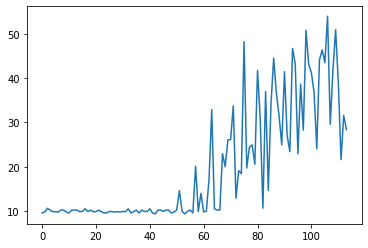

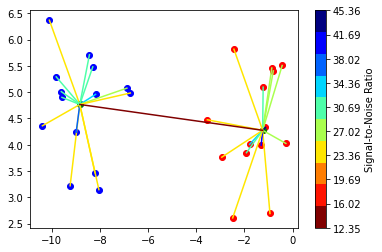

14
14

Power Allocated= 0
CSI= 0.20271222160246483
SNR= 22.986266141346174
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09425601493638358
SNR= 26.753629498770543
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8116285998874906
CSI= 0.9436040261025049
SNR= 21.706971825552742
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.593117
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000074
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.003208

Power Allocated= 3.0366548688476676
CSI= 0.5450362651831093
SNR= 21.464311375296933
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.669498
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 0.002321
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0.5559126152620948
CSI= 0.23172379632579954
SNR= 23.88089713555143
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 0.783578
Mode

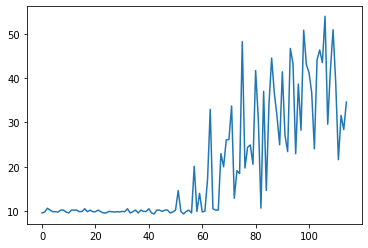

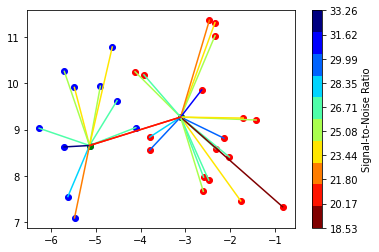

11
18

Power Allocated= 2.818717468324656
CSI= 0.6139151032326539
SNR= 26.76508786764349
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.116588
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000244
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.16929234786085035
SNR= 24.292962103186053
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.782291250248986
CSI= 0.6004866570547778
SNR= 25.104673553026142
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.060905
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.913643
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.897250

Power Allocated= 0
CSI= 0.2181810197998647
SNR= 28.601908879507032
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4739552798592728
CSI= 0.5066749593547538
SNR= 22.848545184597675
Client: client12
Model client12 Train Epoch: 1 [0/320 (0%)]	Loss: 2.491602
Model

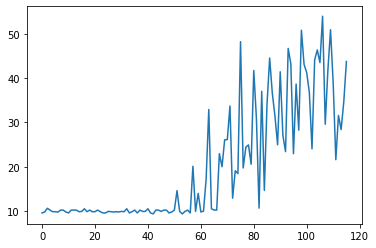

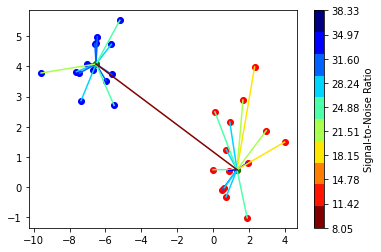

14
14

Power Allocated= 3.7379720995021284
CSI= 0.949959411455056
SNR= 19.75354948223988
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.671893
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.156688
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.110192

Power Allocated= 2.4033545192199757
CSI= 0.4188842863990727
SNR= 8.050984157963017
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4958392942520273
CSI= 0.3035076967635775
SNR= 33.52925752080105
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 0.596673
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.567367769071086
CSI= 0.817473740054939
SNR= 23.209489969813674
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 1.361977
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.7057

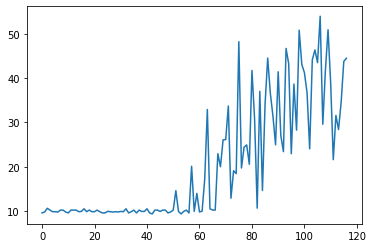

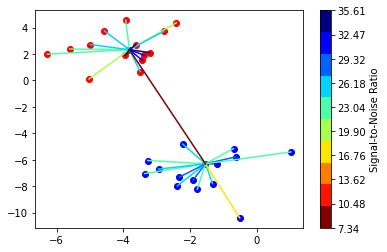

14
14

Power Allocated= 0
CSI= 0.14787355300375282
SNR= 20.13511394351256
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1065365967587844
CSI= 0.7264474190374992
SNR= 35.469294766632345
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.645375
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.335810
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.063792

Power Allocated= 3.1658449733834835
CSI= 0.759155177362592
SNR= 26.305549727565225
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.939967
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000235
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.21411307523301004
SNR= 24.980709631235325
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5063290223946733
CSI= 0.505875824739244
SNR= 23.05873855283653
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 0.636782
Model cl

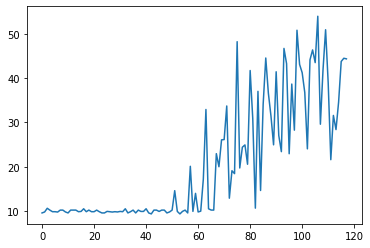

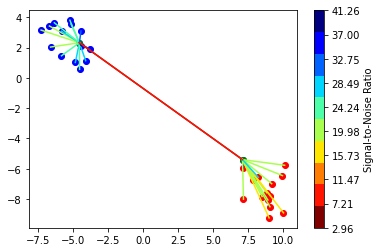

15
14

Power Allocated= 3.3894071812853395
CSI= 0.9327574264608058
SNR= 22.692014795447076
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.810122
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.1103736580228585
CSI= 0.7401247264528071
SNR= 33.42626440391558
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.597625
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.006157
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000052

Power Allocated= 2.7356394665689754
CSI= 0.5794220086350073
SNR= 6.586570950208325
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5431363153538378
CSI= 0.5212783304173968
SNR= 30.76133196978929
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 1.087079
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 1.8

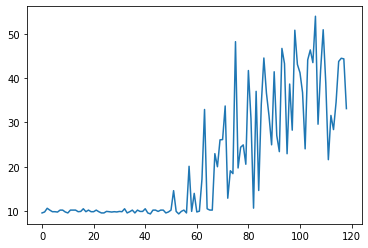

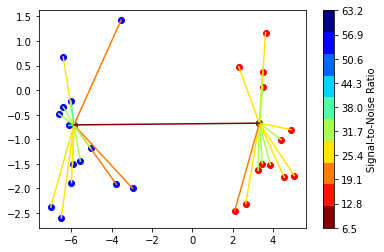

14
14

Power Allocated= 1.8777591862063003
CSI= 0.4253638999143807
SNR= 17.954923156803897
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.784921
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.068757
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.011592

Power Allocated= 2.672357607359575
CSI= 0.6425373303374187
SNR= 37.3434926424648
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.311522
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000036
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.563035323868472
CSI= 0.6003654695168015
SNR= 24.672771400559725
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.755940
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.591124
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.018582

Power Allocated= 2.394711296497868
CSI= 0.5452633704871069
SNR= 26.070446104986534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.023744
Model client5 Train Epoch

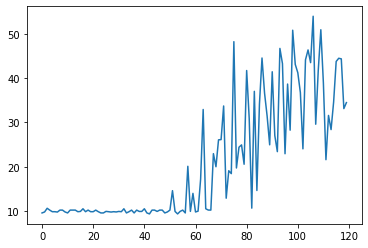

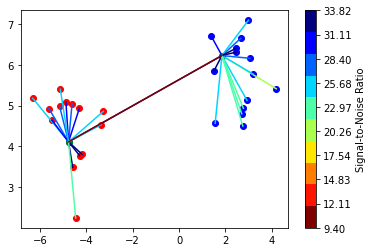

15
14

Power Allocated= 3.4790997874649796
CSI= 0.9822102653651908
SNR= 31.519445184153916
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.207288
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000030
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.403657253066508
CSI= 0.9144491858940635
SNR= 29.398538914961794
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.247771
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 0.117897
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.428505

Power Allocated= 3.061566356033905
CSI= 0.6965508467617008
SNR= 24.448056623337973
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 1.570883
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.2807474833377697
CSI= 0.8220545764406951
SNR= 31.967818208899764
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 0.574073
Model client9 Train Ep

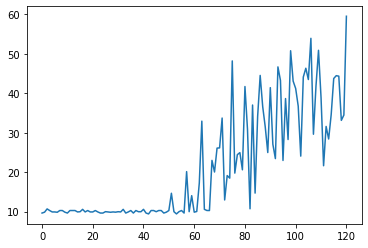

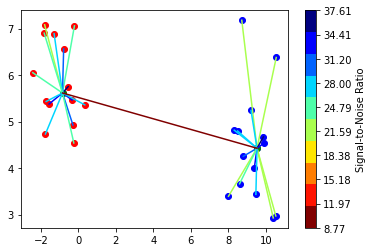

14
14

Power Allocated= 2.749862189214491
CSI= 0.9238417871900274
SNR= 33.08326044437639
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.296763
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 1.5739425845472916
CSI= 0.442799978183402
SNR= 27.740997907465655
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.075769
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.031850
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.1131151532882244
CSI= 0.5816714874265889
SNR= 8.766365212876114
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.330276
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.115453
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.357103

Power Allocated= 1.8802055349613431
CSI= 0.5122706552262479
SNR= 26.654771763227465
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.230989
Model client7 Train Epoc

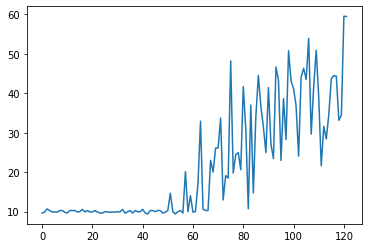

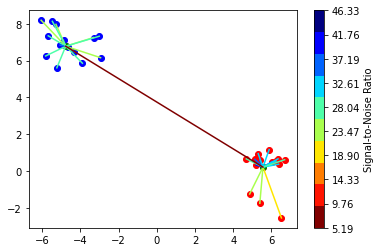

14
14

Power Allocated= 2.7597927042205814
CSI= 0.78527382733745
SNR= 33.59204067590039
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 1.178359
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 0.099567
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.188672

Power Allocated= 2.4296428861551123
CSI= 0.6236004221027518
SNR= 18.16333416637129
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 0.869006
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.15873498406329278
SNR= 21.637648808061705
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9086997871526505
CSI= 0.8892571917524894
SNR= 34.76877996905041
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 0.506514
Model client11 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client11 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.704027098673354

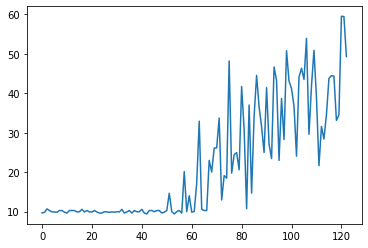

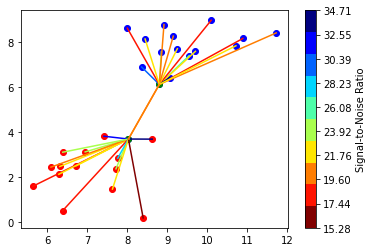

15
14

Power Allocated= 2.9856372962239695
CSI= 0.7749383058959582
SNR= 17.573202213536266
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.317522
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000005
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.068365080229806
CSI= 0.8280219031178532
SNR= 17.573202213536266
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.772758
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.126594
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.025587

Power Allocated= 2.9410880566255755
CSI= 0.7490779534312545
SNR= 17.773220393354755
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.942177
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.140283
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.763996

Power Allocated= 0
CSI= 0.14097475755119648
SNR= 23.565338198105042
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.674555623714995

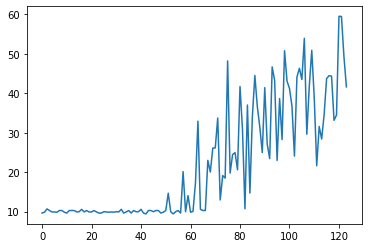

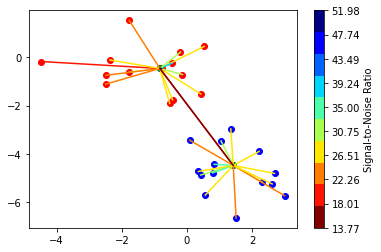

15
14

Power Allocated= 3.2359801547142455
CSI= 0.6112881687537731
SNR= 25.37082376740993
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.802364
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.4692114670624816
CSI= 0.7129319804153714
SNR= 26.561329192461518
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.693848
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.115541
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.256244

Power Allocated= 3.4432049407197454
CSI= 0.6999542103652173
SNR= 24.41344401958109
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.337042
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.137625
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.060052

Power Allocated= 3.438739759073611
CSI= 0.6977733736285279
SNR= 31.85306874846249
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.540452
Model client4 Train Epoc

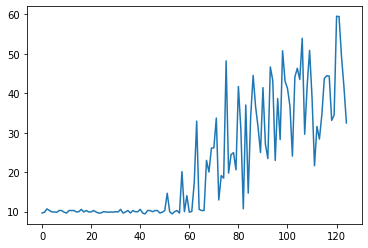

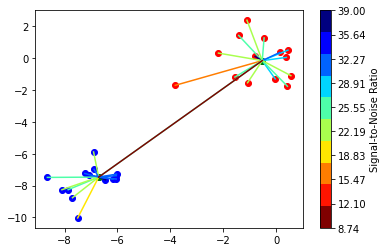

15
14

Power Allocated= 0
CSI= 0.012275825494913906
SNR= 33.938843519601974
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.900817053271293
CSI= 0.81320149792647
SNR= 22.984861550039543
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.384139
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 4.332250
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 2.278621

Power Allocated= 1.2992900524288573
CSI= 0.3532028136330707
SNR= 26.9314738422887
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.015450
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000002
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000173

Power Allocated= 2.8881593683234934
CSI= 0.8049162945973042
SNR= 14.262962234479515
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9681145113604708
CSI= 0.8602816079154219
SNR= 24.68227735749984
Client: client13
Model client13 Train Epoch: 1 [0/320 (0%)]	Loss:

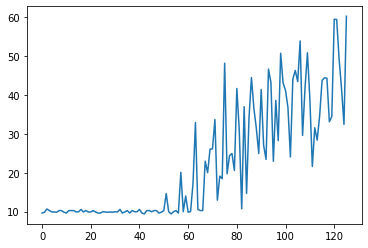

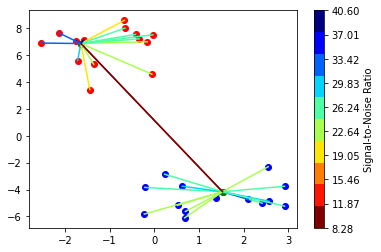

15
14

Power Allocated= 1.2712987544843304
CSI= 0.3070436017495395
SNR= 8.275997915712388
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.48414385555118
CSI= 0.4892316848097654
SNR= 36.66244682435693
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.794456
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.773056
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.029065

Power Allocated= 2.88972152175978
CSI= 0.6103352961901833
SNR= 24.1986605224485
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.607145
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.944747
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.742323

Power Allocated= 2.273141928707006
CSI= 0.4434544061200226
SNR= 8.275997915712388
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 1.614724
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 0.010223
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.001530

Power Allocated= 0
CSI= 0.0

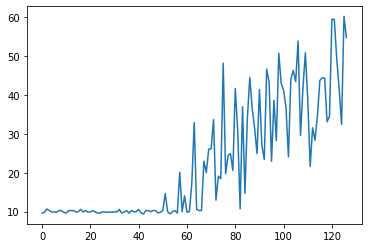

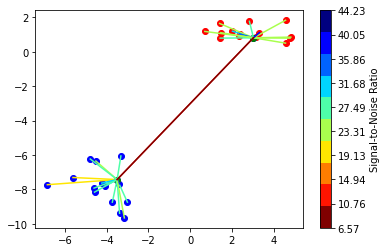

15
14

Power Allocated= 2.8415765423063846
CSI= 0.6650684399228467
SNR= 15.017318263521748
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3111349101771967
CSI= 0.9670747002239516
SNR= 18.569409965426487
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.581215
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.327124
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 1.650310

Power Allocated= 3.1275643945219986
CSI= 0.8212764478796043
SNR= 30.2557695109832
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.954478
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.020549
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.083993

Power Allocated= 0
CSI= 0.03169862658885503
SNR= 44.23104798582664
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.008529232156995192
SNR= 25.89022134227395
Client: client7
Poor Channel, client not taken for averaging in this round

Powe

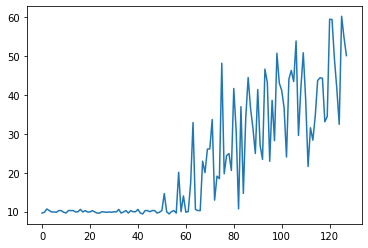

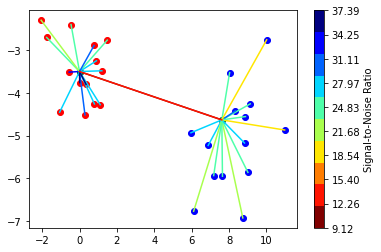

15
14

Power Allocated= 3.9395630647220434
CSI= 0.9806128900742851
SNR= 20.405585759343055
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.337432
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.382248467510403
CSI= 0.6340812329217748
SNR= 26.49167680081188
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.116363
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.594370
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 1.004962

Power Allocated= 1.6492147419522971
CSI= 0.30210396771004533
SNR= 23.26546310396667
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.966208
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.029862
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.014736

Power Allocated= 3.7166832969636707
CSI= 0.8047317139235247
SNR= 22.18981809196708
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 1.563947
Model client7 Train Epo

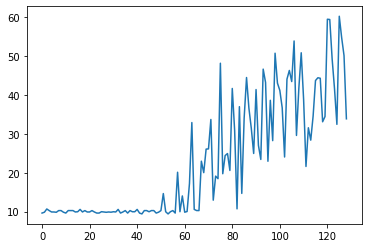

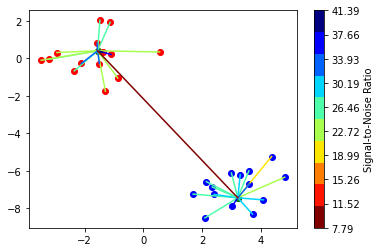

14
14

Power Allocated= 0
CSI= 0.15228306875734843
SNR= 35.84015872603374
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14638288223405138
SNR= 26.29826600202615
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3475616849855996
CSI= 0.7456507220200963
SNR= 7.786783022362874
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 1.607452
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 0.072100
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.187178

Power Allocated= 0
CSI= 0.08702500339496089
SNR= 23.691827653880253
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.122757983710046
CSI= 0.6386045991571253
SNR= 23.538882789689573
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.248619
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.761768

Power Allocated= 3.56

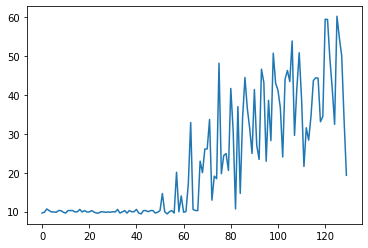

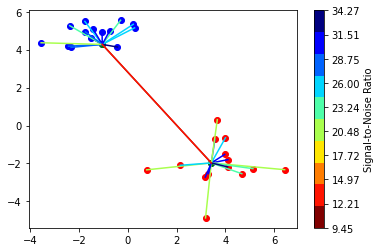

15
14

Power Allocated= 0
CSI= 0.14975168976640574
SNR= 23.96376536239326
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5232726142529867
CSI= 0.3440442966097579
SNR= 29.643967947544333
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.134749
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.101506
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.031408

Power Allocated= 2.8132237147918504
CSI= 0.618562556561652
SNR= 34.269356168983336
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.282397
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000008
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.07939730648123833
SNR= 18.566517666591256
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6040863988764835
CSI= 0.5477085117765048
SNR= 25.216008573768022
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 1.452208
Mode

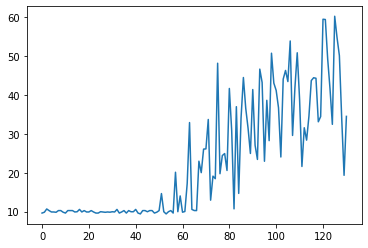

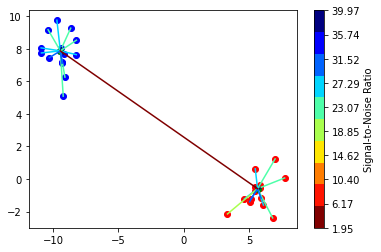

14
14

Power Allocated= 2.0333802392309805
CSI= 0.46066529570876147
SNR= 27.963906835765435
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.870728
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.007762
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.024526

Power Allocated= 2.9866020933986768
CSI= 0.8213204199378559
SNR= 1.9476961426581672
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12997992346360077
SNR= 20.11354479922096
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.084638059797762
CSI= 0.8932434355017574
SNR= 20.3836733003203
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.789714
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.1399091553925156
CSI= 0.9396336598013357
SNR= 26.369557112989913
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 

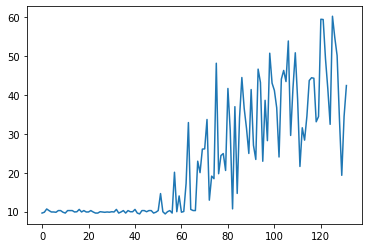

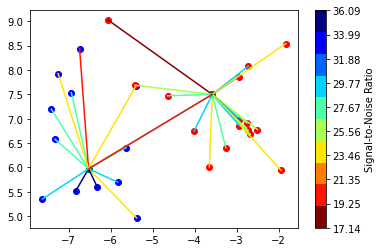

13
16

Power Allocated= 3.5988539795502357
CSI= 0.7517846790521074
SNR= 25.58524108138853
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.111227
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.4257492341919744
CSI= 0.39947702898945414
SNR= 22.389249820525258
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.690413
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.119032
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 1.328788

Power Allocated= 3.0656443064642915
CSI= 0.5366598298631041
SNR= 17.76480297278973
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.592059
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000016
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.0928233068487376
CSI= 0.35258459624004623
SNR= 23.42745931272184
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 0.932353
Model client11 Trai

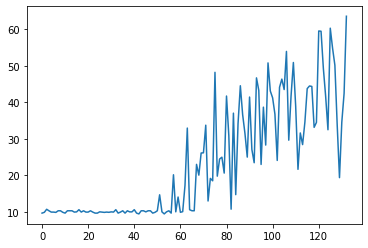

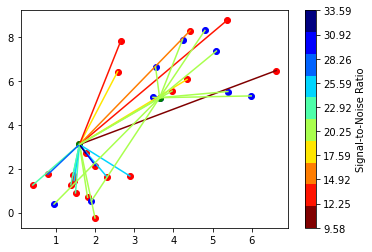

9
19

Power Allocated= 2.96265563479552
CSI= 0.5818845412780832
SNR= 23.559024606465528
Client: client16
Model client16 Train Epoch: 1 [0/320 (0%)]	Loss: 1.200303
Model client16 Train Epoch: 2 [0/320 (0%)]	Loss: 0.003419
Model client16 Train Epoch: 3 [0/320 (0%)]	Loss: 0.047477

Power Allocated= 3.4084163442988977
CSI= 0.785673538274091
SNR= 19.569675997871677
Client: client19
Model client19 Train Epoch: 1 [0/320 (0%)]	Loss: 1.253320
Model client19 Train Epoch: 2 [0/320 (0%)]	Loss: 0.090584
Model client19 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000841

Power Allocated= 0
CSI= 0.17681893979570706
SNR= 12.198503495830154
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6455159610405863
CSI= 0.4912330464631589
SNR= 12.792944817304063
Client: client23
Model client23 Train Epoch: 1 [0/320 (0%)]	Loss: 1.670287
Model client23 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000004
Model client23 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000106

Power Allocated= 2.91624

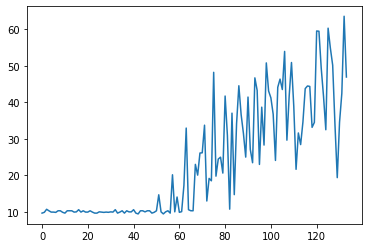

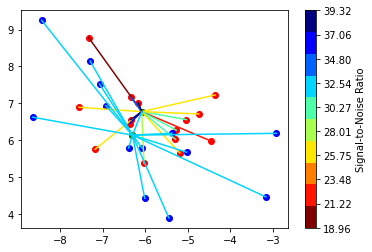

13
15

Power Allocated= 2.442041980271739
CSI= 0.5868906236167872
SNR= 28.504619205529668
Client: client15
Model client15 Train Epoch: 1 [0/320 (0%)]	Loss: 0.991431
Model client15 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000863
Model client15 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.8742570251743818
CSI= 0.7863613756139087
SNR= 24.760511193131222
Client: client16
Model client16 Train Epoch: 1 [0/320 (0%)]	Loss: 2.613983
Model client16 Train Epoch: 2 [0/320 (0%)]	Loss: 0.165717
Model client16 Train Epoch: 3 [0/320 (0%)]	Loss: 0.011427

Power Allocated= 3.0917855407267045
CSI= 0.9486303021332074
SNR= 27.03557668423774
Client: client20
Model client20 Train Epoch: 1 [0/320 (0%)]	Loss: 0.993625
Model client20 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client20 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 1.7177041171590215
CSI= 0.41182211746607256
SNR= 28.065765918152334
Client: client21
Model client21 Train Epoch: 1 [0/320 (0%)]	Loss: 1.260061
Model c

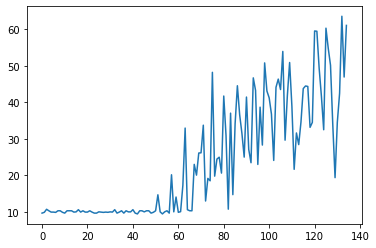

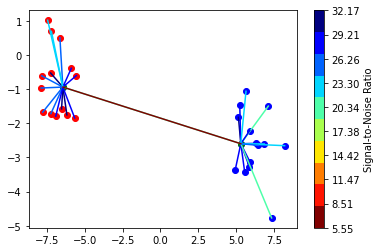

15
14

Power Allocated= 2.5295936309216693
CSI= 0.41854216754096696
SNR= 26.43065406824002
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 0.914802
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.12212804393312271
SNR= 25.751121102025905
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1697289502829371
SNR= 28.680928487544815
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.052043500393733
CSI= 0.5356772703480696
SNR= 26.760454141812282
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 0.740103
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000135
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.1424447964247033
SNR= 5.551073908887127
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.78

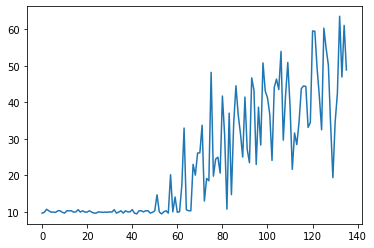

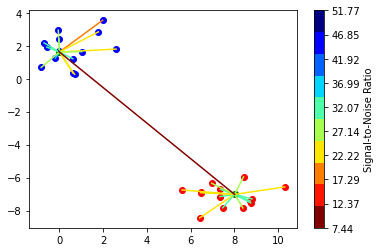

14
14

Power Allocated= 0.17288478894281312
CSI= 0.21644740561672016
SNR= 29.73028636166746
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.178346
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 0.002092
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.641521693056185
CSI= 0.8684904851714917
SNR= 29.179378535402485
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 1.740814
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 0.024807
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000217

Power Allocated= 1.866618548823579
CSI= 0.34172539874165186
SNR= 25.256934294181015
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 1.342215
Model client11 Train Epoch: 2 [0/320 (0%)]	Loss: 1.566226
Model client11 Train Epoch: 3 [0/320 (0%)]	Loss: 0.828980

Power Allocated= 0.7115266195444914
CSI= 0.24501287527852988
SNR= 27.822076106814094
Client: client12
Model client12 Train Epoch: 1 [0/320 (0%)]	Loss: 2.477126
Model cli

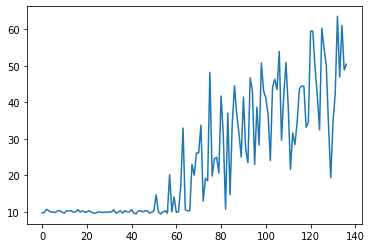

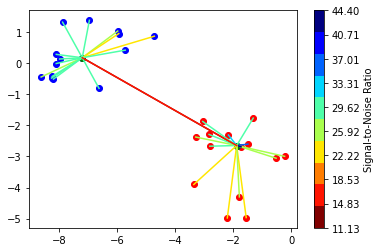

15
14

Power Allocated= 3.0245248925722192
CSI= 0.7060317799219786
SNR= 22.272977636205304
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.559262
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 1.9627339218367479
CSI= 0.40352555284339775
SNR= 21.99768304628763
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.687090
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.531334
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.066444

Power Allocated= 0
CSI= 0.006308467569295262
SNR= 28.77369349873987
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15056800628119194
SNR= 24.684487749283296
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1872234688553633
CSI= 0.44372102885353326
SNR= 24.01076482478676
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 1.382348
Mo

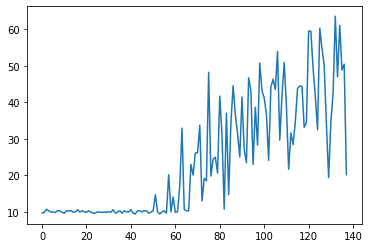

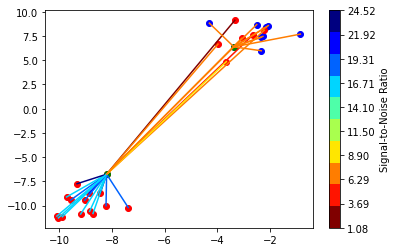

8
20

Power Allocated= 0.6723960790325423
CSI= 0.25237336292522183
SNR= 3.1386486690562245
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.243464
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.172402405994451
CSI= 0.6838182046744141
SNR= 3.1386486690562245
Client: client12
Model client12 Train Epoch: 1 [0/320 (0%)]	Loss: 2.130870
Model client12 Train Epoch: 2 [0/320 (0%)]	Loss: 0.502639
Model client12 Train Epoch: 3 [0/320 (0%)]	Loss: 0.002584

Power Allocated= 0
CSI= 0.06856037342522248
SNR= 22.22167691795025
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4610310415359202
CSI= 0.3150848435152037
SNR= 18.463288217437366
Client: client18
Model client18 Train Epoch: 1 [0/320 (0%)]	Loss: 1.616389
Model client18 Train Epoch: 2 [0/320 (0%)]	Loss: 0.049251
Model client18 Train Epoch: 3 [0/320 (0%)]	Loss: 0.042511

Power Allocated= 1.8103652

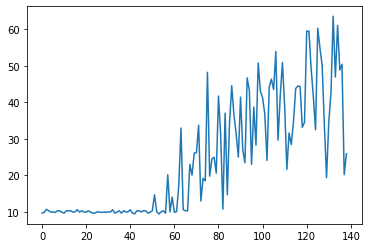

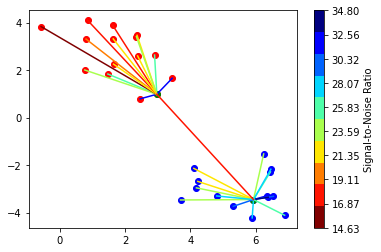

14
14

Power Allocated= 0
CSI= 0.1137936237120073
SNR= 31.18644974186822
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.715413105105969
CSI= 0.5646834665114339
SNR= 21.375943917948224
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.699117
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.006192
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.003860

Power Allocated= 0
CSI= 0.16253123092731103
SNR= 32.19903917617894
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5509024134242009
CSI= 0.340667412093585
SNR= 16.84399442554172
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 1.583245
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.460283549856274
CSI= 0.9746273468452763
SNR= 18.972218206798246
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 0.679934
Model clien

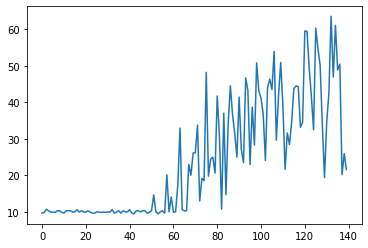

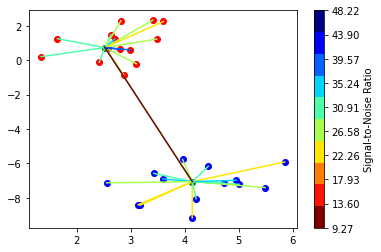

15
14

Power Allocated= 2.854720928654756
CSI= 0.6709336861997073
SNR= 22.813078250430458
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.136840
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.9978152610421676
CSI= 0.7421888705193855
SNR= 22.397783757104584
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.698779
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000006
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.0186538334665736
CSI= 0.7538480017144117
SNR= 22.094436968905878
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.043562
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.002176
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000003

Power Allocated= 3.2331949305974126
CSI= 0.899291684493944
SNR= 29.730603193500542
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.500168
Model client6 Train Ep

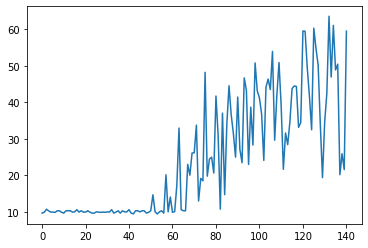

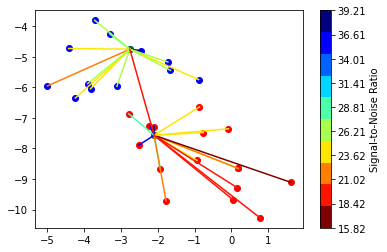

12
16

Power Allocated= 2.7366419877038766
CSI= 0.7849626498091036
SNR= 22.067881832809594
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.072500
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000007
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 2.001461

Power Allocated= 2.7859799854224994
CSI= 0.8165878608777357
SNR= 21.420233184574407
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.009421
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.009436
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.111041

Power Allocated= 1.427845135952452
CSI= 0.3871852798162496
SNR= 21.319813500200382
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.055810
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.016137
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.253959

Power Allocated= 2.167724069904926
CSI= 0.5426336744728647
SNR= 22.574672572427744
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 1.065838
Model client7 Train Ep

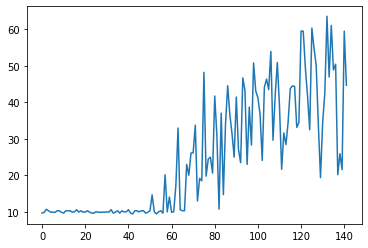

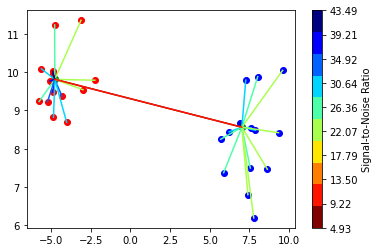

15
14

Power Allocated= 3.1646659674975774
CSI= 0.8776770757299909
SNR= 30.060457149289356
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.520813
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 1.5934787077889583
CSI= 0.36892766111236985
SNR= 41.754653649897065
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 0.874973
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.043300
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.015410

Power Allocated= 2.905748306897176
CSI= 0.7151598030380132
SNR= 22.176490094853314
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 0.473877
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.168193
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.960298

Power Allocated= 2.291176794300729
CSI= 0.49680544348023215
SNR= 35.657758840173706
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 0.948083
Model client6 Train 

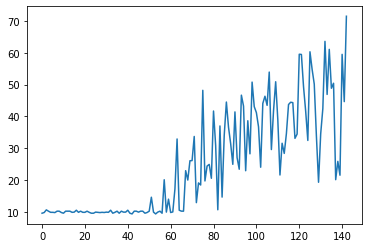

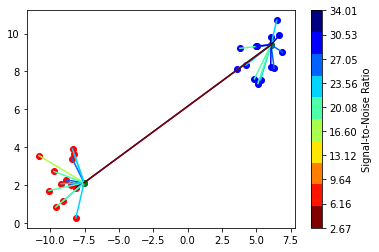

15
14

Power Allocated= 0
CSI= 0.09619677187129994
SNR= 26.983730801418467
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8040986841035518
CSI= 0.2592663902425534
SNR= 21.748792382731448
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 0.531923
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.203899
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.003330

Power Allocated= 0
CSI= 0.13479688975924276
SNR= 21.1051678998085
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.25994918484895
CSI= 0.7136809880441146
SNR= 30.40514393449104
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 0.864445
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000049
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.1825303007476543
SNR= 22.561699492810682
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.134

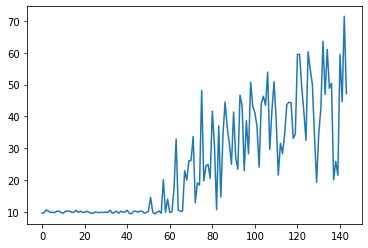

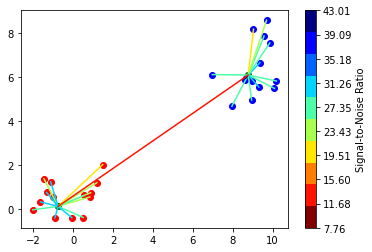

14
14

Power Allocated= 2.8852833343069055
CSI= 0.9317654805464116
SNR= 26.635612826663582
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.965223
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.2561364453914385
CSI= 0.5874134957715557
SNR= 23.70886452827931
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.028426
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.598411
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.436783

Power Allocated= 1.758191645386816
CSI= 0.4544787040447962
SNR= 19.931125470910366
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.559153
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.409144
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.025764

Power Allocated= 2.3243242281012573
CSI= 0.6119237489517713
SNR= 34.919333249751645
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.503217
Model client6 Train Ep

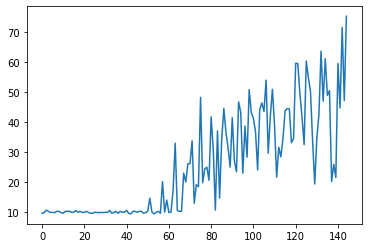

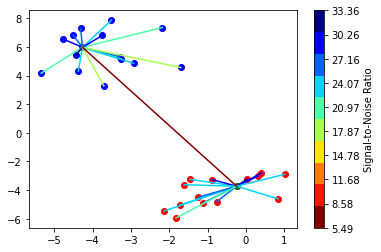

14
14

Power Allocated= 2.3803242868324004
CSI= 0.5654942017803739
SNR= 22.189507297809687
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.213481
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.08900032588274398
SNR= 29.678917655067863
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1472652421024544
SNR= 26.385734316030405
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6677491267784577
CSI= 0.6752468540046599
SNR= 23.531757469588083
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 0.676190
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.09975775066595094
SNR= 25.52284642919857
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0

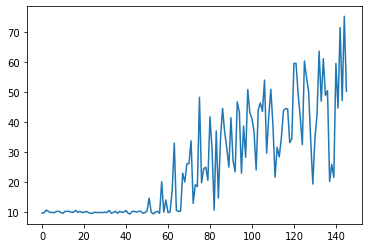

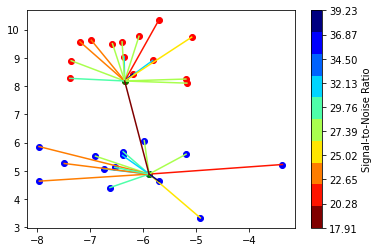

14
14

Power Allocated= 2.469943721122079
CSI= 0.5250695859388541
SNR= 27.71336370692447
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.990667
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.4146042410852635
CSI= 0.510243403627505
SNR= 25.14090375128909
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.127596
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.033030
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.005211

Power Allocated= 0.27097237725311896
CSI= 0.2436955464923719
SNR= 26.257617800719608
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 1.543855
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 3.017968
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.8782477187896816
CSI= 0.6683573994360797
SNR= 21.13862161048965
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 1.787638
Model client8 Train Epoc

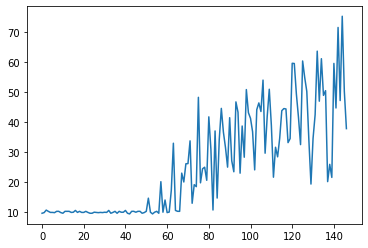

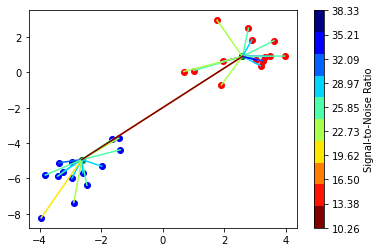

15
14

Power Allocated= 2.9362885941182992
CSI= 0.5237954608631566
SNR= 24.487024052060093
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.545409
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.115720149554179
CSI= 0.5781313906833434
SNR= 38.33229283616429
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.014589
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.016406
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000354

Power Allocated= 3.70249676638882
CSI= 0.8749411660203834
SNR= 10.256685391819552
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3507480536033127
CSI= 0.28614901104311063
SNR= 25.800694286086152
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 0.196184
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000203
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.872077

Power Allocated= 2.4

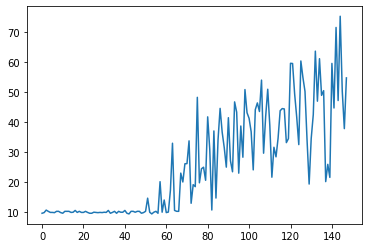

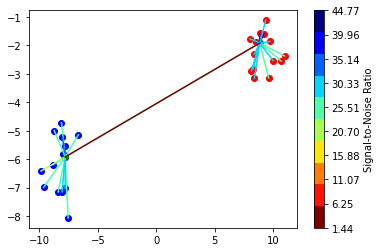

15
14

Power Allocated= 2.1384686978530256
CSI= 0.5067464658461004
SNR= 23.77357864080116
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.461659
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.5070946235283156
CSI= 0.6231510012520086
SNR= 21.46779087840645
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.798752
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.104765
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.275784

Power Allocated= 2.940049274026313
CSI= 0.8533931709960052
SNR= 35.716386302753655
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.245721
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.425481
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000043

Power Allocated= 2.462194430253744
CSI= 0.606190046001191
SNR= 38.35534886533822
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 3.359571
Model client4 Train Epoch:

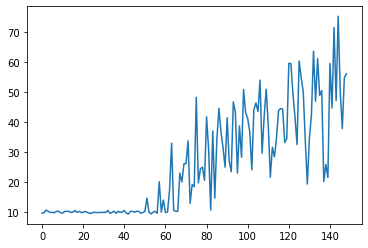

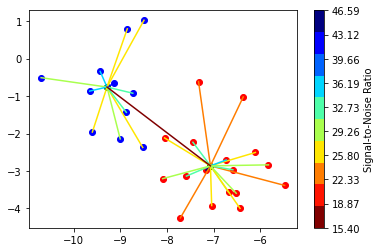

11
17

Power Allocated= 1.4858484184927532
CSI= 0.43776665591471065
SNR= 24.51369072913927
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.294382
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.6806650716373657
CSI= 0.9178477270610872
SNR= 21.95445849602338
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.062474
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.150083
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.499402

Power Allocated= 2.1954272015033025
CSI= 0.6350241699872436
SNR= 29.572656540276498
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 1.229847
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000578
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 1.8009452871664062
CSI= 0.5078139556214591
SNR= 22.130530301519727
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 0.245998
Model client8 Train E

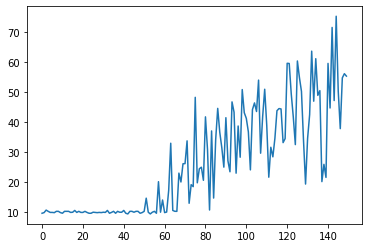

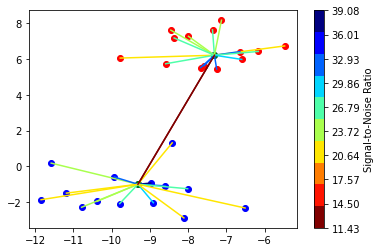

15
14

Power Allocated= 3.208942947025028
CSI= 0.9137816176560766
SNR= 11.425383475963992
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.23071095363126026
SNR= 24.692530729691292
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.101713480013302
CSI= 0.8322355834093483
SNR= 39.079057054655436
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 1.425794
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.006489
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000340

Power Allocated= 2.907047589067533
CSI= 0.7162047665831083
SNR= 19.37047993903559
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 1.098227
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 0.416507
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 0.480633

Power Allocated= 2.8499328464898848
CSI= 0.6880591227152548
SNR= 30.34599304102351
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Lo

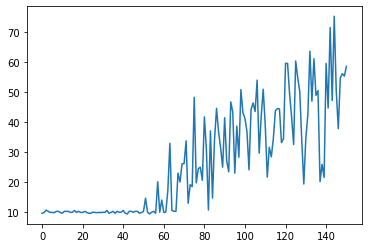

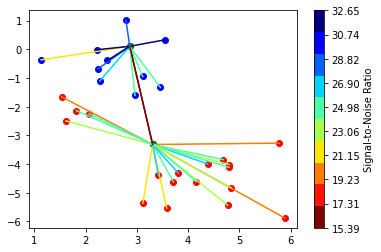

11
18

Power Allocated= 2.4693552209187706
CSI= 0.38750081568106565
SNR= 15.391097962529665
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04653191232513176
SNR= 25.687824412744305
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.24724867996434785
CSI= 0.2082142057426386
SNR= 24.415767059441425
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 1.615713
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 0.217274
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.3335122302057902
CSI= 0.5825866980570562
SNR= 22.364385609674134
Client: client12
Model client12 Train Epoch: 1 [0/320 (0%)]	Loss: 1.872083
Model client12 Train Epoch: 2 [0/320 (0%)]	Loss: 0.029341
Model client12 Train Epoch: 3 [0/320 (0%)]	Loss: 0.012776

Power Allocated= 0
CSI= 0.00027311136826813076
SNR= 19.19407701351158
Client: client13
Poor Channel, client not taken for averaging in 

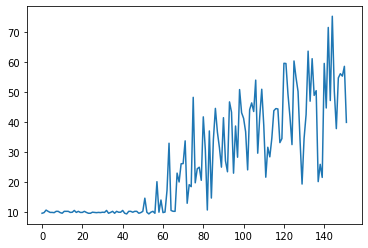

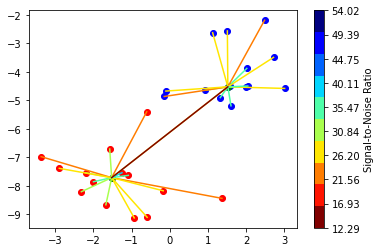

15
14

Power Allocated= 0
CSI= 0.1425650174555294
SNR= 31.160653638095084
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4047785113295514
CSI= 0.537535762542112
SNR= 26.915021947868624
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 2.803028
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 0.135461
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000013

Power Allocated= 2.9734502325494336
CSI= 0.7741917798420996
SNR= 12.28973910698546
Client: client12
Model client12 Train Epoch: 1 [0/320 (0%)]	Loss: 1.916849
Model client12 Train Epoch: 2 [0/320 (0%)]	Loss: 0.246865
Model client12 Train Epoch: 3 [0/320 (0%)]	Loss: 0.086667

Power Allocated= 3.069304348073326
CSI= 0.8362494034397574
SNR= 33.5869548516311
Client: client15
Model client15 Train Epoch: 1 [0/320 (0%)]	Loss: 1.583591
Model client15 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000075
Model client15 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.0

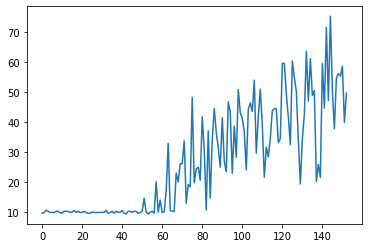

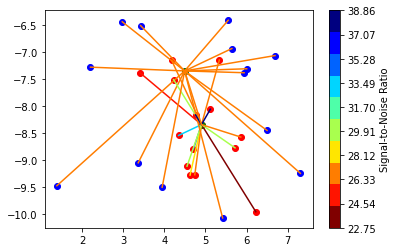

14
14

Power Allocated= 2.889257969576783
CSI= 0.7335864190634604
SNR= 24.520036828676602
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.541972
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.2333349773513698
CSI= 0.9812686565600196
SNR= 22.746316467991083
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 0.337142
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.200797
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.359817

Power Allocated= 3.1757520044264917
CSI= 0.9287880747969086
SNR= 24.520036828676602
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 0.996019
Model client11 Train Epoch: 2 [0/320 (0%)]	Loss: 0.003108
Model client11 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.8764510132551866
CSI= 0.7267585160988655
SNR= 33.77551018006616
Client: client12
Model client12 Train Epoch: 1 [0/320 (0%)]	Loss: 2.716561
Model client12 T

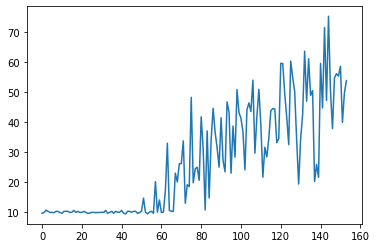

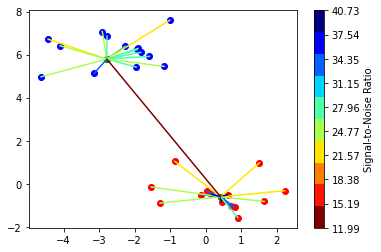

14
14

Power Allocated= 1.8045323763821015
CSI= 0.3641811439135102
SNR= 25.958892939354755
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.303977
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 1.4394706605348793
CSI= 0.3214454266282004
SNR= 33.76190121978798
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 3.120115
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.732910
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.9067544581943934
CSI= 0.6083967832193454
SNR= 21.397078064713252
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.797057
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000094
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.3067307546913494
CSI= 0.44569478990801503
SNR= 21.955433899898665
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 0.976355
Model client5 Train 

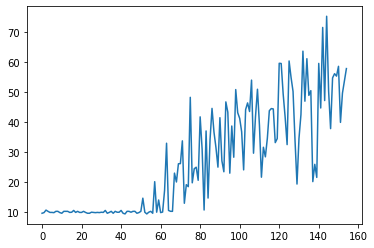

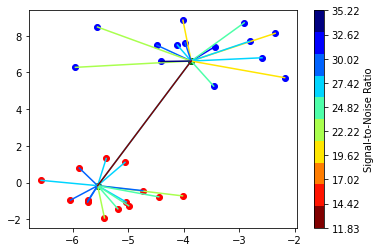

15
14

Power Allocated= 3.0211541415198173
CSI= 0.8440472495079044
SNR= 19.132786426531645
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 0.554023
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.2048742797780743
CSI= 0.9989534381280323
SNR= 29.518297715776423
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.389949
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.560017
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 3.145501

Power Allocated= 2.8796472864330207
CSI= 0.7539916402316749
SNR= 18.220037190487346
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 0.697822
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000174
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 1.3123157363437783
CSI= 0.34558952748883764
SNR= 20.43228467771307
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.229221
Model client5 Train 

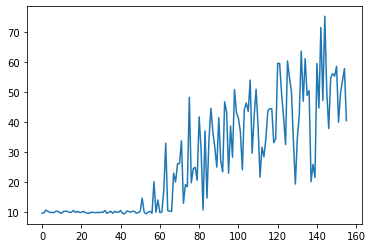

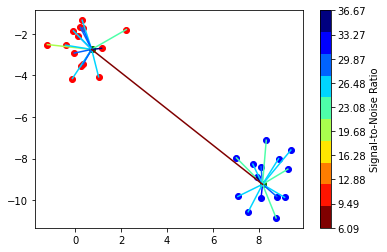

14
14

Power Allocated= 1.6098445756876494
CSI= 0.3641746078094198
SNR= 22.678976771683445
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.347482
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.03074533343823671
SNR= 6.087513053333058
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2851901158708183
CSI= 0.48295413283149435
SNR= 36.669378514413594
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.378169
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.133769
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.041145

Power Allocated= 2.9697371916396236
CSI= 0.7214783751497915
SNR= 28.88890834932821
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.112532
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000005
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.13155939

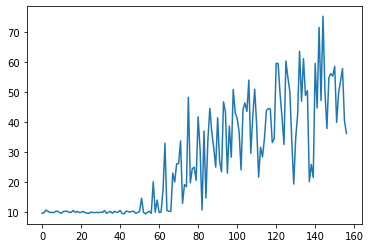

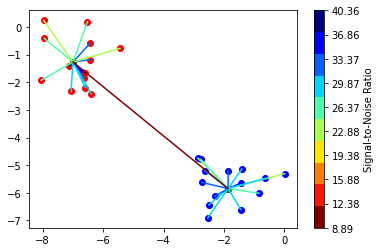

14
14

Power Allocated= 2.440265998692329
CSI= 0.554035981981933
SNR= 32.704215777400485
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.224743
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.369141
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.048207

Power Allocated= 1.1816806177464092
CSI= 0.32642164838684706
SNR= 8.887542998145292
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.624504
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000289
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.14371817402369236
SNR= 28.84553259208022
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6167115835812043
CSI= 0.6140652868127697
SNR= 22.304480076639543
Client: client12
Model client12 Train Epoch: 1 [0/320 (0%)]	Loss: 2.486874
Model client12 Train Epoch: 2 [0/320 (0%)]	Loss: 0.176247
Model client12 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000117

Power Allocated= 2.7075852090769

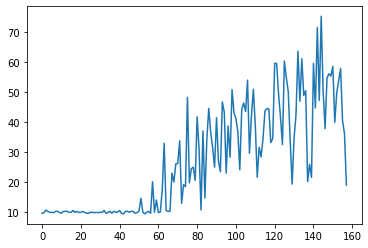

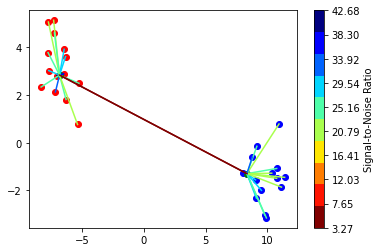

15
14

Power Allocated= 1.1483693616872777
CSI= 0.35807992034587477
SNR= 21.017778809392226
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.028182
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.265997
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.897706159572312
CSI= 0.9584641399454116
SNR= 18.670477673460773
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.356920
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.006574
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000002

Power Allocated= 0
CSI= 0.14559431501743791
SNR= 23.542398698843904
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.045865952851843916
SNR= 30.20266969311987
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8456816974982457
CSI= 0.9129416021465052
SNR= 18.2541362305758
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 2.909996
Mode

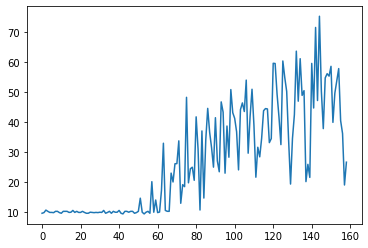

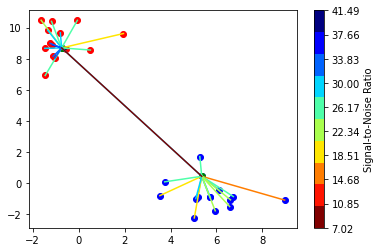

15
14

Power Allocated= 2.1808283857434776
CSI= 0.5814169274812822
SNR= 18.448096692763798
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.342237
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.105973
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.081749

Power Allocated= 2.343324533294874
CSI= 0.6420793028103318
SNR= 30.00998392628724
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.059410
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.030968
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.003663

Power Allocated= 2.4455784015343225
CSI= 0.6871973054141508
SNR= 26.640540835249816
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.005333
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.038329
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 1.2389175750019366
CSI= 0.3756789963691568
SNR= 23.780761478484358
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.563628
Model client8 Train Ep

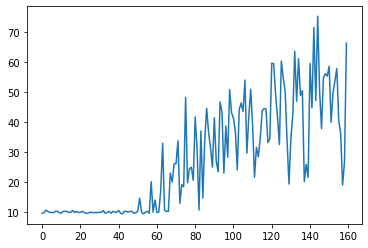

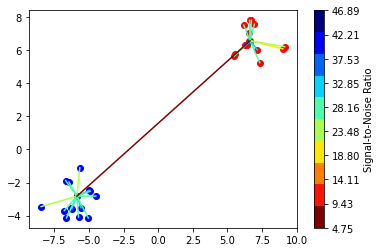

14
14

Power Allocated= 3.183760516074131
CSI= 0.7557549763196719
SNR= 25.56558026499697
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.174453
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000473
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.6081861043377543
CSI= 0.5266610062492378
SNR= 29.33166802820073
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 0.791233
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.108697
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.013962

Power Allocated= 3.4431255701928523
CSI= 0.9400129615003231
SNR= 28.59659087737422
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 1.490090
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.007381
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.047792

Power Allocated= 0.2841363893810662
CSI= 0.23680945862694458
SNR= 36.883691571335525
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 0.300472
Model client11 Train 

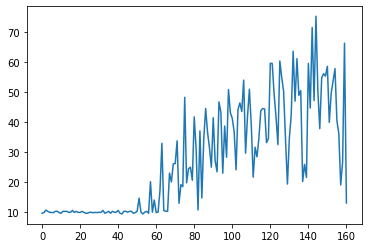

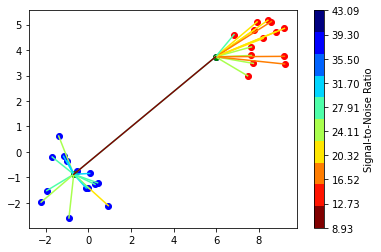

15
14

Power Allocated= 0.46676095686941554
CSI= 0.23636632017391368
SNR= 25.273106983547656
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.489175
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.03948113492862404
SNR= 20.88770957629857
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4384168681127436
CSI= 0.794239992738127
SNR= 8.932743400799346
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.034325437763154
SNR= 15.822703159857895
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19185477711725896
SNR= 26.84975413532041
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1528307124627215
CSI= 0.6473952478715244
SNR= 43.09067862278956
Client: client12
Model client12 Train Epoch: 1 [0

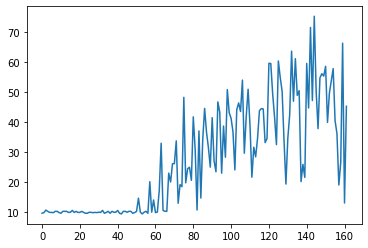

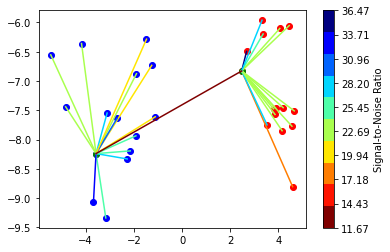

14
14

Power Allocated= 2.1790754639495455
CSI= 0.5858799781974668
SNR= 22.50114744652887
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.796373
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.674952
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.236237

Power Allocated= 2.7402345502125796
CSI= 0.8728477768243791
SNR= 11.672159608896512
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.542970624486496
CSI= 0.744635422852275
SNR= 24.323763297701944
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.960917
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.001879
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000074

Power Allocated= 2.883216919856843
CSI= 0.9973144599437233
SNR= 22.229833028664395
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 1.651467
Model client11 Train Epoch: 2 [0/320 (0%)]	Loss: 0.099959
Model client11 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 

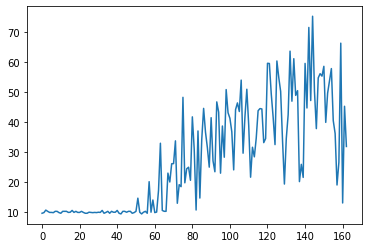

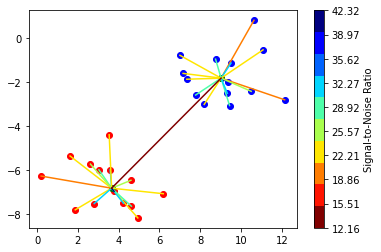

14
14

Power Allocated= 1.944328676901398
CSI= 0.4152756642984554
SNR= 26.167448387003986
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.765199
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.1903690244943811
SNR= 21.981061629607666
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7298254873718562
CSI= 0.3813094026673134
SNR= 26.35373183358545
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.578948
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.042008
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.043644575823807
CSI= 0.7641035683398357
SNR= 30.314581036463863
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 2.199034
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 0.137229
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.1587894

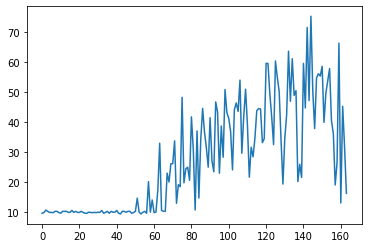

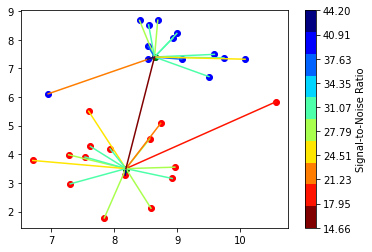

13
15

Power Allocated= 3.941618201450831
CSI= 0.9629630173370907
SNR= 26.361442654339523
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.589974
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.023169
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.16693261483474464
SNR= 28.901659568307696
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.302919251589325
CSI= 0.5962458822065728
SNR= 28.03385403433976
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.317695
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.200928
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.202697

Power Allocated= 3.8458422630184526
CSI= 0.8816496298781533
SNR= 24.719436904502626
Client: client13
Model client13 Train Epoch: 1 [0/320 (0%)]	Loss: 1.845446
Model client13 Train Epoch: 2 [0/320 (0%)]	Loss: 1.335616
Model client13 Train Epoch: 3 [0/320 (0%)]	Loss: 1.495258

Power Allocated= 0
CSI= 0.077247

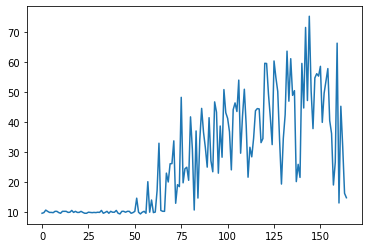

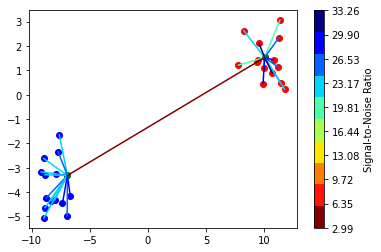

14
14

Power Allocated= 2.853157425829786
CSI= 0.6929462316123156
SNR= 24.009680532290623
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.623347
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.004868
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.04072430127101667
SNR= 22.082194644965945
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.076663188604271
CSI= 0.819935822299831
SNR= 25.457497097979562
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 3.365561
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.144389
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.0367922896015678
CSI= 0.7939793830818904
SNR= 26.731512766870967
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 3.063255
Model client11 Train Epoch: 2 [0/320 (0%)]	Loss: 0.015040
Model client11 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.7126936959146

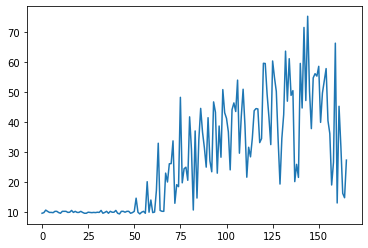

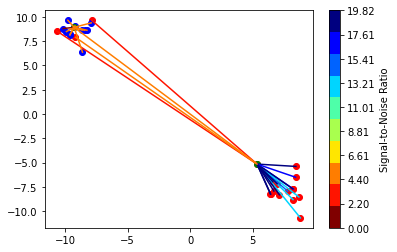

11
17

Power Allocated= 2.6682835023001505
CSI= 0.8315425051890375
SNR= 0.45553487742519483
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.749704912576437
CSI= 0.8919310190289537
SNR= 11.993794332715344
Client: client13
Model client13 Train Epoch: 1 [0/320 (0%)]	Loss: 1.980181
Model client13 Train Epoch: 2 [0/320 (0%)]	Loss: 1.600250
Model client13 Train Epoch: 3 [0/320 (0%)]	Loss: 2.091695

Power Allocated= 2.0686796502536575
CSI= 0.5548810057313269
SNR= 0.45553487742519483
Client: client14
Model client14 Train Epoch: 1 [0/320 (0%)]	Loss: 2.368184
Model client14 Train Epoch: 2 [0/320 (0%)]	Loss: 0.329757
Model client14 Train Epoch: 3 [0/320 (0%)]	Loss: 0.397456

Power Allocated= 2.3728537199763036
CSI= 0.6675504462280708
SNR= 14.424546891998265
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5109989939135877
CSI= 0.42375236150347695
SNR= 1.2406187392783763
Client: client16
Poor Channel, cl

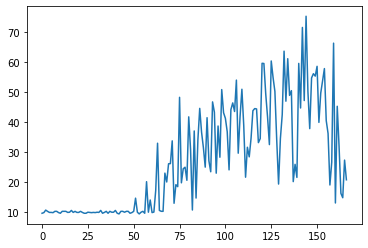

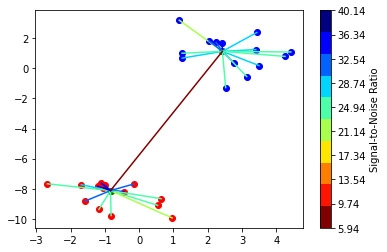

14
14

Power Allocated= 2.993796395595064
CSI= 0.7805369035100941
SNR= 22.221352417909028
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.177490
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.003768
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.116250437969081
CSI= 0.4632384692589826
SNR= 26.155620097572864
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.327975
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.110299
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.331163

Power Allocated= 1.6827997691683727
CSI= 0.3857777580602958
SNR= 21.580683116477513
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.921083
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.004420
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000007

Power Allocated= 3.1184220516457435
CSI= 0.8646451992724316
SNR= 25.02485624081049
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.054870
Model client5 Train Epo

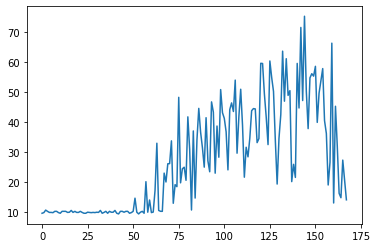

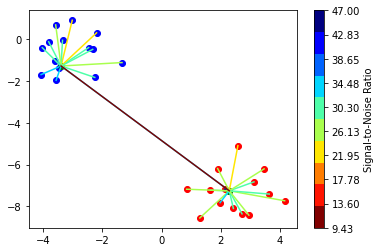

15
14

Power Allocated= 1.2857606695904105
CSI= 0.34623515789905857
SNR= 26.534049821773916
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.184389
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 3.198196
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 3.101585

Power Allocated= 2.697855029918185
CSI= 0.6774534939002422
SNR= 43.100136906101156
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.189546
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.127728
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.044736

Power Allocated= 2.793663639745092
CSI= 0.7244762613515997
SNR= 27.51644375511361
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.379753
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.492378
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.504085

Power Allocated= 2.7505335140680485
CSI= 0.7025246477669383
SNR= 24.449580155111565
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.348209
Model client7 Train Ep

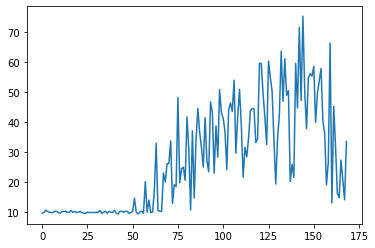

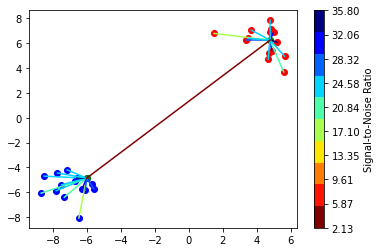

14
14

Power Allocated= 0
CSI= 0.15500701490290125
SNR= 31.19327159575927
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.440215422996853
CSI= 0.8112393820435494
SNR= 23.99067132048952
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.204594
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000020
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.06418822025436866
SNR= 16.017970837612477
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8907091698885923
CSI= 0.35942933781635455
SNR= 28.52209922163878
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.106878
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 2.012763
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 7.244660

Power Allocated= 2.4757490667491138
CSI= 0.45513544879729284
SNR= 20.31328957098625
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.620907
Model c

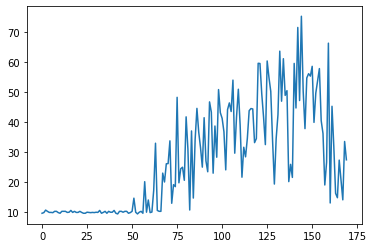

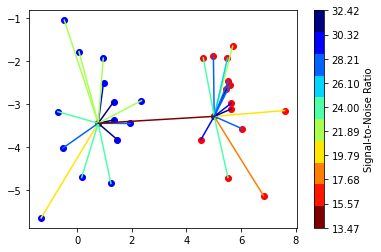

14
14

Power Allocated= 0
CSI= 0.03317144852792586
SNR= 32.0730739519244
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.009093326261044643
SNR= 17.22059698325811
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.033216317318868316
SNR= 21.148123322997396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3023103429743759
CSI= 0.28381043072927337
SNR= 26.380877752548784
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 2.120972
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 0.254716
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 0.089395

Power Allocated= 0
CSI= 0.10482917412128612
SNR= 31.978505891806517
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.503005602972043
CSI= 0.4305179700242493
SNR= 27.921141056980986
Client: client17
Model client17 Train Epoch: 1 [0/320 (0%

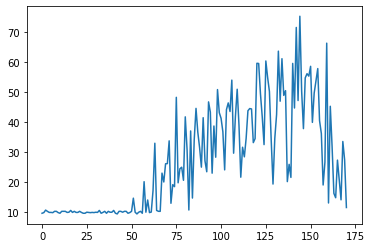

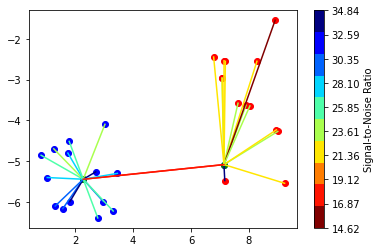

15
14

Power Allocated= 3.308124684599459
CSI= 0.9955689362424924
SNR= 14.944613492225256
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0981645912926226
CSI= 0.8234445338679803
SNR= 20.255933114408826
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.317712
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000168
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.2299109512105106
CSI= 0.9236471525384012
SNR= 24.896467797720224
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.436779
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 8.096730
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.269584

Power Allocated= 2.873280468769056
CSI= 0.6947845987760091
SNR= 28.173982107994473
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 1.898609
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.137966
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.155593

Power Allocated= 3.

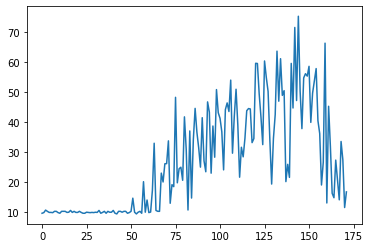

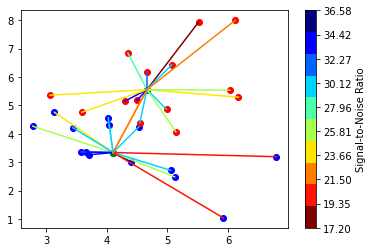

15
14

Power Allocated= 2.203996145750636
CSI= 0.43931122118171284
SNR= 17.196297202492524
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.621436
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.201207
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.12405645266120247
SNR= 36.57703681322319
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.422094187693312
CSI= 0.945007597509411
SNR= 33.107975272026245
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.339849
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.057926
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.978665805519144
CSI= 0.6659470297298637
SNR= 22.57362655706549
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.311743
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000006
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 3.4759086443030744
CS

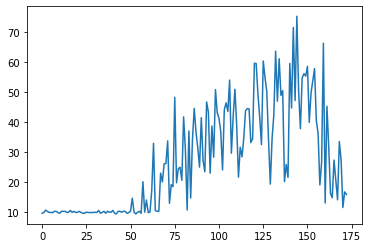

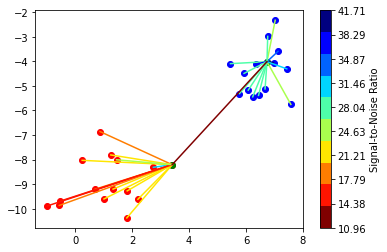

14
14

Power Allocated= 3.3595451261299267
CSI= 0.6163254346711616
SNR= 29.91694138462359
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.450444
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.122657
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.001654

Power Allocated= 2.0503363449091667
CSI= 0.34109573741347976
SNR= 18.707651804212123
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.339362
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.616677
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.458161

Power Allocated= 1.4967757463083955
CSI= 0.28692026723963937
SNR= 25.064893103741777
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.030118
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 1.0567350107768383
CSI= 0.25475567988239234
SNR= 17.691023452734107
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.076295
Model client9 Trai

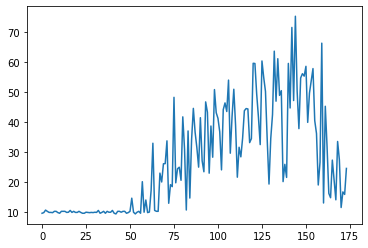

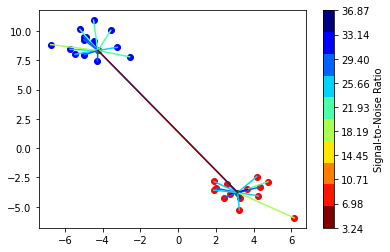

15
14

Power Allocated= 3.629701354346463
CSI= 0.9518081584186593
SNR= 30.698618000802
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.331677
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.661979
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.9449030373782406
CSI= 0.5762259978226536
SNR= 28.275923886476388
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.475433
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.182766
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 0.037445

Power Allocated= 2.8585431241418906
CSI= 0.5489106519160203
SNR= 26.283176566653502
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.820866
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.217289
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 0.085630

Power Allocated= 2.9642343230505857
CSI= 0.5827169927574416
SNR= 24.008040136349095
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.907836
Model client8 Train Epoc

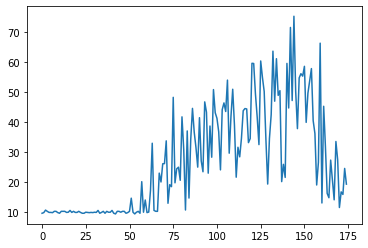

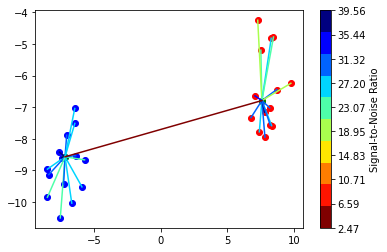

14
14

Power Allocated= 2.4744202259503605
CSI= 0.5522407855209103
SNR= 27.798946057559696
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.382361
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.217106
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.301972083134018
CSI= 0.504222240406334
SNR= 22.068963697817622
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.436749
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.001214
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 2195.239014

Power Allocated= 0
CSI= 0.16897153763648287
SNR= 25.961258324310208
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8682454968311566
CSI= 0.7057267365747275
SNR= 18.512507794450826
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 2.885249
Model client11 Train Epoch: 2 [0/320 (0%)]	Loss: 1.538203
Model client11 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.0

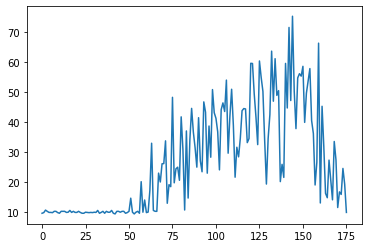

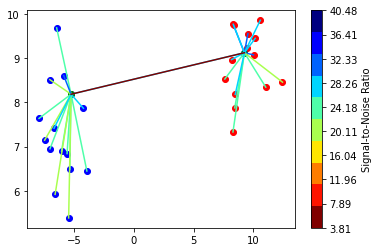

15
14

Power Allocated= 2.138648845846751
CSI= 0.49724696167027005
SNR= 23.75868337655262
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.842366
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 2.636113
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 4.205654

Power Allocated= 0
CSI= 0.18339919788504933
SNR= 40.48472250982434
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8703574451662694
CSI= 0.3049371281678125
SNR= 22.495531218794316
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.445218
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 2.672518
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 3.701450

Power Allocated= 3.0604953440067284
CSI= 0.918082589421814
SNR= 31.768955750842583
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.328171
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 3.840150
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 3.293656

Power Allocated= 2.259340712764206
C

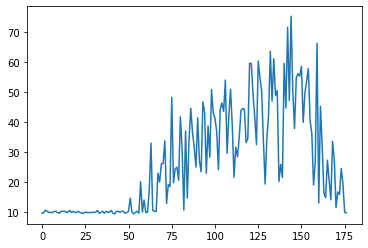

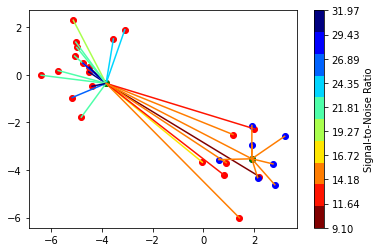

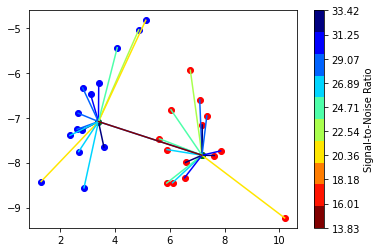

15
14

Power Allocated= 1.9111233357311068
CSI= 0.41770647341183376
SNR= 30.065488792211372
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.400758
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.926875
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 4.945316

Power Allocated= 1.0745766236452443
CSI= 0.30954267431747207
SNR= 24.50079409484132
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.424760
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.713390
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 4.418898

Power Allocated= 0.0335930539090219
CSI= 0.2341067335689393
SNR= 32.9677864453975
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.615987
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.493836
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 2.109807

Power Allocated= 2.9678031713281445
CSI= 0.7477497666278021
SNR= 26.18976858713653
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.440347
Model client7 Train Ep

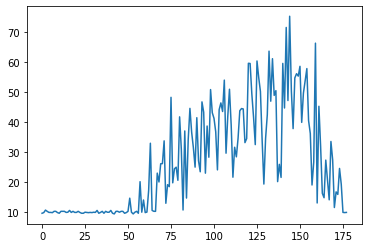

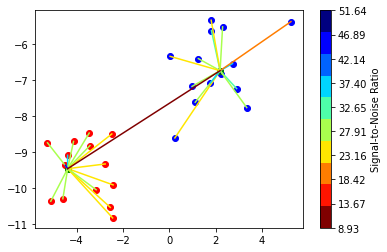

14
14

Power Allocated= 3.038282492768319
CSI= 0.4493514669299664
SNR= 18.95002243342826
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 3.141976
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 4.212216
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 10.286107

Power Allocated= 0
CSI= 0.18491518764247517
SNR= 8.92818469363694
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1380834471830985
SNR= 26.6646030330869
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1340760810081234
SNR= 21.502638605336077
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9077062904419617
CSI= 0.42444719416928334
SNR= 19.645577629243473
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 2.784825
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 2.283630
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 3.319579

Power Allocated= 3.

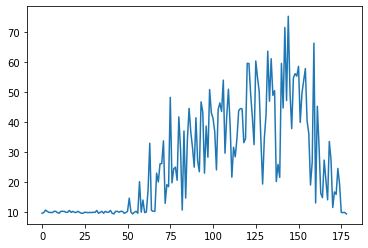

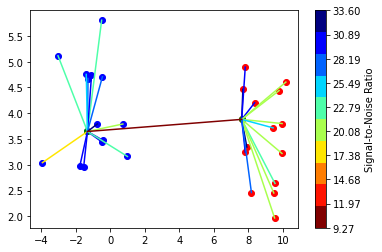

14
14

Power Allocated= 0.1394228487888709
CSI= 0.2172467731207467
SNR= 33.15629270384052
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.201861
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.305667
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.206816

Power Allocated= 0
CSI= 0.17910035077177366
SNR= 18.836383732900636
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1841731351114686
CSI= 0.3908830394422903
SNR= 19.02545225946765
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 3.263515
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 1.461513
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 1.873726

Power Allocated= 3.590950759826686
CSI= 0.8684080415063503
SNR= 18.262507701877755
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.404761841887037
CSI= 0.7475398525322876
SNR= 18.922193139162083
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss:

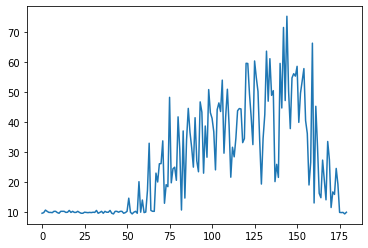

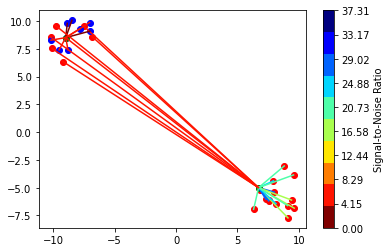

8
20

Power Allocated= 3.2737768623109824
CSI= 0.9209789637103368
SNR= 2.513222540718341
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.252468331739362
CSI= 0.903252889145744
SNR= 22.36176931547277
Client: client13
Model client13 Train Epoch: 1 [0/320 (0%)]	Loss: 2.163821
Model client13 Train Epoch: 2 [0/320 (0%)]	Loss: 1.141209
Model client13 Train Epoch: 3 [0/320 (0%)]	Loss: 1.115855

Power Allocated= 2.230049382800174
CSI= 0.4695874924057789
SNR= 0.5066801024483021
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.258989563195601
CSI= 0.47605708280711745
SNR= 25.47424446330063
Client: client20
Model client20 Train Epoch: 1 [0/320 (0%)]	Loss: 1.725834
Model client20 Train Epoch: 2 [0/320 (0%)]	Loss: 0.705166
Model client20 Train Epoch: 3 [0/320 (0%)]	Loss: 1.740904

Power Allocated= 0.7432121526245261
CSI= 0.27652069624058073
SNR= 23.450247703100583
Client: client22
Model client22 Train Epoc

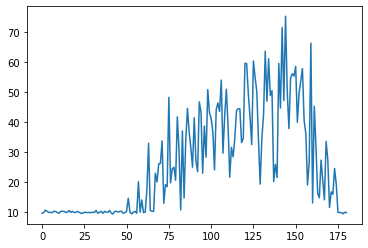

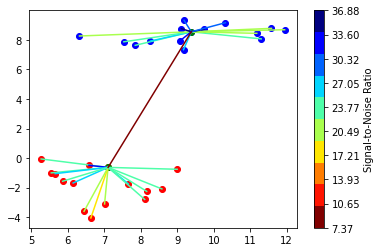

14
14

Power Allocated= 0.14118440096180596
CSI= 0.23942892040703456
SNR= 23.322717611514822
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.476655
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.945380
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 3.495267

Power Allocated= 0.7330136544300516
CSI= 0.2789574860842675
SNR= 24.59471930996618
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.310810
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.247455
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.139537

Power Allocated= 3.2478853577297597
CSI= 0.9346633544173681
SNR= 23.916761100874965
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.695185
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.070519
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 1.0063683450342689
CSI= 0.30198516469240755
SNR= 24.920629260085
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.144307
Model client7 Train E

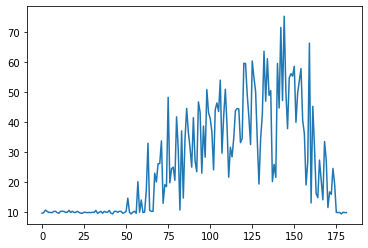

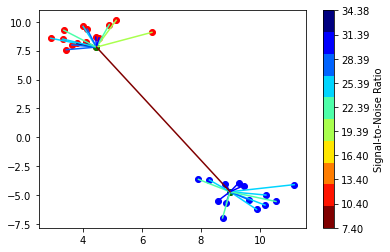

14
14

Power Allocated= 2.2625320693730187
CSI= 0.43661016700335165
SNR= 24.4195178988545
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.212556
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.895424
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 0.935013

Power Allocated= 2.609680987226863
CSI= 0.5146087740864254
SNR= 25.377258041535917
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.293397
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.723952
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 2.259549

Power Allocated= 0
CSI= 0.10370773527761146
SNR= 22.129542970695173
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20898763823636357
SNR= 26.9951865042077
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.02898309103769592
SNR= 18.809339475601277
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.03

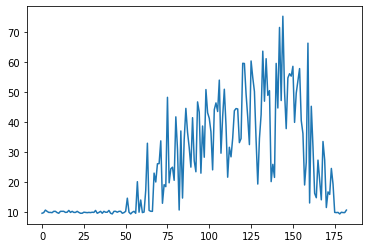

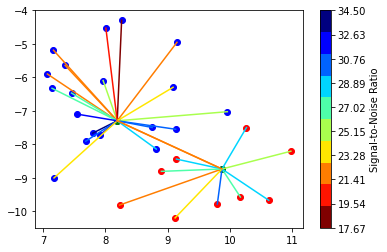

20
9

Power Allocated= 3.2473380547199273
CSI= 0.9996107404956512
SNR= 34.50303194500302
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.342276
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 2.101039
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 3.629880

Power Allocated= 2.7420407235664452
CSI= 0.664148771418709
SNR= 17.666754516850123
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.062136
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.838041
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 3.585924

Power Allocated= 0
CSI= 0.19823317939577823
SNR= 21.406007995013436
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.08396405573796972
CSI= 0.24016734418241192
SNR= 20.965946941797093
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.241475
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.812952
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 0.635200

Power Allocated= 2.912570925258989

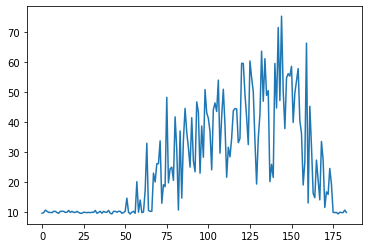

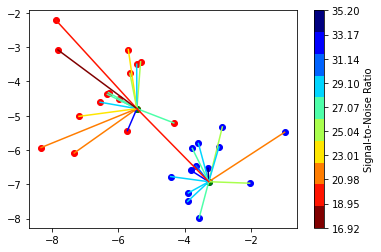

13
15

Power Allocated= 0
CSI= 0.027045905565160733
SNR= 27.41442390103334
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7355573727313596
CSI= 0.35843385200922195
SNR= 29.365948566540467
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.972773
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.519451
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 3.085786

Power Allocated= 3.858946641820135
CSI= 0.6000507213012649
SNR= 20.488924045067808
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.247605
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.837143
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 4.059496

Power Allocated= 4.43596672359985
CSI= 0.9178474202198471
SNR= 25.82443684998845
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.855015
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 1.458051
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 2.170552

Power Allocated= 2.7254618698507658


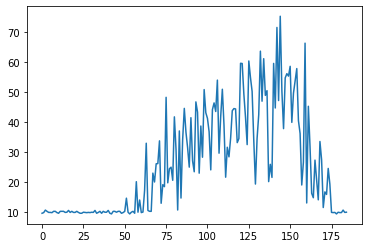

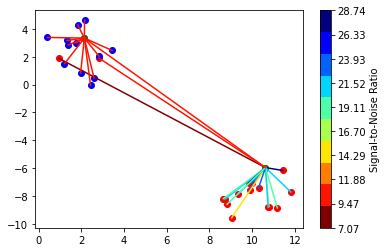

12
16

Power Allocated= 0
CSI= 0.01892608245596672
SNR= 7.065009950293264
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.388156643155952
CSI= 0.963943311738984
SNR= 16.415758325715046
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.271353
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 3.853324
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 0.620999

Power Allocated= 0.849830449042178
CSI= 0.27966304874348713
SNR= 7.065009950293264
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 5.112654
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 20.316360
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 57.984947

Power Allocated= 2.096149890277627
CSI= 0.4292928571614789
SNR= 23.116113945851
Client: client14
Model client14 Train Epoch: 1 [0/320 (0%)]	Loss: 2.046864
Model client14 Train Epoch: 2 [0/320 (0%)]	Loss: 1.519204
Model client14 Train Epoch: 3 [0/320 (0%)]	Loss: 2.519886

Power Allocated= 3.0735858268059992

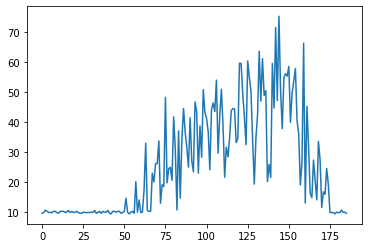

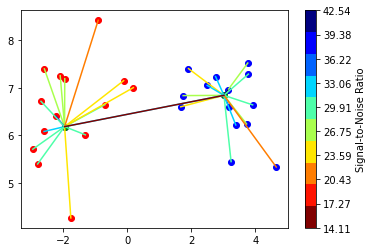

15
14

Power Allocated= 2.7766599042766136
CSI= 0.6695414163849803
SNR= 25.594451183545107
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.994411
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.243940
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 2.819040

Power Allocated= 2.7878530413261373
CSI= 0.6745970278663809
SNR= 37.61383495554763
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.007885
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.532217
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 2.409825

Power Allocated= 2.3982786795844095
CSI= 0.5342049250806412
SNR= 32.185569730628536
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.624895
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 0.882063
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 3.902750

Power Allocated= 2.1648110527514257
CSI= 0.47496722376954625
SNR= 24.82208545203984
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.300261
Model client9 Train E

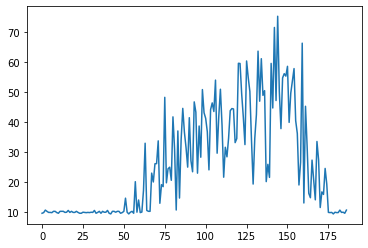

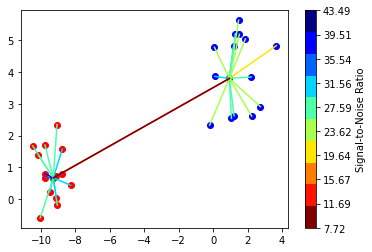

15
14

Power Allocated= 1.3862376715227995
CSI= 0.2804090469436854
SNR= 21.327886453447885
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.298928
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.823303
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 2.272619

Power Allocated= 2.8502642853216273
CSI= 0.4756939122131232
SNR= 22.454067843489444
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.125132
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.166566
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 1.391974

Power Allocated= 3.5220930863029563
CSI= 0.6991230672455978
SNR= 27.838784758162234
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.300260
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.303824
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.944333

Power Allocated= 3.024912963428295
CSI= 0.5187950483964984
SNR= 26.704989663769375
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.292816
Model client6 Train E

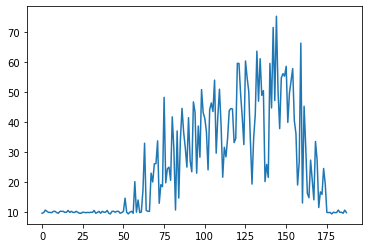

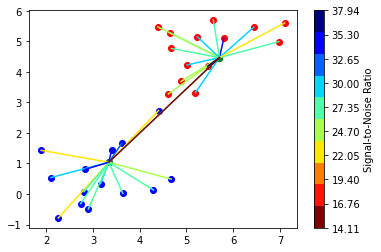

15
14

Power Allocated= 0
CSI= 0.055086369519240175
SNR= 26.607280755964915
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3357566889776598
CSI= 0.8731084341038028
SNR= 14.107700916293437
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7360762233766094
CSI= 0.5730614436473388
SNR= 24.885502678476684
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.213699
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.171789
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 1.240492

Power Allocated= 0
CSI= 0.1509300762531045
SNR= 20.75743758853723
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5314380546597994
CSI= 0.25318687930308825
SNR= 26.41226444796913
Client: client13
Model client13 Train Epoch: 1 [0/320 (0%)]	Loss: 2.392401
Model client13 Train Epoch: 2 [0/320 (0%)]	Loss: 1.248827
Model client13 Train Epoch: 3 [0/320 (0%)]	Loss: 1.534202

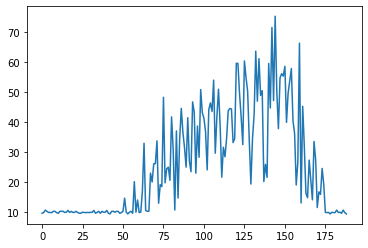

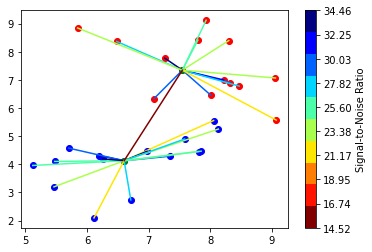

15
13

Power Allocated= 2.8733533917177088
CSI= 0.6809985302465722
SNR= 24.408970565237546
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.280983
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.809227
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 3.842587

Power Allocated= 2.3489971403885965
CSI= 0.5018094743458353
SNR= 21.028581111846364
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.229893
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.129640
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.147953

Power Allocated= 2.359632935796902
CSI= 0.5045020740097315
SNR= 32.84718281716344
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.587250
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.145055
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 1.146090

Power Allocated= 0
CSI= 0.1606148732510192
SNR= 22.87336925704868
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4985792128932447
C

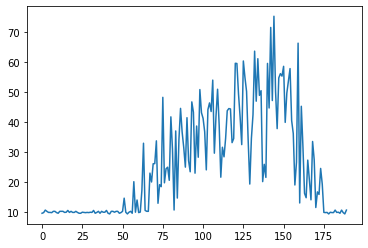

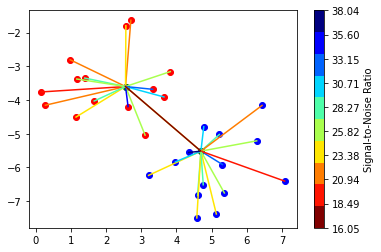

15
14

Power Allocated= 0
CSI= 0.06939762742680322
SNR= 20.289766015772557
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18906332839025974
SNR= 25.59045108323952
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1237301050123145
CSI= 0.7941808176066106
SNR= 19.90825004975816
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.491959
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.693092
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 1.825266

Power Allocated= 3.0844879225346524
CSI= 0.7701779233610501
SNR= 18.360304149158562
Client: client12
Model client12 Train Epoch: 1 [0/320 (0%)]	Loss: 2.191164
Model client12 Train Epoch: 2 [0/320 (0%)]	Loss: 1.230474
Model client12 Train Epoch: 3 [0/320 (0%)]	Loss: 1.197720

Power Allocated= 1.5451921409015004
CSI= 0.3523984340033248
SNR= 30.968477956007117
Client: client13
Model client13 Train Epoch: 1 [0/320 (0%)]	Loss: 2.311174


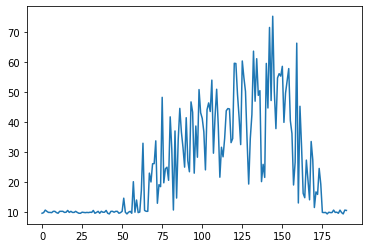

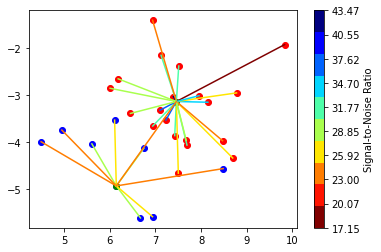

8
20

Power Allocated= 2.2844158015991094
CSI= 0.4701259844227029
SNR= 31.432844969132763
Client: client11
Model client11 Train Epoch: 1 [0/320 (0%)]	Loss: 2.521446
Model client11 Train Epoch: 2 [0/320 (0%)]	Loss: 0.677414
Model client11 Train Epoch: 3 [0/320 (0%)]	Loss: 1.275369

Power Allocated= 3.3225530933212175
CSI= 0.9183140275368823
SNR= 25.155078450096813
Client: client17
Model client17 Train Epoch: 1 [0/320 (0%)]	Loss: 2.504590
Model client17 Train Epoch: 2 [0/320 (0%)]	Loss: 1.227761
Model client17 Train Epoch: 3 [0/320 (0%)]	Loss: 1.238759

Power Allocated= 2.9003253620901654
CSI= 0.6617346071086624
SNR= 22.779620599817306
Client: client18
Model client18 Train Epoch: 1 [0/320 (0%)]	Loss: 2.421031
Model client18 Train Epoch: 2 [0/320 (0%)]	Loss: 1.593052
Model client18 Train Epoch: 3 [0/320 (0%)]	Loss: 1.524831

Power Allocated= 0
CSI= 0.06828627653404207
SNR= 31.323218696923806
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.60

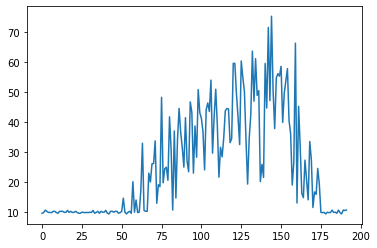

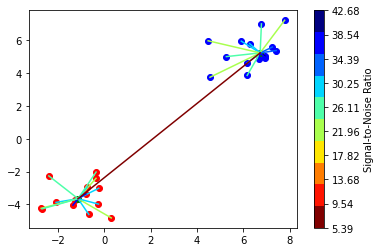

14
14

Power Allocated= 0.7680229385867223
CSI= 0.2304556678410803
SNR= 24.8049390735003
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.509364
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.777929
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 2.176903

Power Allocated= 0
CSI= 0.0997151979874682
SNR= 42.67876757741459
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.019831075838915635
SNR= 27.836484976600165
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5574384355820676
CSI= 0.39218549033546724
SNR= 27.330437771002103
Client: client9
Model client9 Train Epoch: 1 [0/320 (0%)]	Loss: 2.864240
Model client9 Train Epoch: 2 [0/320 (0%)]	Loss: 0.881510
Model client9 Train Epoch: 3 [0/320 (0%)]	Loss: 1.915297

Power Allocated= 4.048668502382739
CSI= 0.9446583292612325
SNR= 21.812158970996247
Client: client10
Poor Channel, client not taken for averaging in this round

Pow

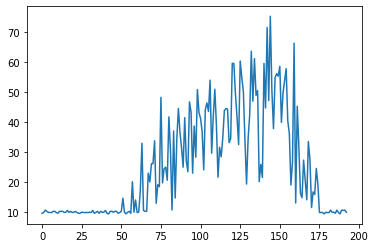

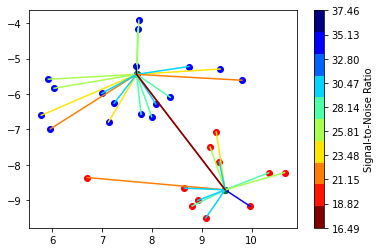

18
11

Power Allocated= 2.914471210117498
CSI= 0.7800799449670274
SNR= 21.319794449912393
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.248284
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.312656
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 2.673337

Power Allocated= 0
CSI= 0.15081081438808464
SNR= 16.492905078828976
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0569331651318787
CSI= 0.4674081139879881
SNR= 23.56835374940004
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.566690
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.779467
Model client4 Train Epoch: 3 [0/320 (0%)]	Loss: 2.392790

Power Allocated= 0
CSI= 0.038988653139164775
SNR= 29.779301234515763
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12850448344133092
SNR= 29.33355260793085
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.

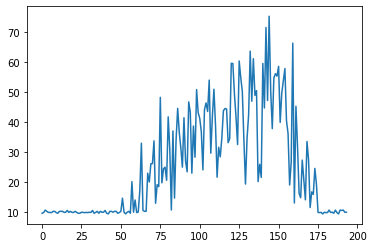

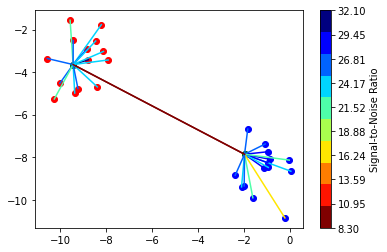

15
14

Power Allocated= 0
CSI= 0.2006244066072339
SNR= 8.304819566075626
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.213066085829439
CSI= 0.38281069561354275
SNR= 19.314706326776516
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.679320
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 1.094248
Model client7 Train Epoch: 3 [0/320 (0%)]	Loss: 0.924441

Power Allocated= 2.3425011304896963
CSI= 0.4027674690620284
SNR= 22.987182681265182
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.265552
Model client8 Train Epoch: 2 [0/320 (0%)]	Loss: 1.070469
Model client8 Train Epoch: 3 [0/320 (0%)]	Loss: 1.902043

Power Allocated= 3.6018929668683084
CSI= 0.8173738836189257
SNR= 26.79897163324135
Client: client10
Model client10 Train Epoch: 1 [0/320 (0%)]	Loss: 2.084401
Model client10 Train Epoch: 2 [0/320 (0%)]	Loss: 1.354250
Model client10 Train Epoch: 3 [0/320 (0%)]	Loss: 1.527950

Power Allocated= 3.3425527587225

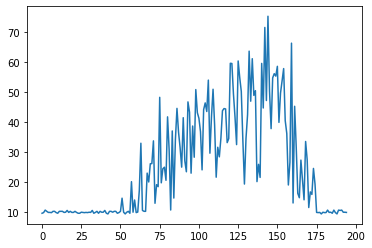

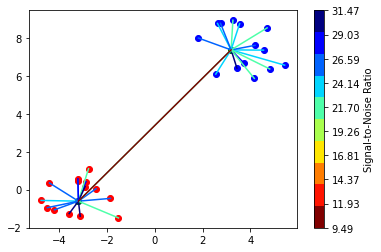

15
14

Power Allocated= 0.38428581303522336
CSI= 0.23258221253058986
SNR= 21.681633606767868
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.549412
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.234047
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 1.515452

Power Allocated= 1.6195277483173425
CSI= 0.3263374203750833
SNR= 23.97726697315837
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.557969
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.882417
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 2.991639

Power Allocated= 3.022151757468282
CSI= 0.6017973308161252
SNR= 25.061244364026255
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.576000
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.144536
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.107360

Power Allocated= 2.117052153362109
CSI= 0.38959188206532025
SNR= 28.904506540357797
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.402193
Model client6 Train 

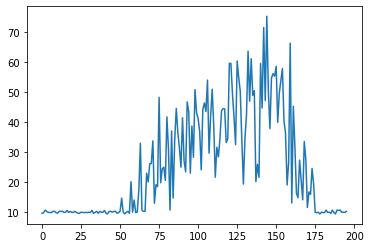

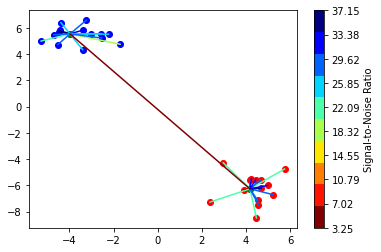

14
14

Power Allocated= 2.061163154690627
CSI= 0.47050196455416904
SNR= 17.4676457487668
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.663212
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.197763
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 1.134111

Power Allocated= 2.108434925268746
CSI= 0.4812046591781889
SNR= 28.27417200544577
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.109719
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.275943
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 3.740147

Power Allocated= 1.877617343460932
CSI= 0.4331000247087847
SNR= 34.39492358877658
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.295919
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.193748
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.167798

Power Allocated= 2.048426442415215
CSI= 0.46769920776316
SNR= 37.14995427882543
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.143624
Model client5 Train Epoch: 2 [

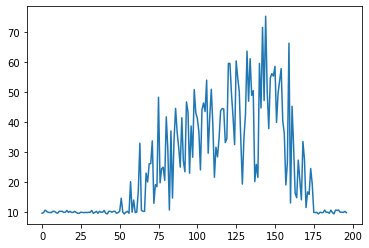

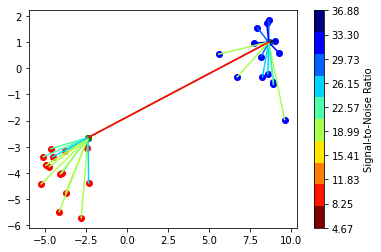

15
14

Power Allocated= 1.5888185171839502
CSI= 0.36110996841928067
SNR= 18.57005867444903
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.454536
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.223812
Model client1 Train Epoch: 3 [0/320 (0%)]	Loss: 1.103061

Power Allocated= 3.0553966252426497
CSI= 0.767659179512286
SNR= 23.58177285860345
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.084349
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.879448
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 1.449235

Power Allocated= 2.843197569207521
CSI= 0.6601267992130483
SNR= 28.508965136342802
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.344739
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.128125
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.113387

Power Allocated= 3.3051908183595007
CSI= 0.9497873716468219
SNR= 21.39149607844724
Client: client13
Model client13 Train Epoch: 1 [0/320 (0%)]	Loss: 2.440569
Model client13 Train E

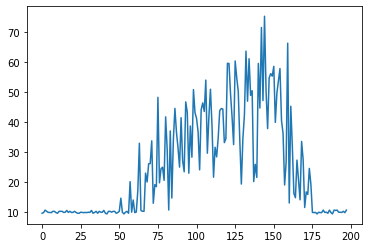

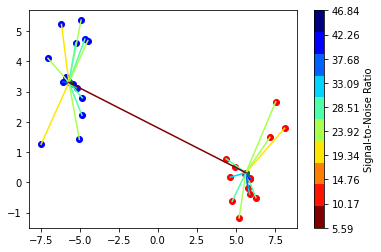

14
14

Power Allocated= 2.4579731682503327
CSI= 0.5323282195964607
SNR= 46.8437615581775
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.165875
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.108318
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.127768

Power Allocated= 0.9339107215334312
CSI= 0.29389267034751787
SNR= 32.30320061014481
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.423574
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.134355
Model client5 Train Epoch: 3 [0/320 (0%)]	Loss: 1.170417

Power Allocated= 1.6438110266283488
CSI= 0.37137412357513
SNR= 38.5177681127631
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.292208
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.118104
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 1.109863

Power Allocated= 2.7334101128972588
CSI= 0.6237901082870791
SNR= 27.01088912131778
Client: client8
Model client8 Train Epoch: 1 [0/320 (0%)]	Loss: 2.272221
Model client8 Train Epoch: 

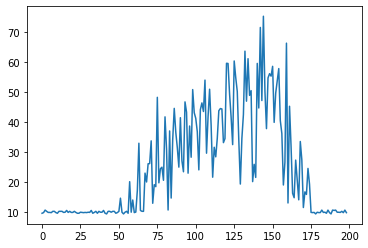

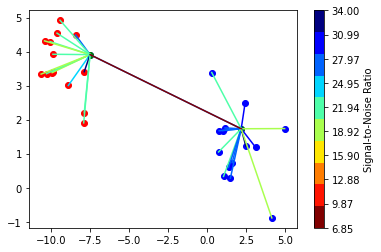

15
14

Power Allocated= 3.5883112701669724
CSI= 0.9231256624925315
SNR= 25.598514583085255
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.380653
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.915351
Model client2 Train Epoch: 3 [0/320 (0%)]	Loss: 1.224546

Power Allocated= 1.1143119037785665
CSI= 0.28111401535922387
SNR= 26.561211073918393
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.412213
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.117688
Model client3 Train Epoch: 3 [0/320 (0%)]	Loss: 1.206944

Power Allocated= 3.5083737990591013
CSI= 0.859687330468104
SNR= 17.23329855763086
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.434010
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.087711
Model client6 Train Epoch: 3 [0/320 (0%)]	Loss: 1.150284

Power Allocated= 0
CSI= 0.13563871711092002
SNR= 19.801219560367105
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.625109052933620

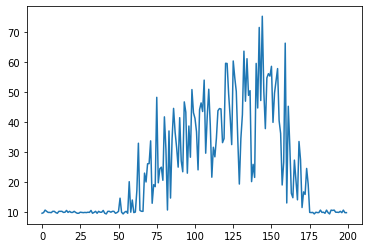

In [11]:
for client in clients: #give the model and optimizer to every client
    torch.manual_seed(args.torch_seed)
    client['model'] = Net().to(device)
    #client['model'] = torch.quantization.quantize_dynamic(
    #client['model'],  # the original model
    #{torch.nn.Linear},  # a set of layers to dynamically quantize
    #dtype=torch.fp)  # the target dtype for quantized weights
    client['optim'] = optim.SGD(client['model'].parameters(), lr=args.lr)
    
acc1=[]
acc2=[]
acf=[]
rc=1
temp=[]
snrplot=[]
for fed_round in range(args.rounds):
    overall=Net()
    if(True): #fed_round==0
        arranged_clusters=cluster_former()
        temp=copy.deepcopy(arranged_clusters)
    else:
        #print(temp)
        arranged_clusters=copy.deepcopy(temp)
    
    
    
# #     uncomment if you want a random fraction for C every round
# #     args.C = float(format(np.random.random(), '.1f'))
    
#     # number of selected clients
#     m = int(max(args.C * args.clients, 1)) #at least 1 client is selected for training

#     # Selected devices
#     np.random.seed(fed_round)
#     selected_clients_inds = np.random.choice(range(len(clients)), m, replace=False)#dont choose same client more than once
#     selected_clients = [clients[i] for i in selected_clients_inds]
    
#     # Active devices
#     np.random.seed(fed_round)
#     active_clients_inds = np.random.choice(selected_clients_inds, int((1-args.drop_rate) * m), replace=False) #drop clients
#     active_clients = [clients[i] for i in active_clients_inds]
    
    members1=arranged_clusters[0]['Members']
    members2=arranged_clusters[1]['Members']
    print(len(members1))
    print(len(members2))
    new_members1=[]
    new_members2=[]
    
    for ij in members1:
        #print(ij)
        cl_no=int(ij[6:])
        new_members1.append(clients[cl_no-1])
    for ij in members2:
        #print(ij)
        cl_no=int(ij[6:])
        new_members2.append(clients[cl_no-1])
    
    arranged_clusters[0]['Members']=new_members1
    arranged_clusters[1]['Members']=new_members2
    
    cl_no=int(arranged_clusters[0]['Cluster Head'][6:])
    arranged_clusters[0]['Cluster Head']=clients[cl_no-1]
    cl_no=int(arranged_clusters[1]['Cluster Head'][6:])
    arranged_clusters[1]['Cluster Head']=clients[cl_no-1]
        
        
        
    #training members of individual clusters and considering cluster head as the global server for the time slot
    no=1
    
    for cluster in arranged_clusters:  
        client_good_channel=[] #to check which clients have a good channel, only those will be taken for averaging per round
        members=cluster['Members']
        snrlist=cluster['SNR']
        csilist=cluster['CSI']
        head=cluster['Cluster Head']
        snr=[]
        csi=[]
        for i in snrlist:
            snr.append(i[2])
        for i in csilist:
            csi.append(i[2])
        print()
        #print(csi)
        smallmu1=0
        gsmall1=3.402823466E+38 
        
        #water filling algorithm
        mu=1e-15
        while(mu<=1):
            g1=0
            pn1=0
            for jj in csi:
                pn=max(1/mu-1/jj,0)
                g1+=math.log(1+pn*jj) #capacity of a channel (shannon's law)
                pn1+=pn
            g=g1-mu*(pn1-P*30)
            if(g<gsmall1):
                smallmu1=mu
                gsmall1=g
            mu+=0.00002
         
        good_mem=[]

        index=0
        for client in members:
            goodchannel=ClientUpdate(args, device, client,key_np,key,snr[index],csi[index],smallmu1)
            index+=1
            if(goodchannel):
                good_mem.append(client)


        head['model']=averageModels(head['model'], good_mem)
        ac=test(args,head['model'], device, global_test_loader, 'Cluster'+str(no),fed_round)
        no+=1
        # for client in members:
        #     client['model'].load_state_dict(head['model'].state_dict())
        # cluster['Members']=members
        # cluster['Cluster Head']['model'].load_state_dict(head['model'].state_dict())
        
        # if(cluster==arranged_clusters[0]):
        #     acc1.append(ac)
        # elif(cluster==arranged_clusters[1]):
        #     acc2.append(ac)
    
    # if(acc1[-1]>=acc2[-1]):
    #     head=arranged_clusters[0]["Cluster Head"]
    #     index=0
    #     for client in clients:
    #         client['model'].load_state_dict(head['model'].state_dict())
    #         client=CLientReturn(client,snr[index],csi[index],smallmu1)
    #         index+=1
    # else:
    #     head=arranged_clusters[1]["Cluster Head"]
    #     index=0
    #     for client in clients:
    #         client['model'].load_state_dict(head['model'].state_dict())
    #         client=CLientReturn(client,snr[index],csi[index],smallmu1)
    #         index+=1
    # acf.append(test(args,head['model'], device, global_test_loader, "Final",fed_round))


    snrsum1=0
    snrsum2=0
    for k in snrlist:
        if(arranged_clusters[0]["Cluster Head"]['hook'].id in k):
            snrsum1+=k[2]
        else:
            snrsum2+=k[2]
    
    #print(snrsum1,snrsum2)

    weight1=snrsum1/(snrsum1+snrsum2)
    weight2=snrsum2/(snrsum1+snrsum2)
    snrplot.append((snrsum1+snrsum2)/len(snrlist))
    
    head1=arranged_clusters[0]["Cluster Head"]
    head2=arranged_clusters[1]["Cluster Head"]
    
    overall=averageModelscluster(overall,[head1,head2],[weight1,weight2])
    acf.append(test(args,overall, device, global_test_loader, "Final ",fed_round))
    index=0
    # for client in clients:
    #     client['model'].load_state_dict(overall.state_dict())
    #     client=CLientReturn(client,snr[index],csi[index],smallmu1)
    #     index+=1
    for client in clients:
        client['model'].load_state_dict(overall.state_dict())
        #client=CLientReturn(client,snr[index],csi[index],smallmu1)  #CHANGE: commented
        index+=1





    print(rc)
    rc+=1
    
    fig,ax=plt.subplots()
    ax.plot([i for i in range(len(acf))],acf)
    plt.show()
plt.show()
#plt.savefig('result_cluster.png')

In [12]:
print(acf)
print(snrplot)

[9.62, 9.84, 10.67, 10.26, 9.9, 9.9, 9.82, 10.26, 10.26, 9.84, 9.62, 10.26, 10.26, 10.26, 9.9, 9.96, 10.56, 9.9, 10.26, 9.9, 9.9, 10.26, 9.9, 9.62, 9.62, 9.97, 9.9, 9.82, 9.9, 9.84, 9.96, 9.9, 10.56, 9.62, 9.9, 10.26, 9.62, 10.26, 9.96, 9.96, 10.56, 9.62, 9.4, 10.26, 10.26, 9.96, 10.26, 10.26, 9.62, 9.84, 10.26, 14.64, 9.96, 9.4, 9.97, 10.26, 9.62, 20.13, 9.97, 14.03, 9.84, 10.02, 17.24, 32.93, 10.56, 10.27, 10.26, 22.98, 20.03, 26.09, 26.15, 33.72, 12.94, 19.13, 18.48, 48.21, 19.75, 24.43, 24.95, 20.59, 41.71, 30.89, 10.7, 37.02, 14.68, 34.12, 44.53, 36.61, 31.46, 24.97, 41.43, 27.07, 23.43, 46.69, 43.26, 22.96, 38.66, 28.27, 50.79, 43.09, 41.21, 36.74, 24.06, 44.11, 46.35, 43.49, 53.94, 29.61, 41.79, 50.9, 38.91, 21.62, 31.59, 28.4, 34.6, 43.75, 44.47, 44.34, 33.13, 34.48, 59.54, 59.47, 49.33, 41.62, 32.47, 60.31, 54.81, 50.17, 33.89, 19.34, 34.52, 42.46, 63.58, 46.92, 61.07, 48.86, 50.43, 20.15, 25.9, 21.55, 59.5, 44.66, 71.47, 47.14, 75.2, 50.24, 37.79, 54.68, 56.08, 55.27, 58.53, 